In [1]:
#Downlaod relevant libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.stattools import adfuller
!pip install ruptures
import ruptures as rpt

Defaulting to user installation because normal site-packages is not writeable


In [2]:
#Downlaod data set
data = pd.read_csv(r"C:\Users\uresha\Dropbox\PC\Desktop\UH\Project\Data\Death and Incidence.csv")

#Check first few raws
print(data.head(10))
print(data.tail(10))

   measure_id measure_name  location_id location_name  sex_id sex_name  \
0           1       Deaths          130        Mexico       1     Male   
1           1       Deaths          130        Mexico       2   Female   
2           1       Deaths          130        Mexico       1     Male   
3           1       Deaths          130        Mexico       2   Female   
4           1       Deaths          130        Mexico       1     Male   
5           1       Deaths          130        Mexico       2   Female   
6           1       Deaths          130        Mexico       1     Male   
7           1       Deaths          130        Mexico       2   Female   
8           1       Deaths          130        Mexico       1     Male   
9           1       Deaths          130        Mexico       2   Female   

   age_id     age_name  cause_id    cause_name  metric_id metric_name  year  \
0       8  15-19 years       417  Liver cancer          1      Number  2000   
1       8  15-19 years     

In [3]:
#PREPRCOSESSING

#Shape of the dataset
print(f'Death : {data.shape}')

Death : (500000, 16)


In [4]:
#Check types of the data and values
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 16 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   measure_id     500000 non-null  int64  
 1   measure_name   500000 non-null  object 
 2   location_id    500000 non-null  int64  
 3   location_name  500000 non-null  object 
 4   sex_id         500000 non-null  int64  
 5   sex_name       500000 non-null  object 
 6   age_id         500000 non-null  int64  
 7   age_name       500000 non-null  object 
 8   cause_id       500000 non-null  int64  
 9   cause_name     500000 non-null  object 
 10  metric_id      500000 non-null  int64  
 11  metric_name    500000 non-null  object 
 12  year           500000 non-null  int64  
 13  val            500000 non-null  float64
 14  upper          500000 non-null  float64
 15  lower          500000 non-null  float64
dtypes: float64(3), int64(7), object(6)
memory usage: 61.0+ MB
None


In [5]:
#Missing values
print(data.isnull().sum())

measure_id       0
measure_name     0
location_id      0
location_name    0
sex_id           0
sex_name         0
age_id           0
age_name         0
cause_id         0
cause_name       0
metric_id        0
metric_name      0
year             0
val              0
upper            0
lower            0
dtype: int64


In [6]:
#Summary statistics
print(data.describe())

          measure_id    location_id         sex_id         age_id  \
count  500000.000000  500000.000000  500000.000000  500000.000000   
mean        3.473520     106.192976       1.510868      25.586304   
std         2.499862      57.497623       0.499882      35.917815   
min         1.000000       6.000000       1.000000       8.000000   
25%         1.000000      67.000000       1.000000      12.000000   
50%         1.000000      95.000000       2.000000      15.000000   
75%         6.000000     135.000000       2.000000      19.000000   
max         6.000000     214.000000       2.000000     160.000000   

            cause_id  metric_id           year            val         upper  \
count  500000.000000   500000.0  500000.000000  500000.000000  5.000000e+05   
mean      527.995928        1.0    2010.500000    1754.321156  2.384101e+03   
std       187.392020        0.0       6.343893   18313.628337  2.676404e+04   
min       411.000000        1.0    2000.000000       0.000000 

Outliers for Deaths:
Empty DataFrame
Columns: [measure_id, measure_name, location_id, location_name, sex_id, sex_name, age_id, age_name, cause_id, cause_name, metric_id, metric_name, year, val, upper, lower]
Index: []

Outliers for Incidence:
Empty DataFrame
Columns: [measure_id, measure_name, location_id, location_name, sex_id, sex_name, age_id, age_name, cause_id, cause_name, metric_id, metric_name, year, val, upper, lower]
Index: []


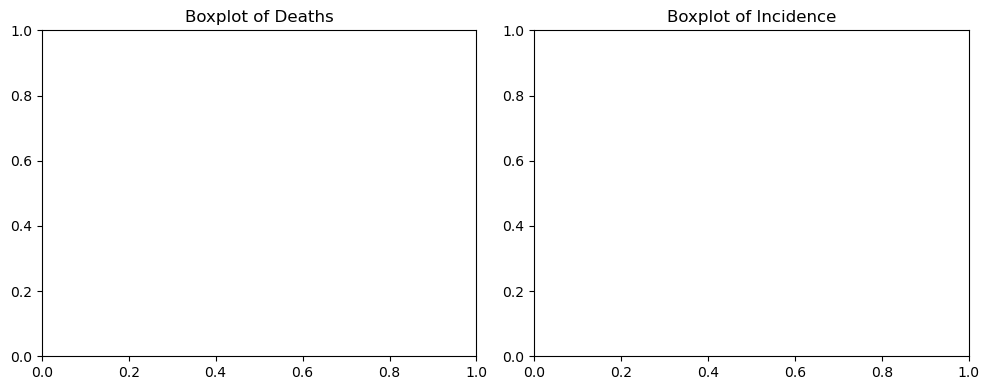

In [7]:
#Identify the outliers

#Filter data for deaths and incidence
deaths_data = data[data['measure_name'] == 'deaths']
incidence_data = data[data['measure_name'] == 'incidence']

#Calculate Q1 and Q3 for deaths
Q1_deaths = deaths_data['val'].quantile(0.25)
Q3_deaths = deaths_data['val'].quantile(0.75)
IQR_deaths = Q3_deaths - Q1_deaths

#Identify outliers for deaths
outliers_deaths = (deaths_data['val'] < (Q1_deaths - 1.5 * IQR_deaths)) | (deaths_data['val'] > (Q3_deaths + 1.5 * IQR_deaths))
outliers_deaths_df = deaths_data[outliers_deaths]

#Calculate Q1 and Q3 for incidence
Q1_incidence = incidence_data['val'].quantile(0.25)
Q3_incidence = incidence_data['val'].quantile(0.75)
IQR_incidence = Q3_incidence - Q1_incidence

#Identify outliers for incidence
outliers_incidence = (incidence_data['val'] < (Q1_incidence - 1.5 * IQR_incidence)) | (incidence_data['val'] > (Q3_incidence + 1.5 * IQR_incidence))
outliers_incidence_df = incidence_data[outliers_incidence]

#Print the result
print("Outliers for Deaths:")
print(outliers_deaths_df)

print("\nOutliers for Incidence:")
print(outliers_incidence_df)

#Visualize the boxplots

plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
sns.boxplot(data=deaths_data['val'])
plt.title('Boxplot of Deaths')

plt.subplot(1, 2, 2)
sns.boxplot(data=incidence_data['val'])
plt.title('Boxplot of Incidence')

plt.tight_layout()
plt.show()

In [8]:
#Identify the duplicates
duplicates = data.duplicated().sum()
print(f'Number of duplicate rows: {duplicates}')

Number of duplicate rows: 0


In [9]:
#Rename the location name and cause name
data['location_name'] = data['location_name'].replace('United Kingdom of Great Britain and Northern Ireland', 'United Kingdom')

#Print the list of location to verify
print(data['location_name'].unique())


['Mexico' 'Brazil' 'France' 'Japan' 'Poland' 'South Africa' 'Nigeria'
 'India' 'United Kingdom' 'China' 'United States of America' 'Australia']


In [10]:
# Create a mapping dictionary for cancer cause names and their abbreviations
can_cause_abbreviations = {
    "Bladder cancer": "BC",
    "Brain and central nervous system cancer": "BCNS",
    "Breast cancer": "BrC",
    "Cervical cancer": "CC",
    "Colon and rectum cancer": "CRC",
    "Esophageal cancer": "EsC",
    "Eye cancer": "EC",
    "Gallbladder and biliary tract cancer": "GBC",
    "Hodgkin lymphoma": "HL",
    "Kidney cancer": "KC",
    "Larynx cancer": "LC",
    "Leukemia": "Leuk",
    "Lip and oral cavity cancer": "LOCC",
    "Liver cancer": "LvrC",
    "Malignant neoplasm of bone and articular cartilage": "MNBAC",
    "Malignant skin melanoma": "MSM",
    "Mesothelioma": "Mes",
    "Multiple myeloma": "MM",
    "Nasopharynx cancer": "NC",
    "Neuroblastoma and other peripheral nervous cell tumors": "NPNCT",
    "Non-Hodgkin lymphoma": "NL",
    "Non-melanoma skin cancer": "NSC",
    "Other malignant neoplasms": "OMN",
    "Other neoplasms": "ON",
    "Other pharynx cancer": "OPC",
    "Ovarian cancer": "OC",
    "Pancreatic cancer": "PanC",
    "Prostate cancer": "ProsC",
    "Soft tissue and other extraosseous sarcomas": "STES",
    "Stomach cancer": "SC",
    "Testicular cancer": "TC",
    "Thyroid cancer": "ThyC",
    "Tracheal, bronchus, and lung cancer": "TBLC",
    "Uterine cancer": "UC"
}

#Create a new column for the abbreviations
data['cause_abbreviation'] = data['cause_name'].replace(can_cause_abbreviations)

#Check the updated DataFrame
print(data[['cause_name', 'cause_abbreviation']].head())


     cause_name cause_abbreviation
0  Liver cancer               LvrC
1  Liver cancer               LvrC
2  Liver cancer               LvrC
3  Liver cancer               LvrC
4  Liver cancer               LvrC


In [11]:
#EDA

#COUNTRY WISE TOTAL COUNT 

#Number of entries for each country
Country_count = data['location_name'].value_counts()
print(Country_count)


#AGE WISE TOTAL COUNT 

#Number of entries for each age group
Age_count = data['age_name'].value_counts().sort_index()
print(Age_count)


location_name
France                      43582
Japan                       43582
Poland                      43582
China                       43582
United States of America    43582
Australia                   43582
Mexico                      43006
United Kingdom              42270
Brazil                      39216
India                       38196
South Africa                38108
Nigeria                     37712
Name: count, dtype: int64
age_name
0-14 years     22924
15-19 years    27880
20-24 years    32242
25-29 years    32274
30-34 years    32098
35-39 years    32138
40-44 years    32118
45-49 years    32010
50-54 years    31966
55-59 years    31966
60-64 years    31966
65-69 years    31966
70-74 years    32186
75-79 years    32170
80-84 years    32010
85+ years      32086
Name: count, dtype: int64


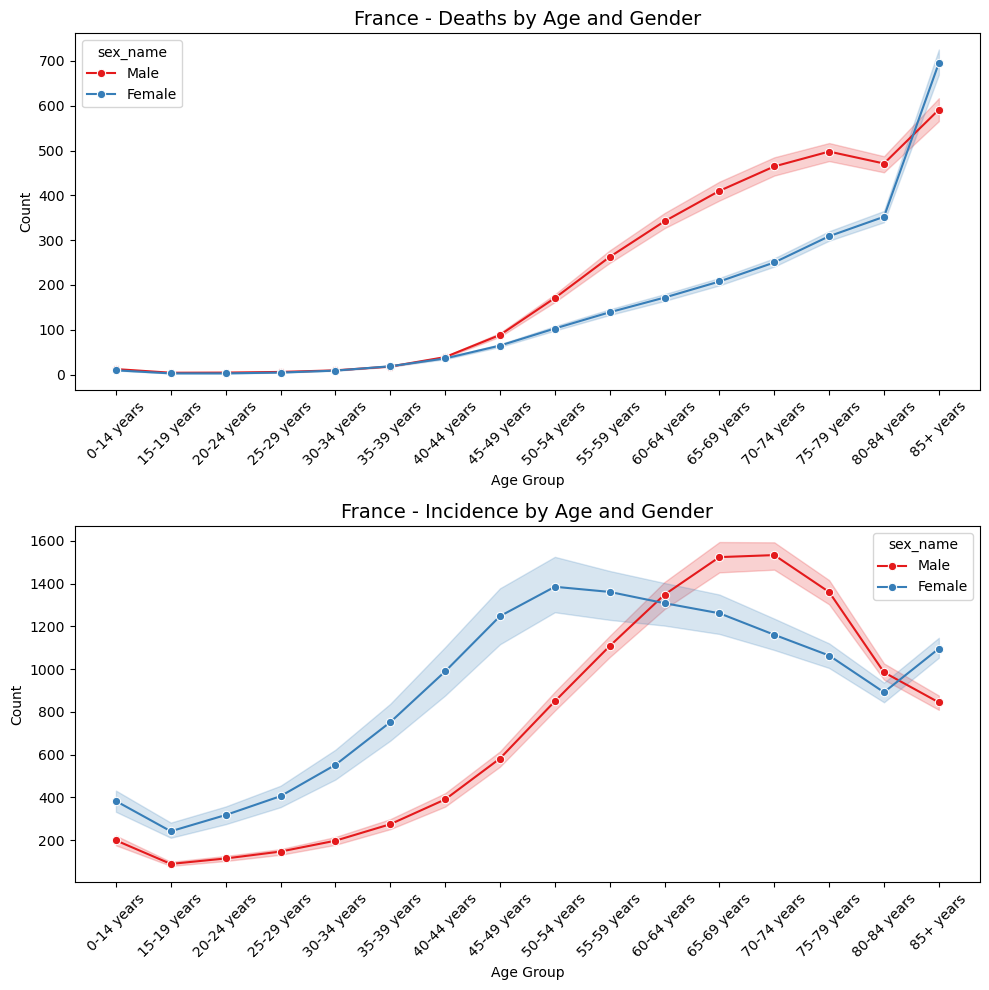

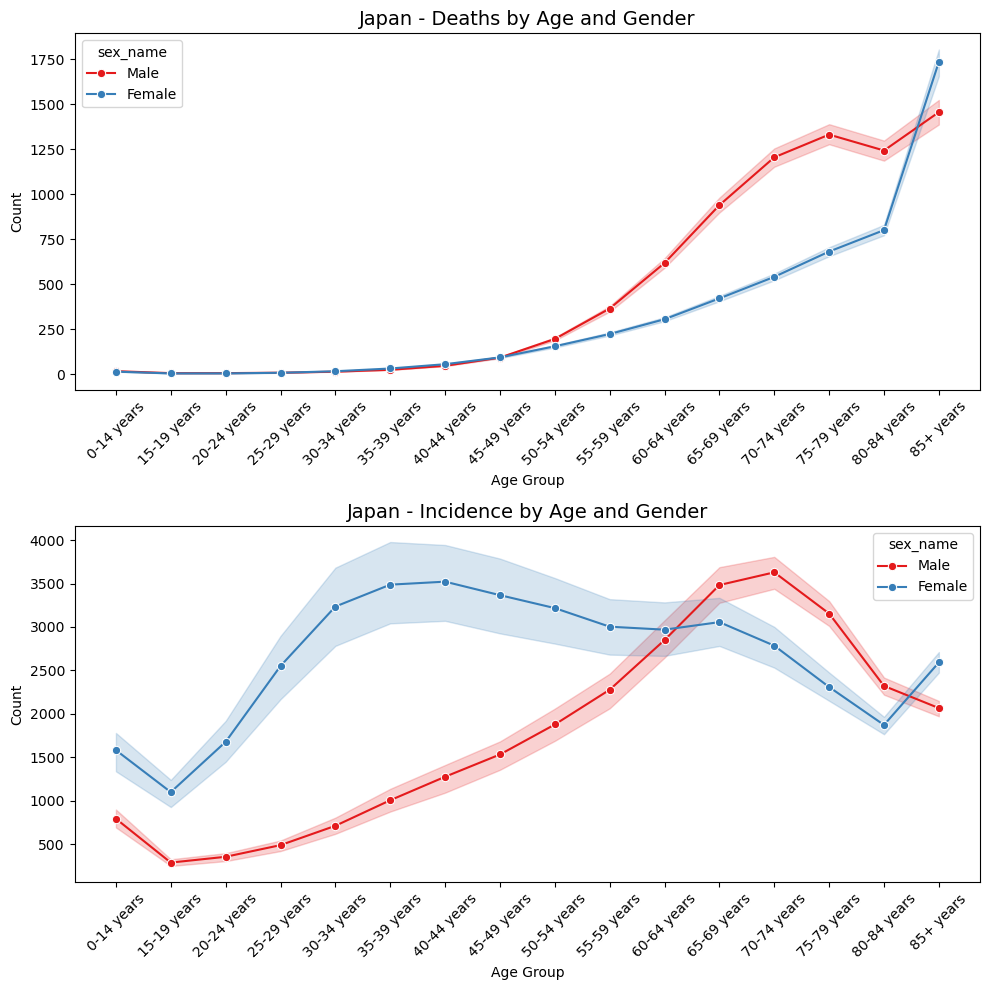

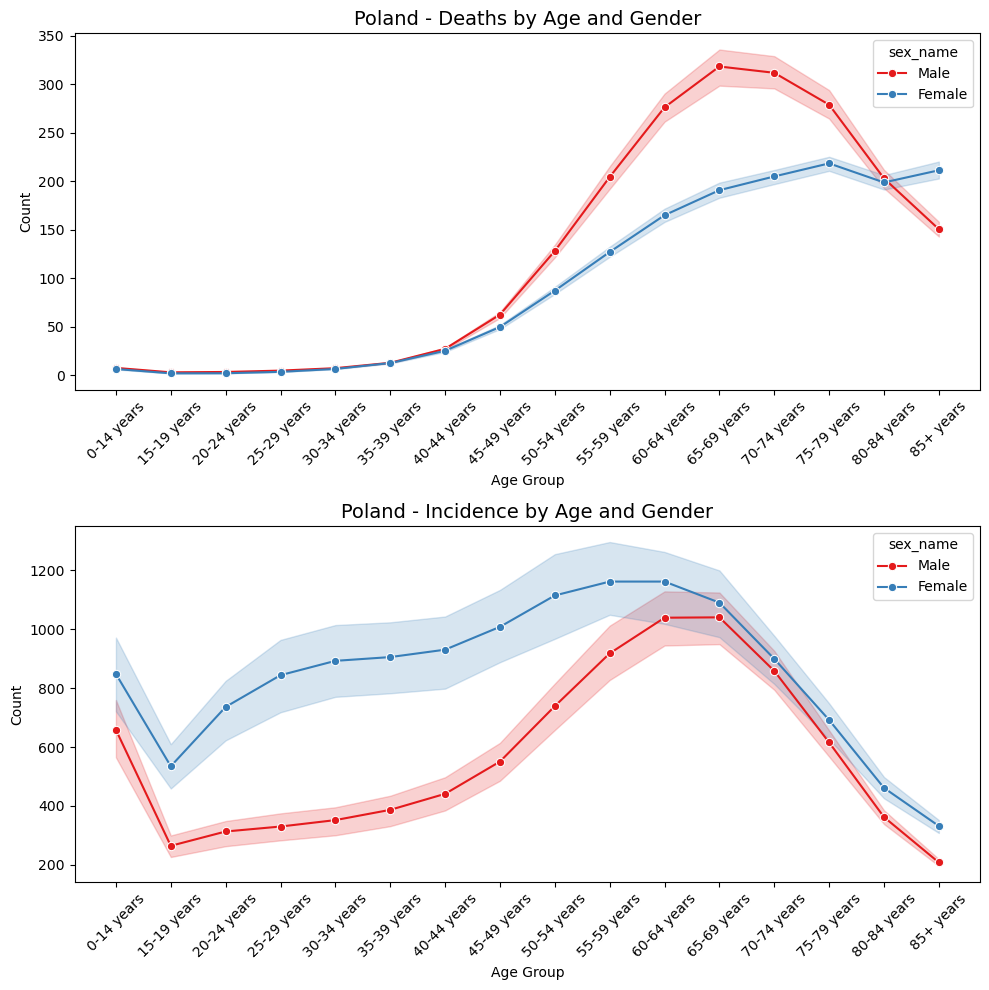

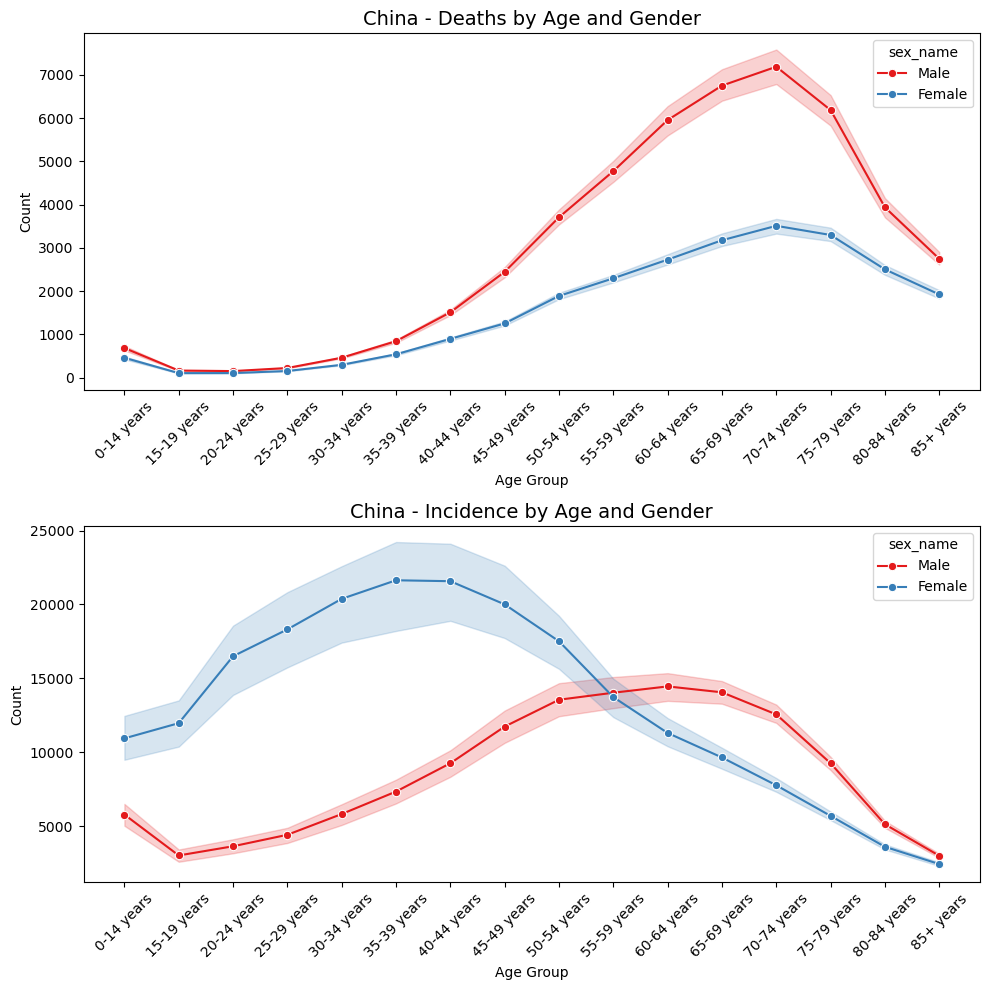

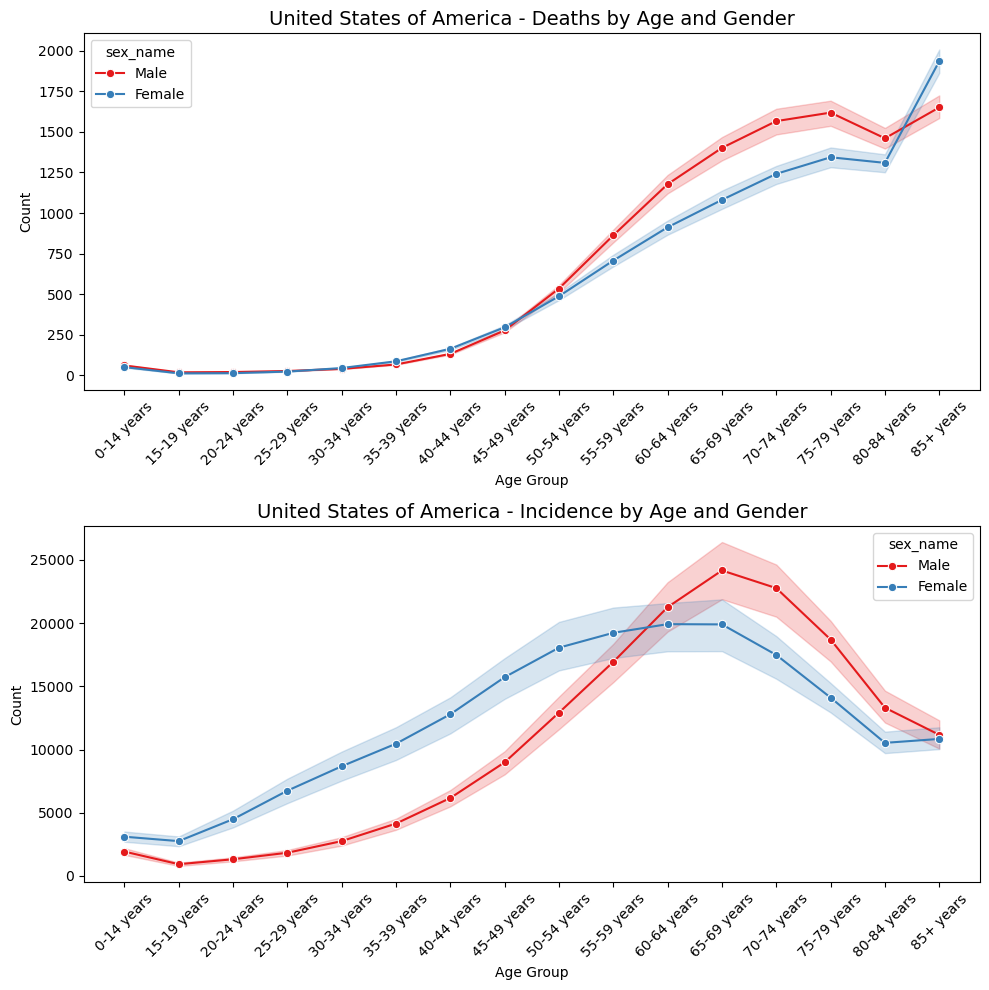

...

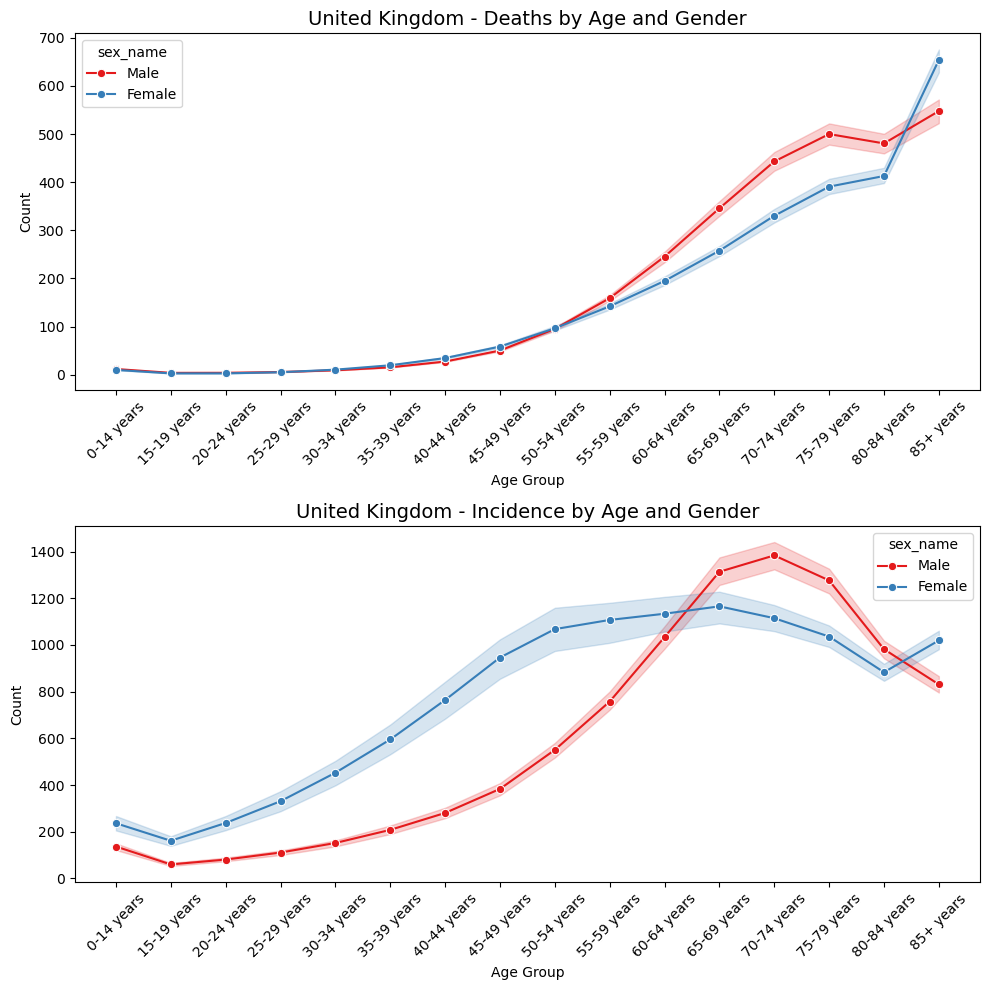

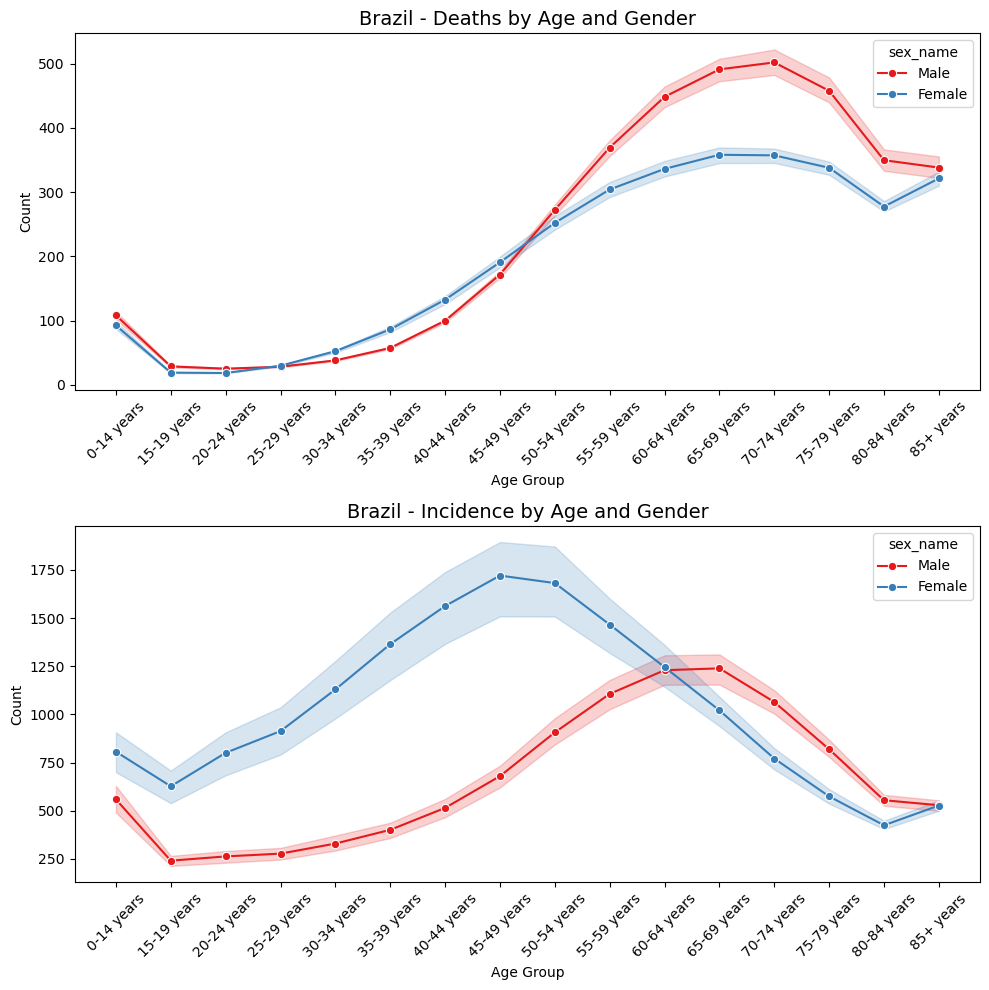

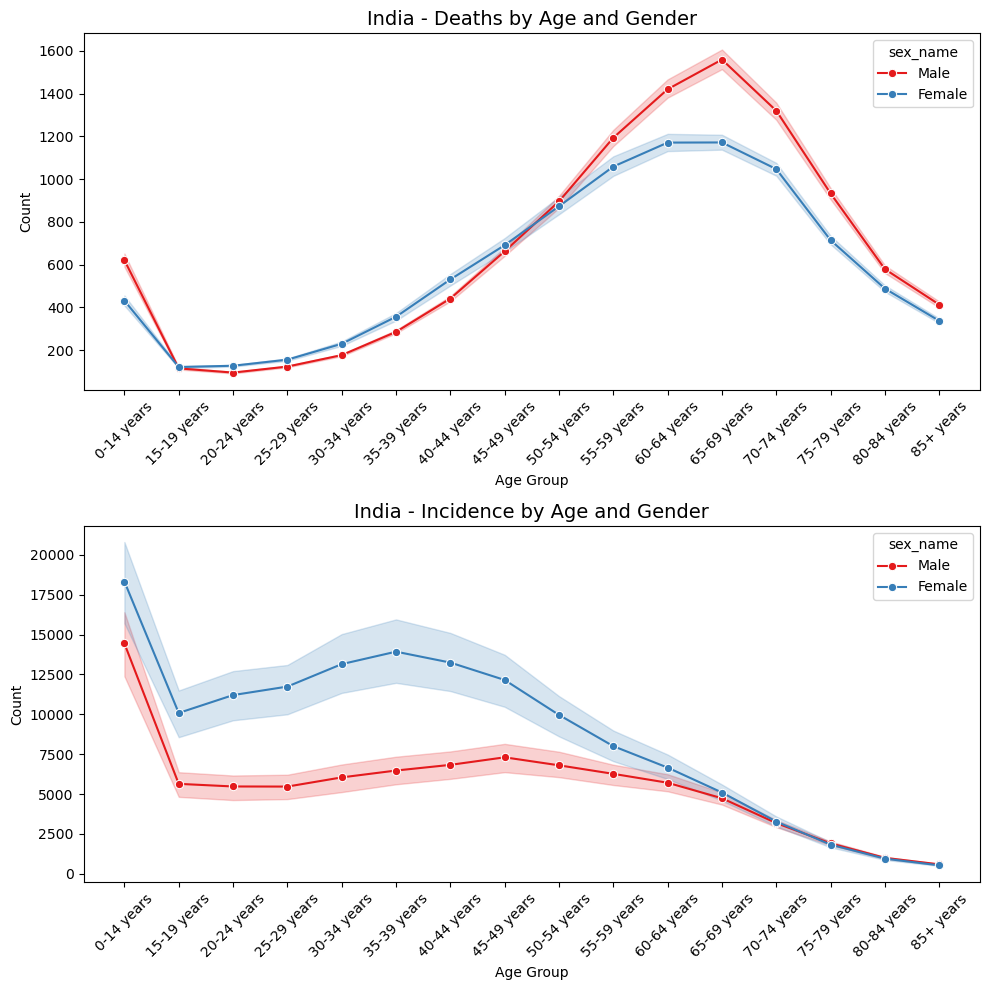

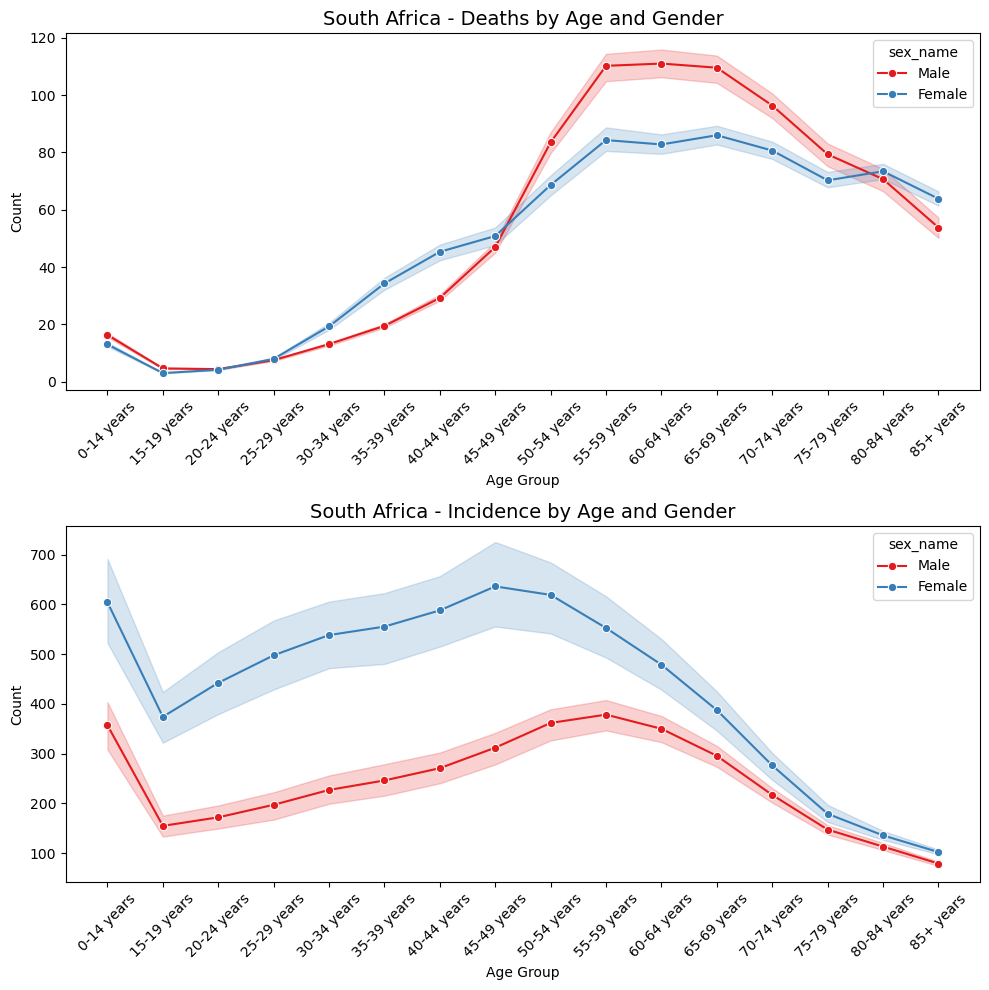

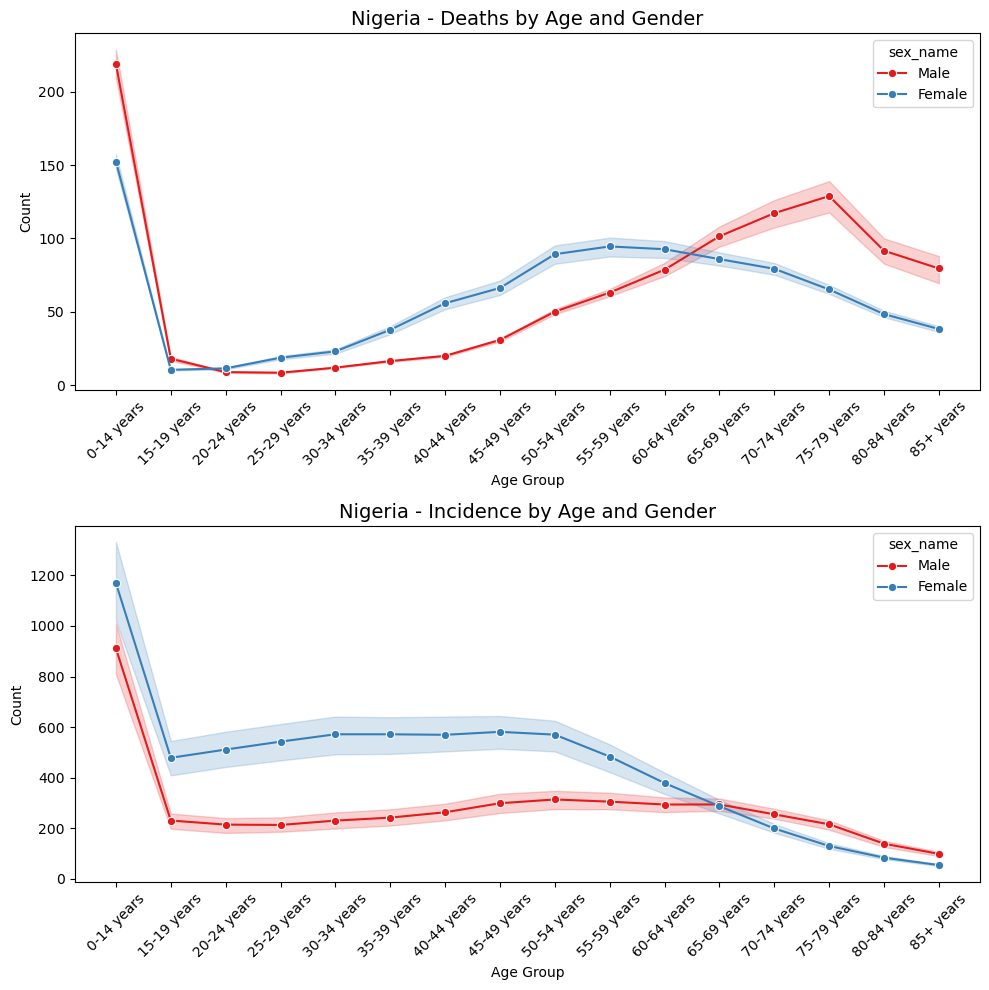

In [12]:
#DISTRIBUTION OF AGE GROUP AND GENDER BY COUNTRY

#Convert 'age_name' to categorical and sort to order
data['age_name'] = pd.Categorical(data['age_name'], categories = sorted(data['age_name'].unique()), ordered = True)

#Retrieve the top 12 countries
countries = data['location_name'].value_counts().index[:12]

#Define color palettes for 'Deaths' and 'Incidence'
palette_deaths = sns.color_palette("Set1", n_colors=2)  
palette_incidence = sns.color_palette("Set1", n_colors=2) 

#Separate graphs for each country and measure
for country in countries:
    #Create a new graph for each country
    plt.figure(figsize = (10, 10))  

    #Initialize a counter for subplots
    subplot_index = 1

    #Filter data for the current country
    country_data = data[data['location_name'] == country]

    #Separate 'Deaths' and 'Incidence'
    for measure in ['Deaths', 'Incidence']:
        measure_data = country_data[country_data['measure_name'] == measure]

        # Choose the palette based on the measure
        if measure == 'Deaths':
            palette = palette_deaths
        else:
            palette = palette_incidence

        # Create a subplot 
        plt.subplot(2, 1, subplot_index)

        # Create line plot for each measure with the chosen palette
        sns.lineplot(x = 'age_name', y = 'val', hue = 'sex_name', data=measure_data, palette = palette, marker = 'o', errorbar=('ci', 50))

        # Add labels, titles, and font sizes
        plt.title(f'{country} - {measure.capitalize()} by Age and Gender', fontsize = 14)
        plt.xlabel('Age Group', fontsize = 10)
        plt.ylabel('Count', fontsize = 10)
        plt.xticks(rotation = 45, fontsize = 10)

        subplot_index += 1  

    #Print the plot
    plt.tight_layout()
    plt.show()

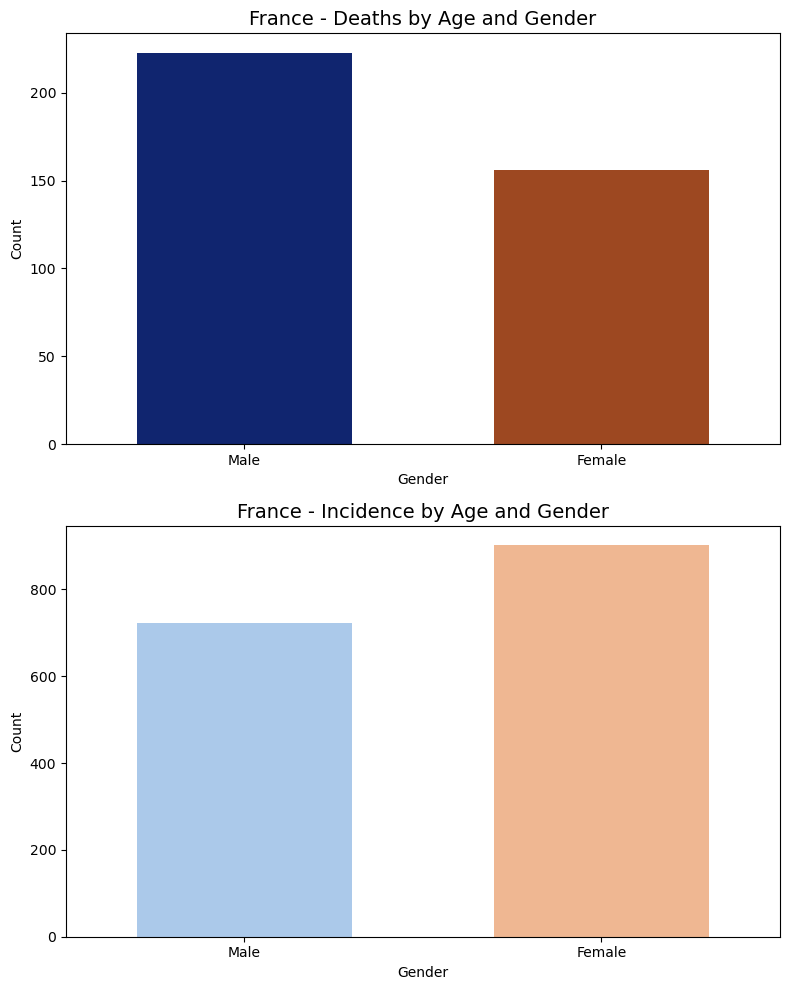

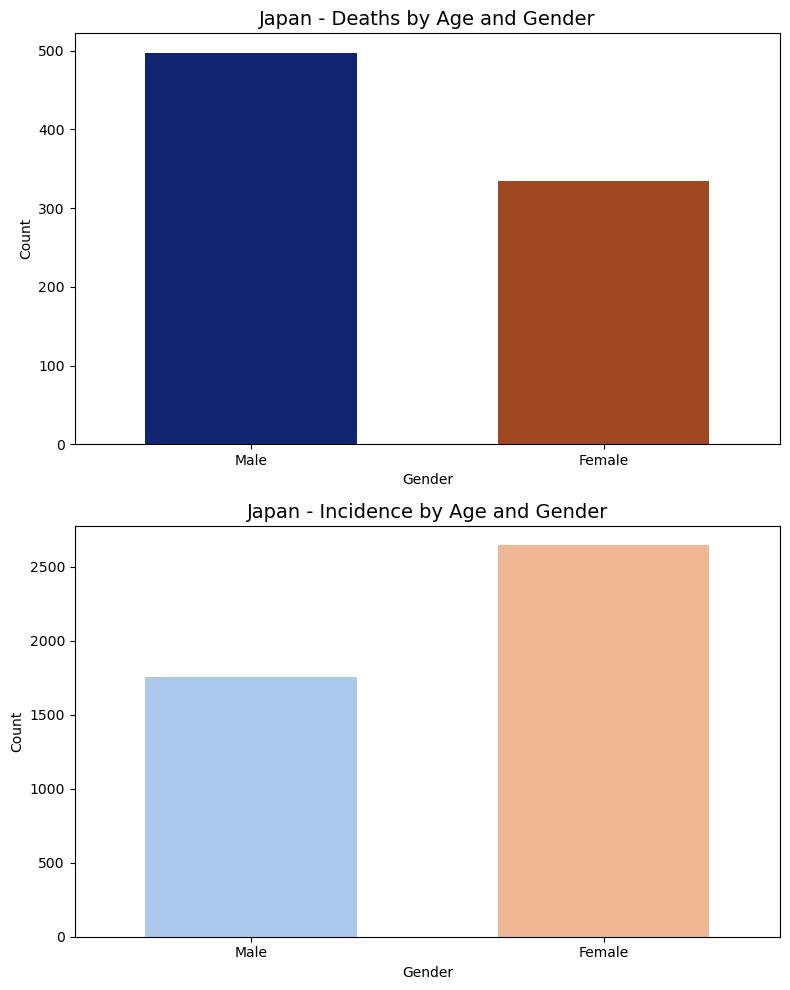

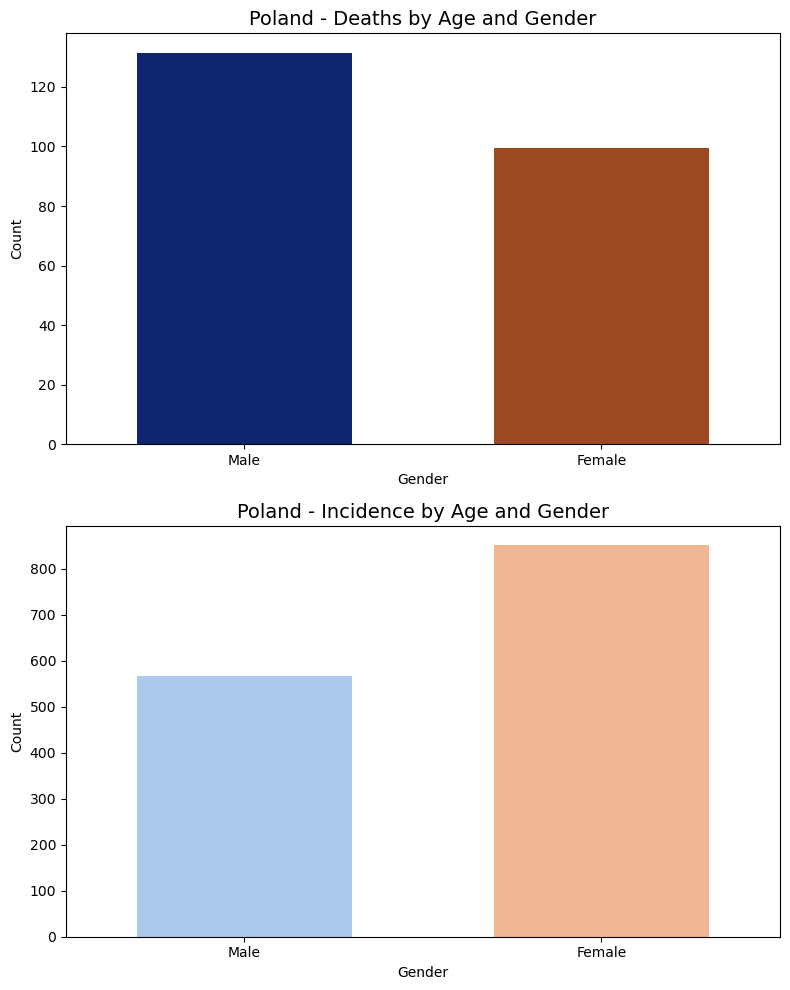

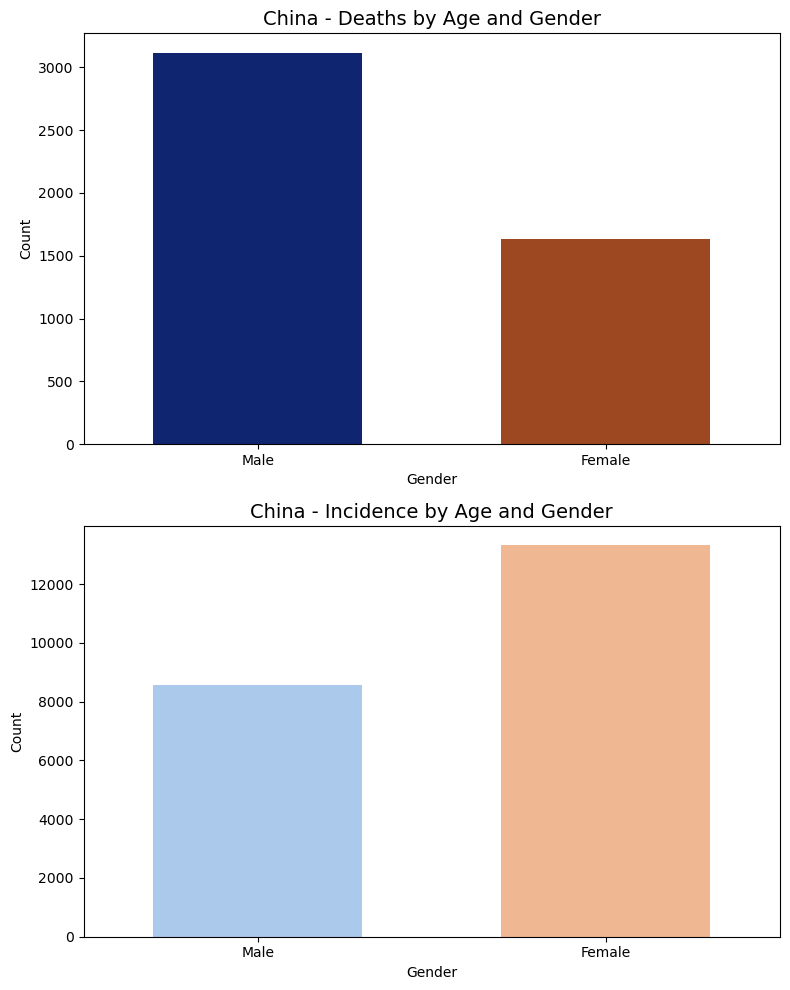

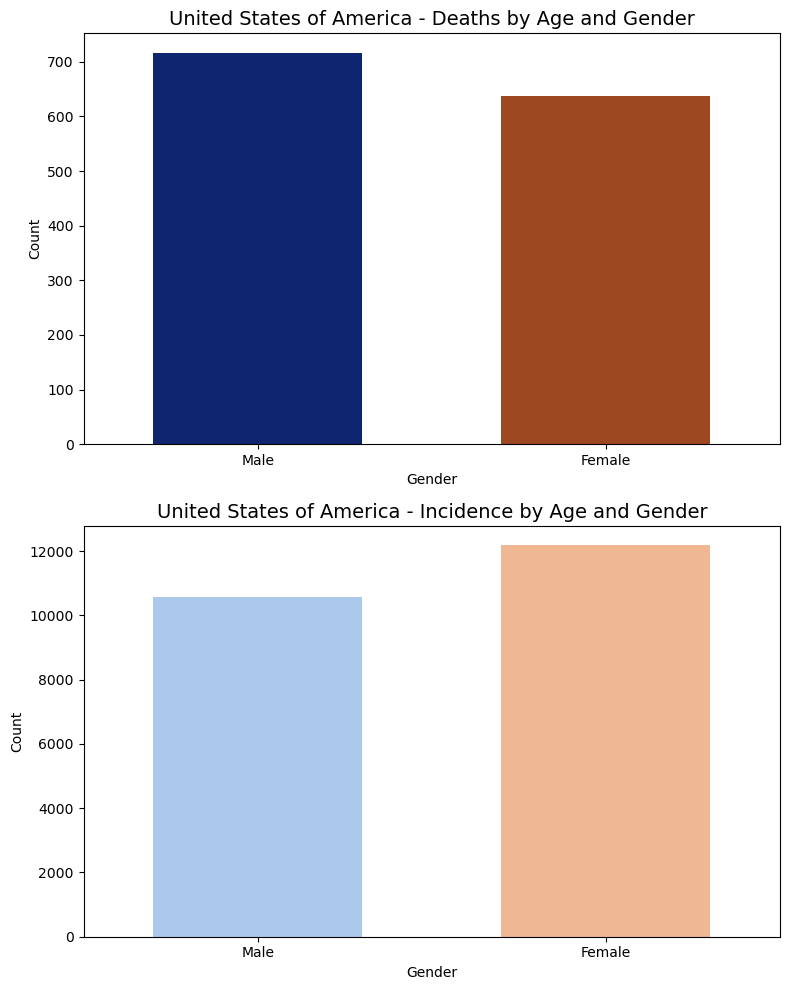

...

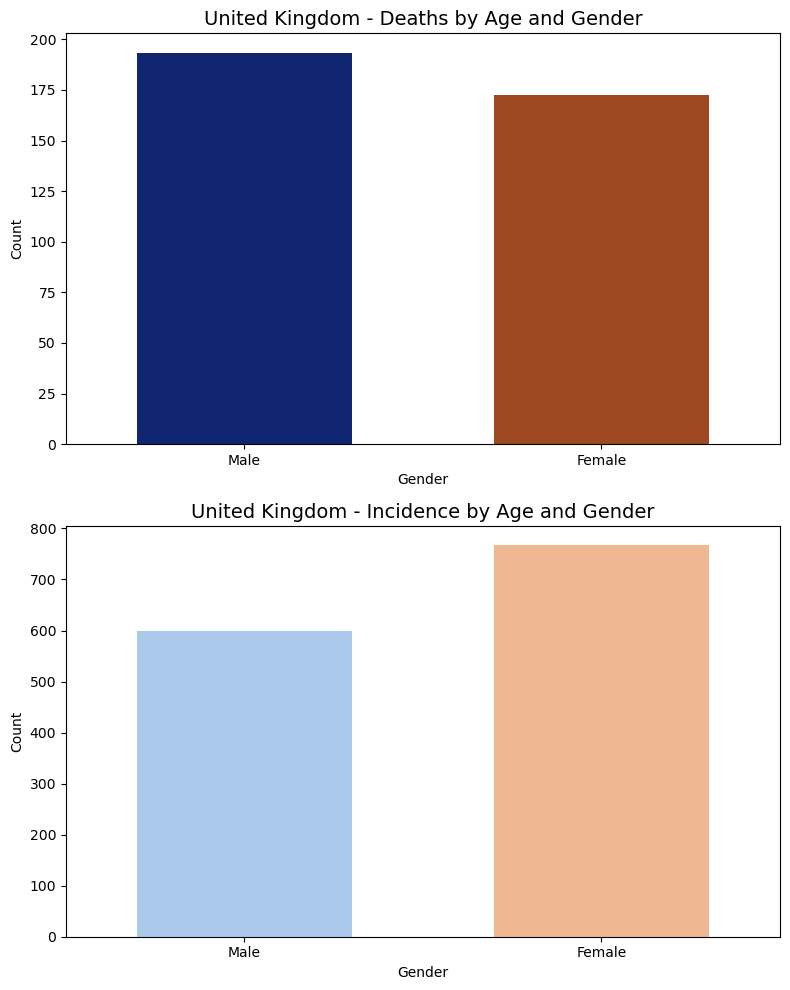

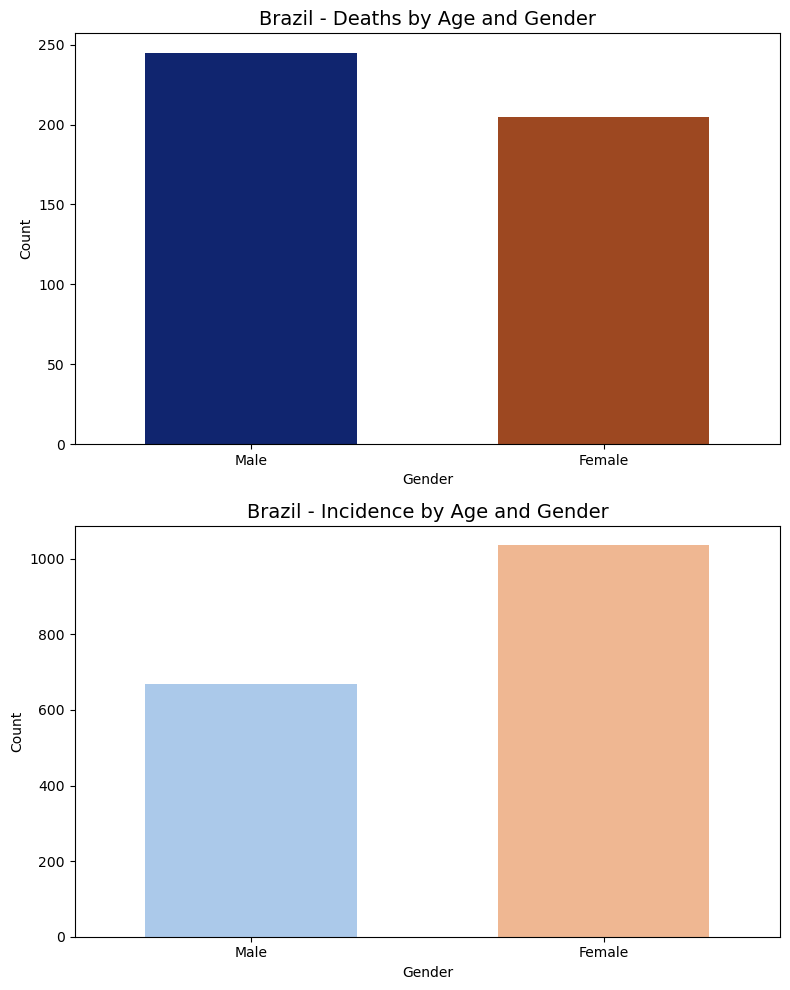

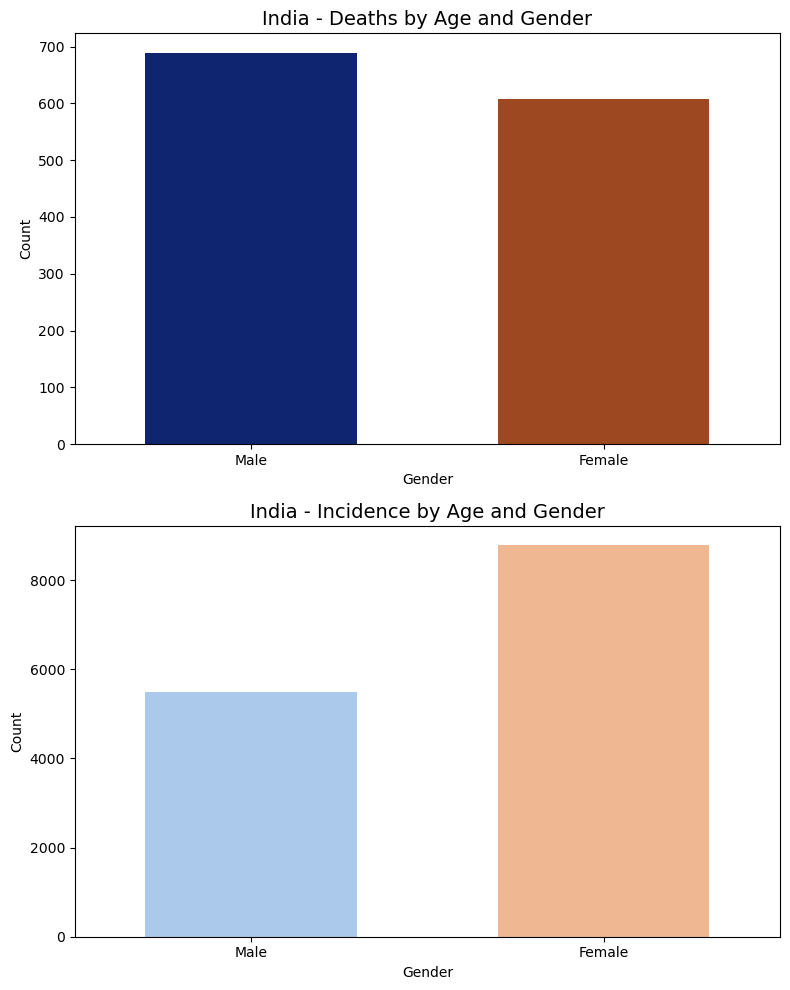

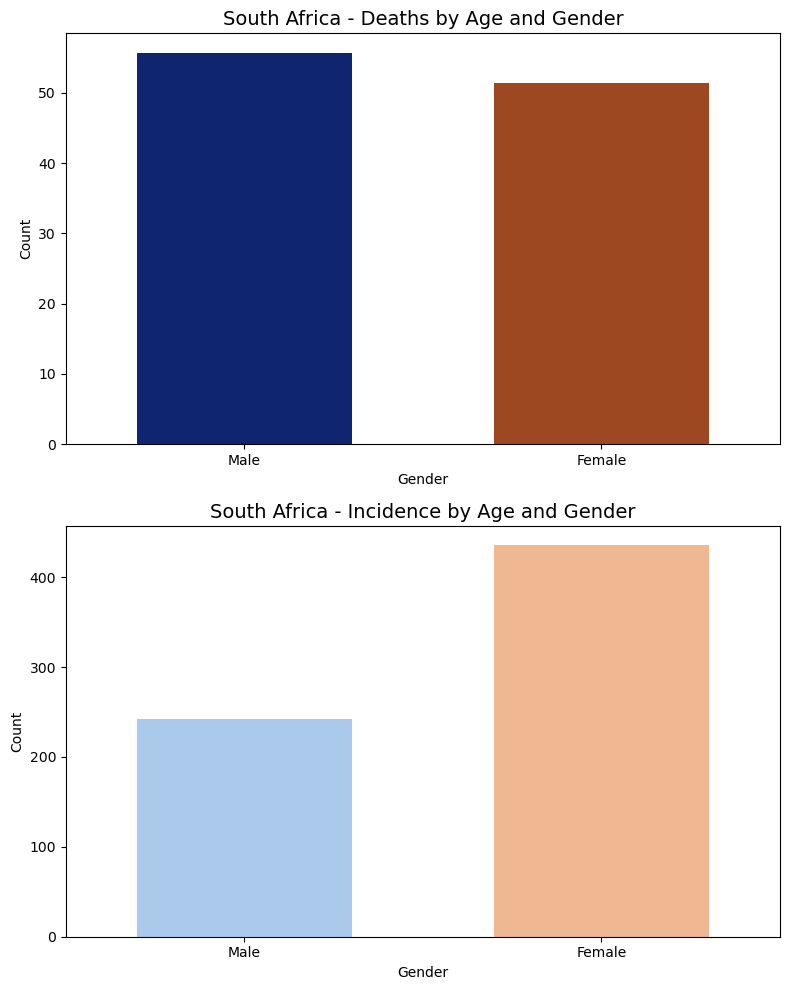

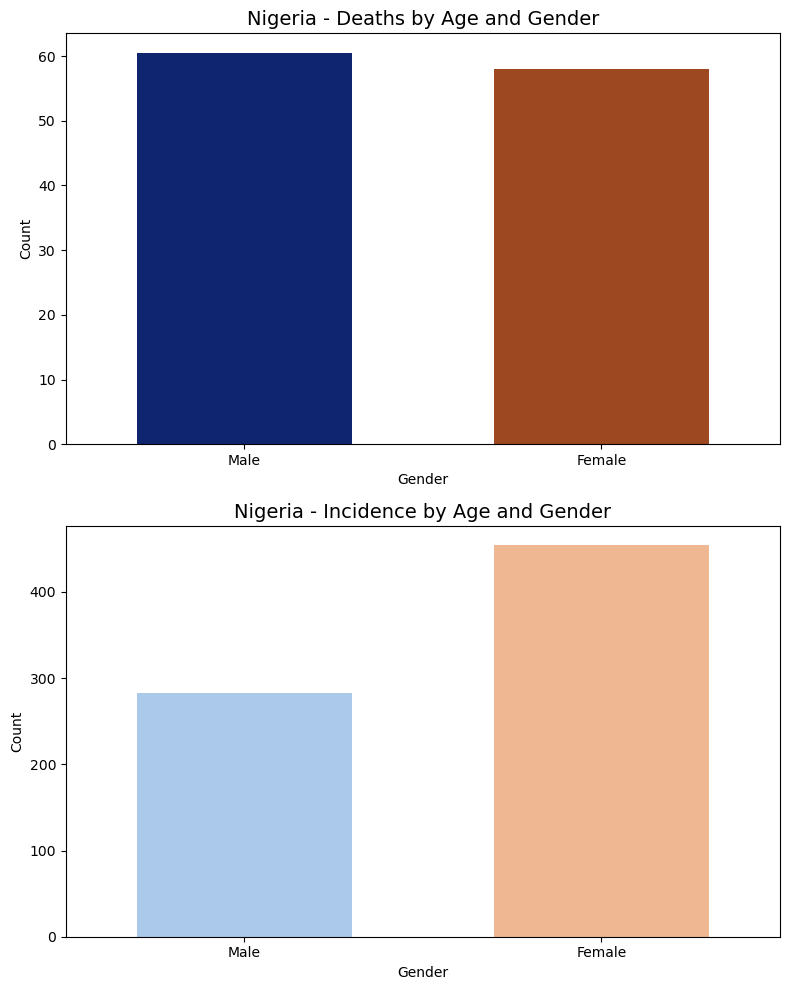

In [13]:
#DISTRIBUTION OF GENDER BY COUNTRY

#Retrieve the countries
countries = data['location_name'].value_counts().index[:12]

#Define color palettes for 'Male' and 'Female'
palette_deaths = sns.color_palette("dark", n_colors=2)  
palette_incidence = sns.color_palette("pastel", n_colors=2)  

#Separate graphs for each country and measure
for country in countries:
    # Create a new graph for each country
    plt.figure(figsize=(8, 10)) 

    #Initialize a counter for subplots
    subplot_index = 1

    #Filter data for the current country
    country_data = data[data['location_name'] == country]

    #Separate 'Deaths' and 'Incidence'
    for measure in ['Deaths', 'Incidence']:
        measure_data = country_data[country_data['measure_name'] == measure]

        #Choose the palette based on the measure
        palette = palette_deaths if measure == 'Deaths' else palette_incidence

        #Create a subplot 
        plt.subplot(2, 1, subplot_index)

        #Create a multiple bar plot with age and gender distribution, without legend
        barplot = sns.barplot(
            x='sex_name', y = 'val', hue = 'sex_name', data = measure_data, palette = palette, errorbar=None, dodge = False, width = 0.6)
        
        #Set labels and title with font sizes
        plt.title(f'{country} - {measure.capitalize()} by Age and Gender', fontsize=14)
        plt.xlabel('Gender', fontsize = 10)
        plt.ylabel('Count', fontsize = 10)

        #Set x-axis labels to 'Male' and 'Female'
        barplot.set_xticks([0, 1])
        barplot.set_xticklabels(['Male', 'Female'], fontsize=10)

        subplot_index += 1  

    #Adjust layout and show the plot
    plt.tight_layout()
    plt.show()

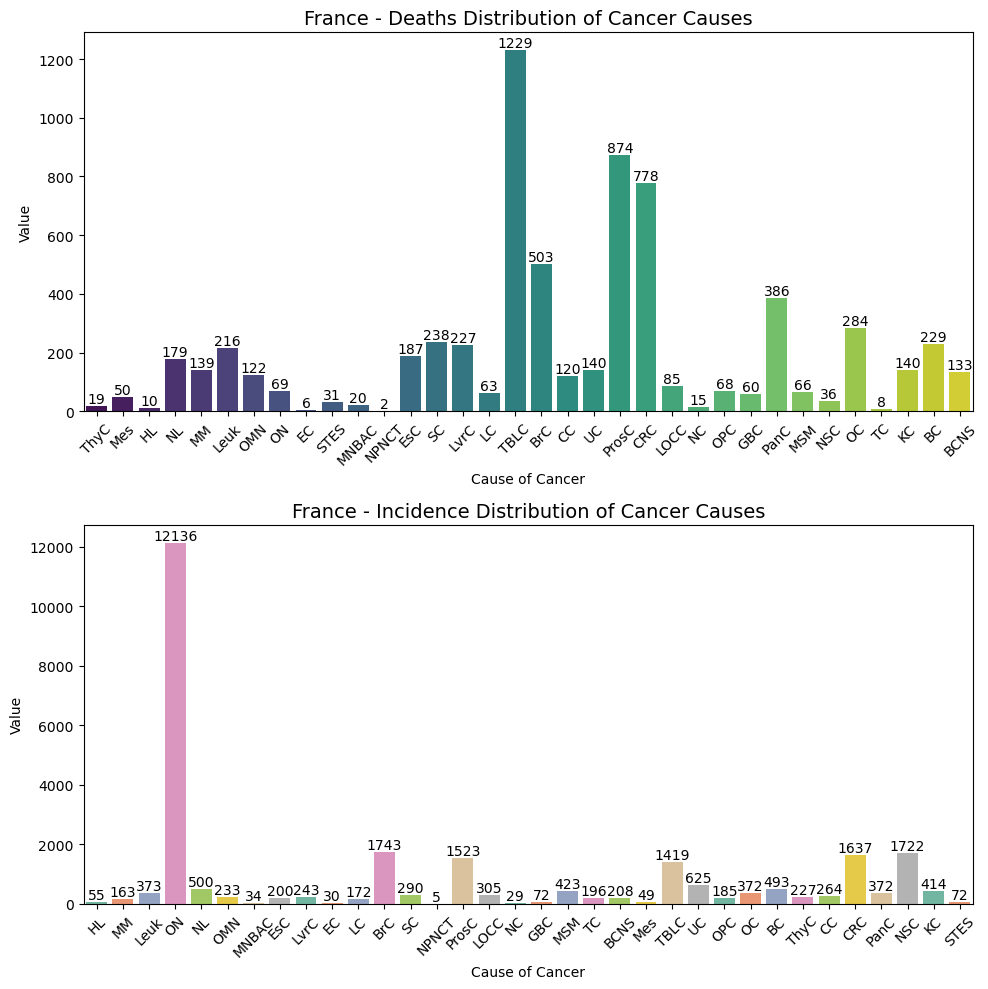

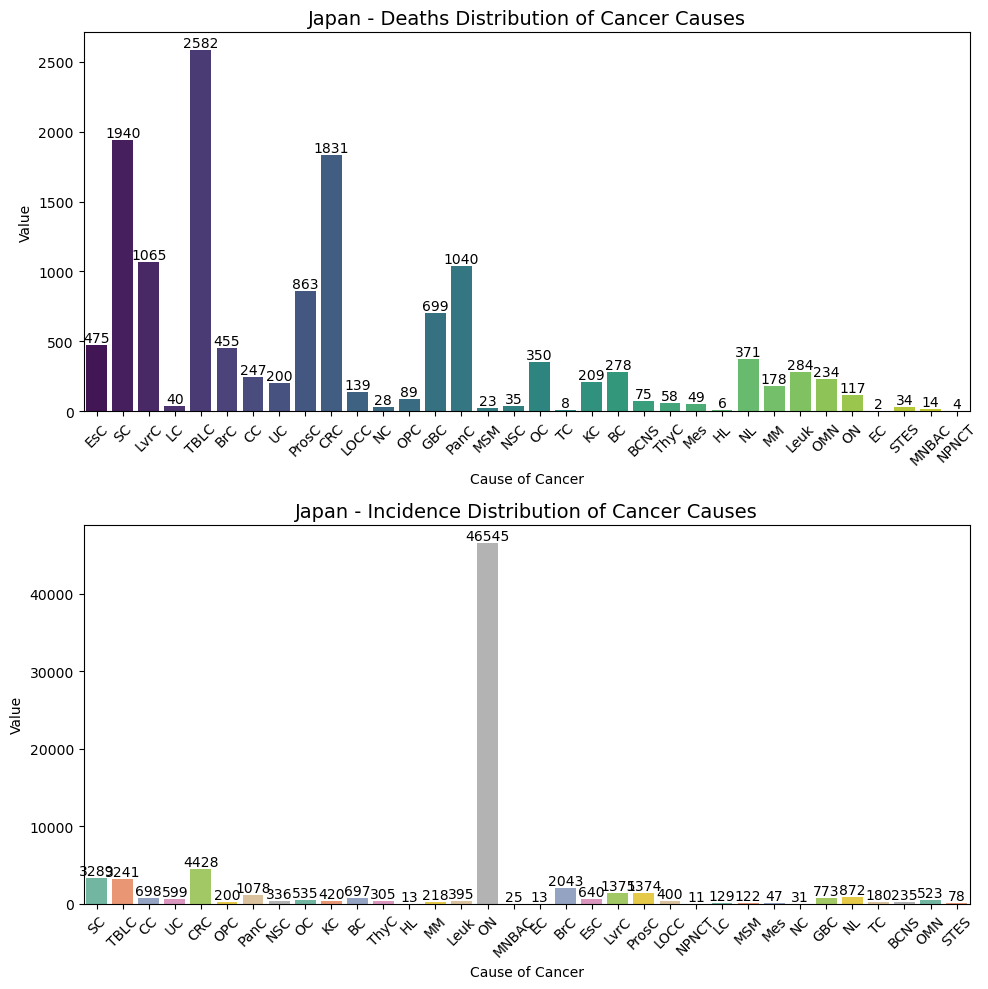

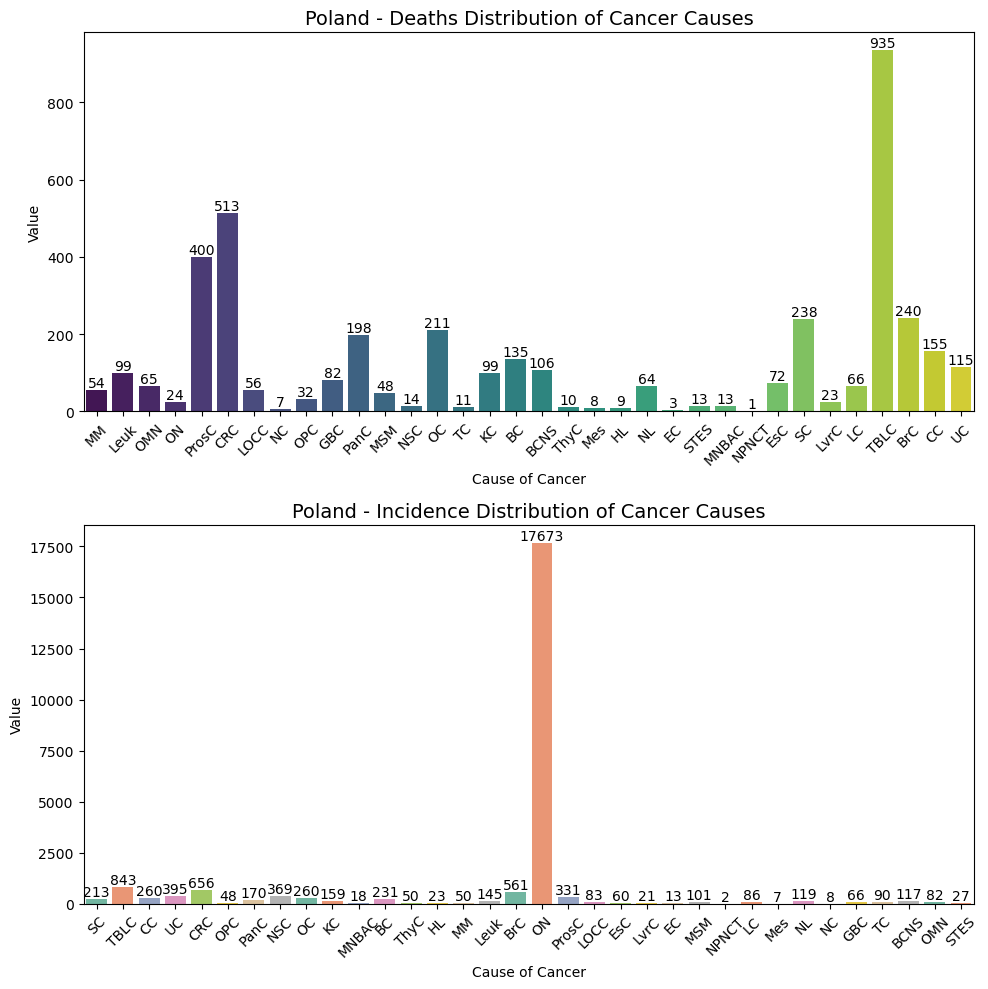

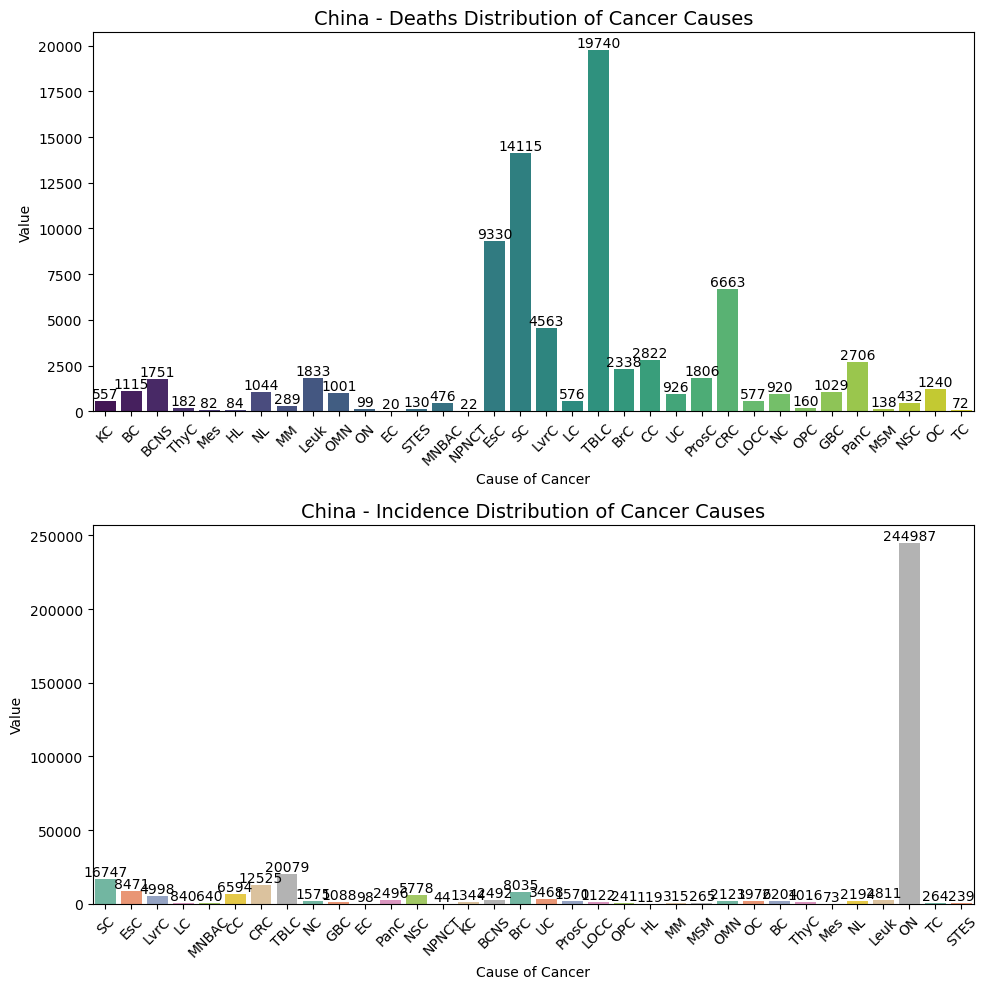

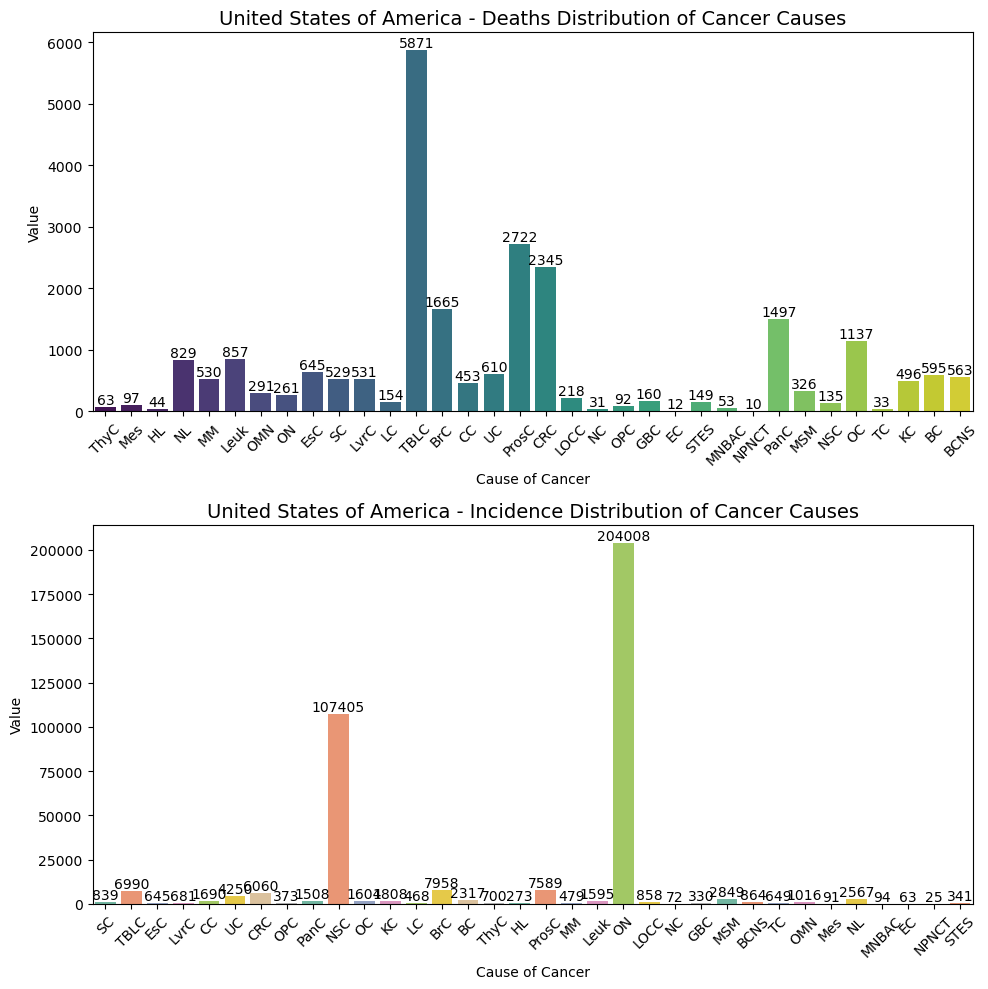

...

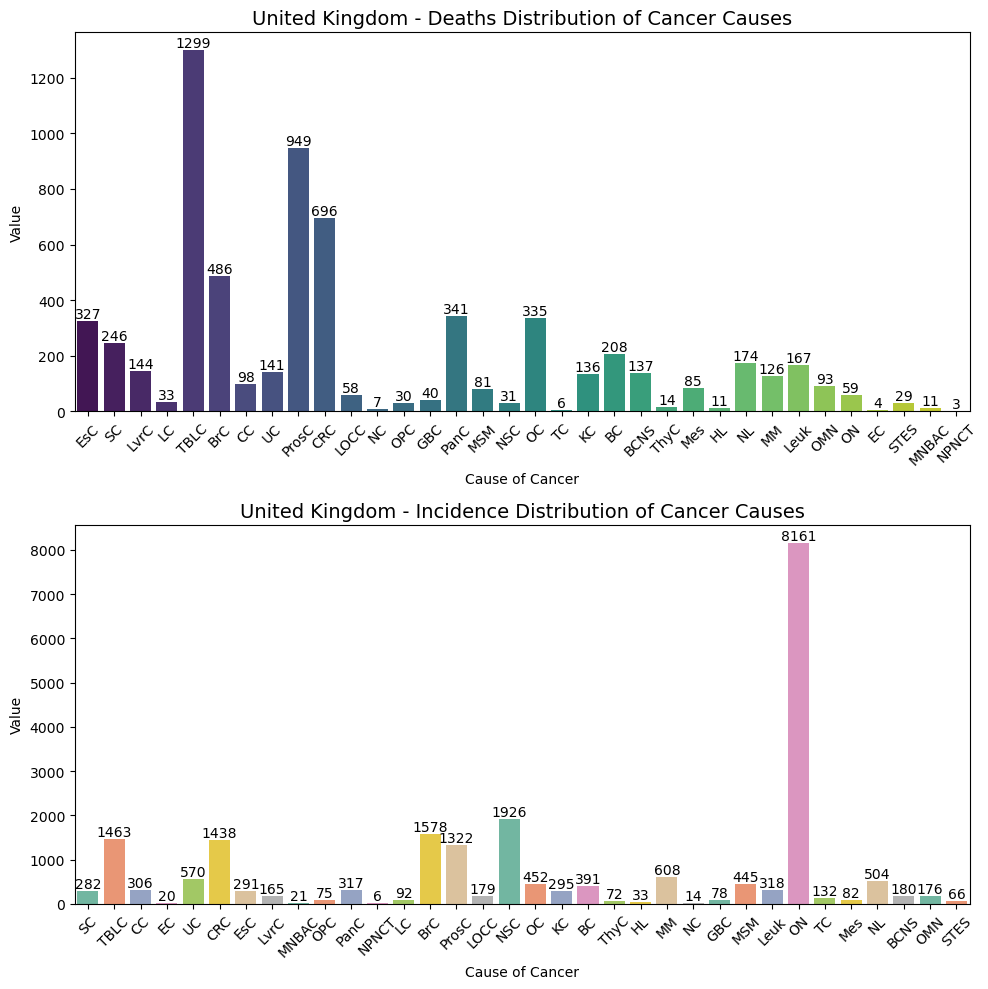

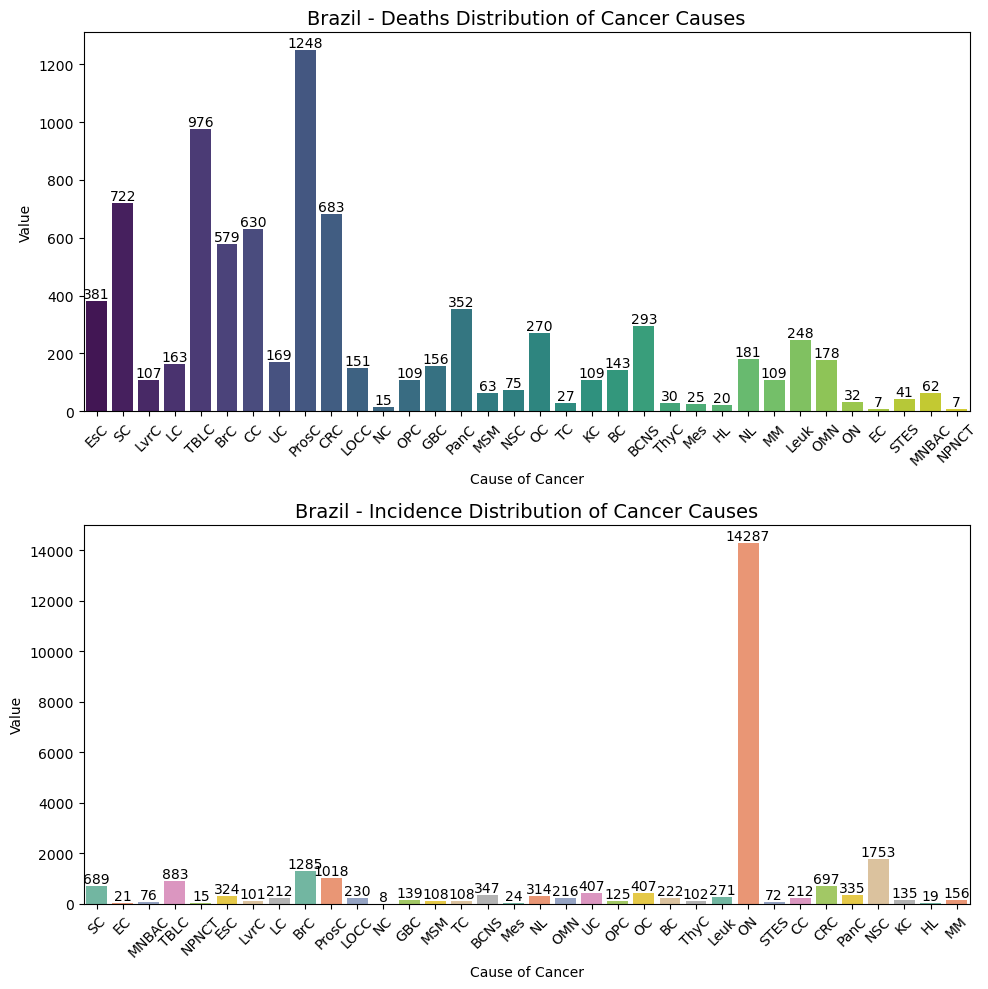

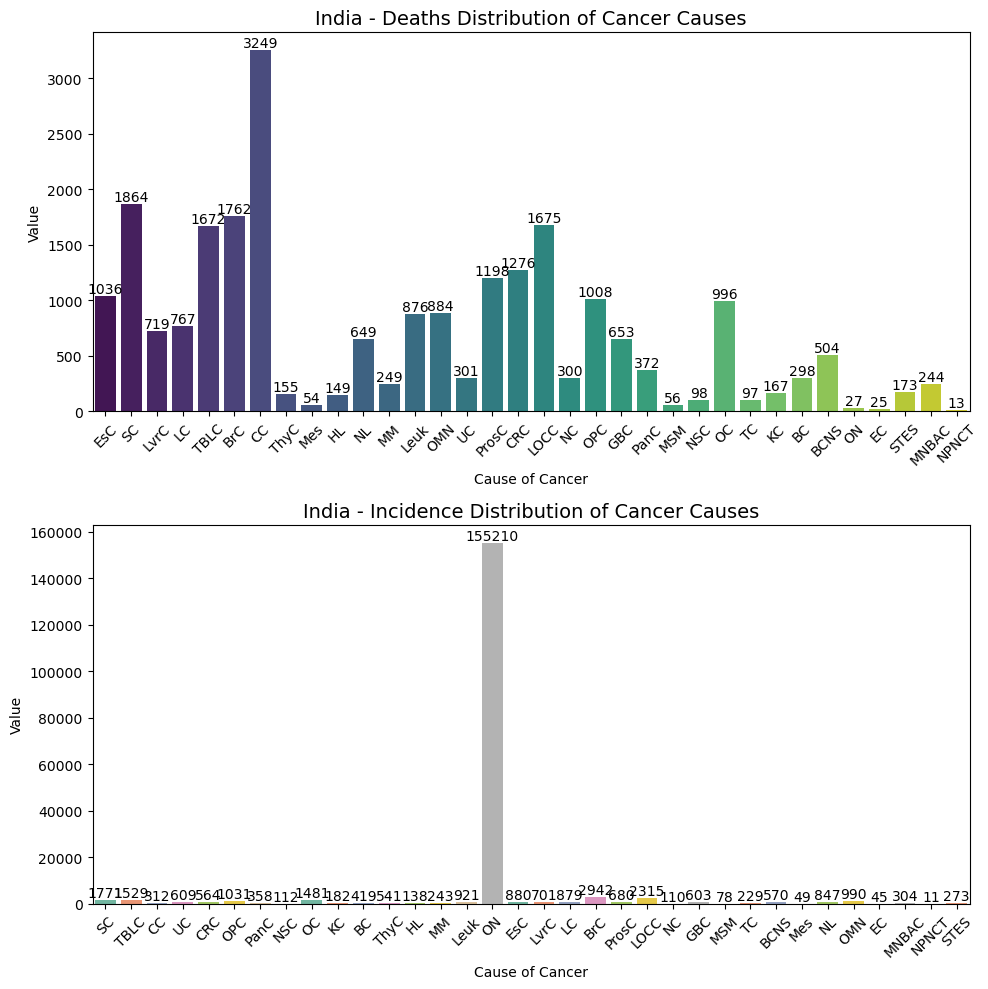

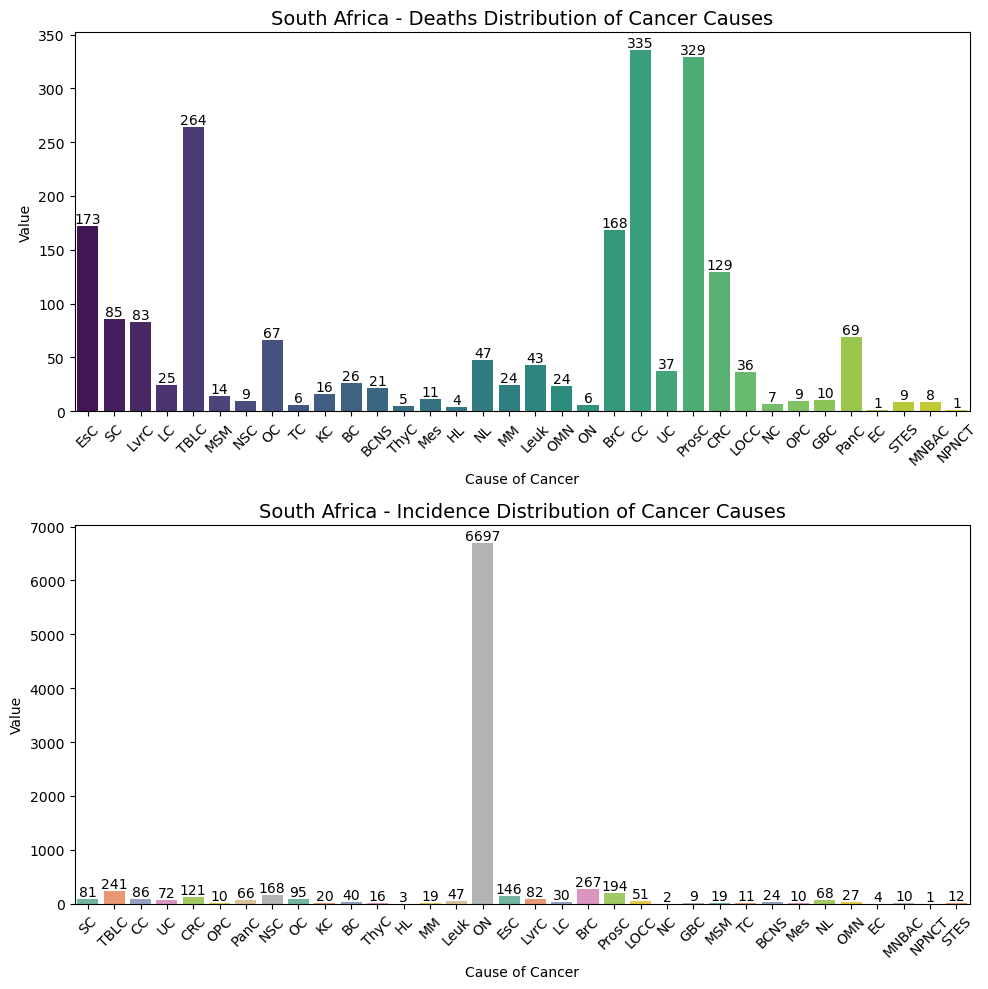

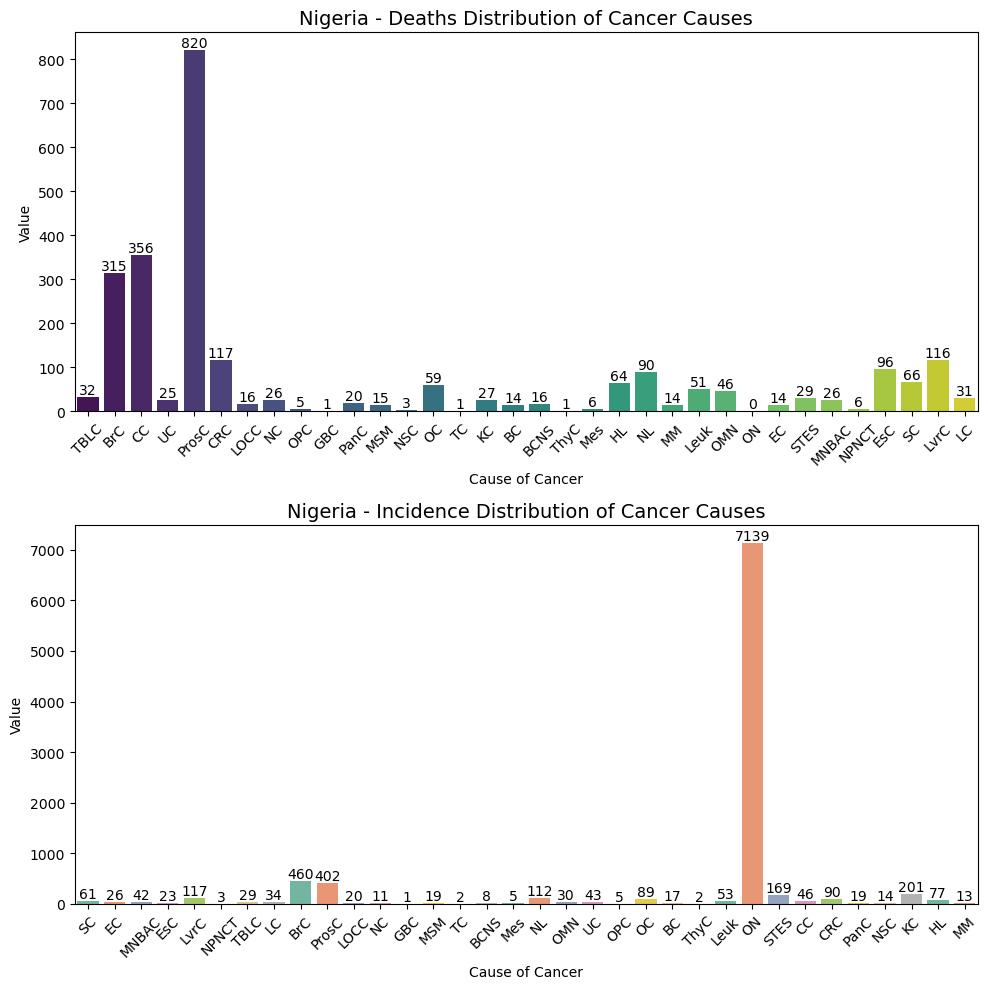

In [14]:
#CAUSES OF DEATHS BY COUNTRY

#Retrieve the 12 countries
countries = data['location_name'].value_counts().index[:12]

#Define color palettes for 'Deaths' and 'Incidence'
#Choose a palette that has a sufficient number of colors for all categories
palette_deaths = sns.color_palette("viridis", n_colors=len(data['cause_abbreviation'].unique())) 
palette_incidence = sns.color_palette("Set2", n_colors=len(data['cause_abbreviation'].unique())) 

#Separate graphs for each country and measure
for country in countries:
    #Filter data for the current country
    country_data = data[data['location_name'] == country]

    #Create a new figure for the country
    plt.figure(figsize=(10, 10))

    #Initialize a counter for subplots
    subplot_index = 1

    #Separate 'Deaths' and 'Incidence'
    for measure in ['Deaths', 'Incidence']:
        measure_data = country_data[country_data['measure_name'] == measure]

        #Choose the palette based on the measure
        if measure == 'Deaths':
            palette = palette_deaths
        else:
            palette = palette_incidence

        #Create a subplot for each measure
        ax = plt.subplot(2, 1, subplot_index)

        #Create bar plot 
        sns.barplot(x='cause_abbreviation', y='val', data=measure_data, palette=palette, hue='cause_abbreviation', errorbar = None)
        
        plt.title(f'{country} - {measure.capitalize()} Distribution of Cancer Causes', fontsize=14)
        plt.xlabel('Cause of Cancer', fontsize=10)
        plt.ylabel('Value', fontsize=10)  
        plt.xticks(rotation=45, fontsize=10)

        #Add the value on top of each bar
        for p in ax.patches:
            ax.text(p.get_x() + p.get_width() / 2, p.get_height(), f'{p.get_height():.0f}', ha='center', va='bottom', fontsize=10)

        subplot_index += 1

    #Adjust layout and show the plot
    plt.tight_layout()
    plt.show()

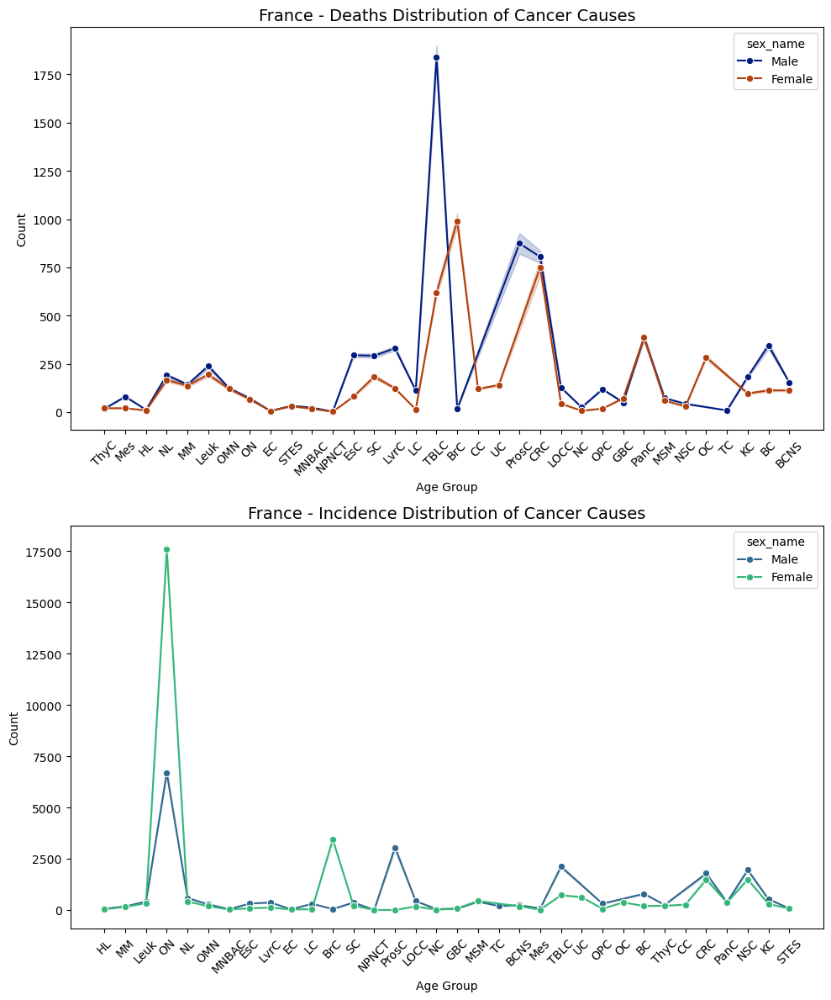

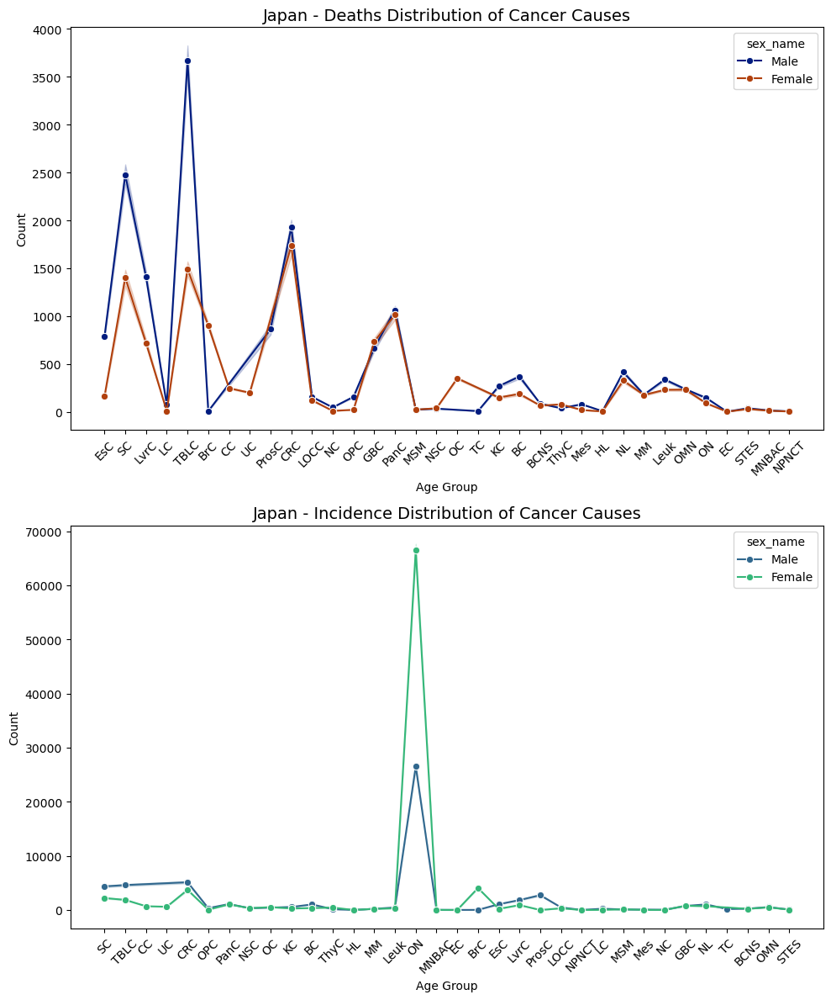

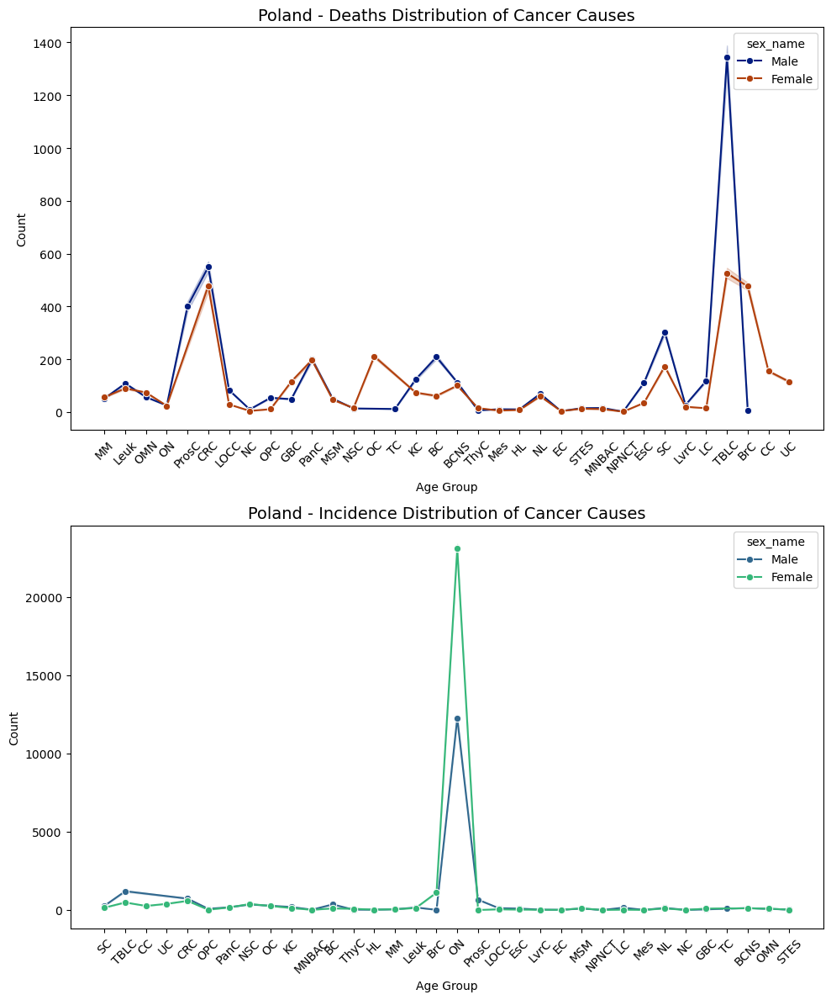

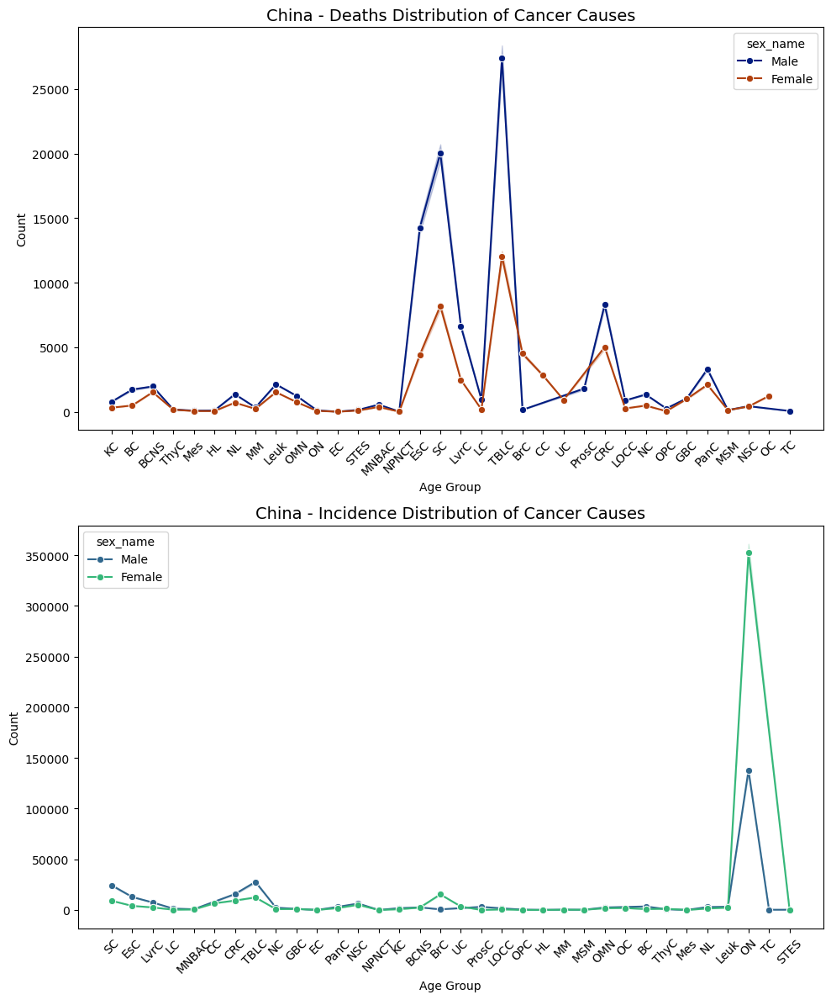

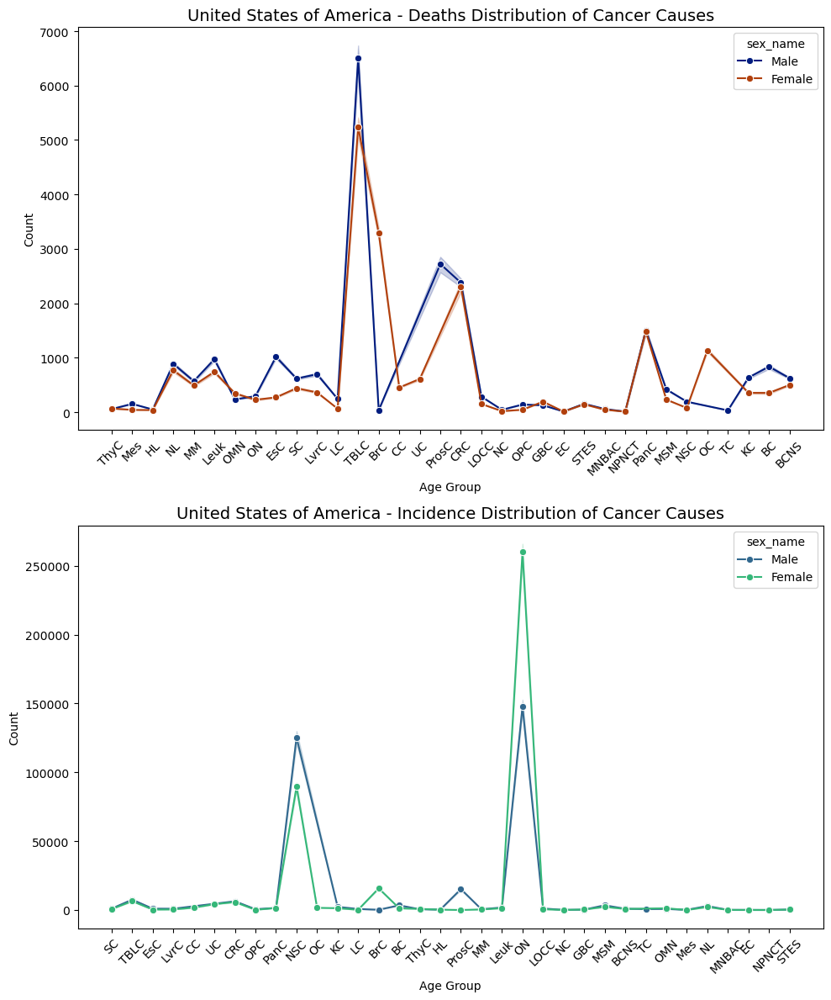

...

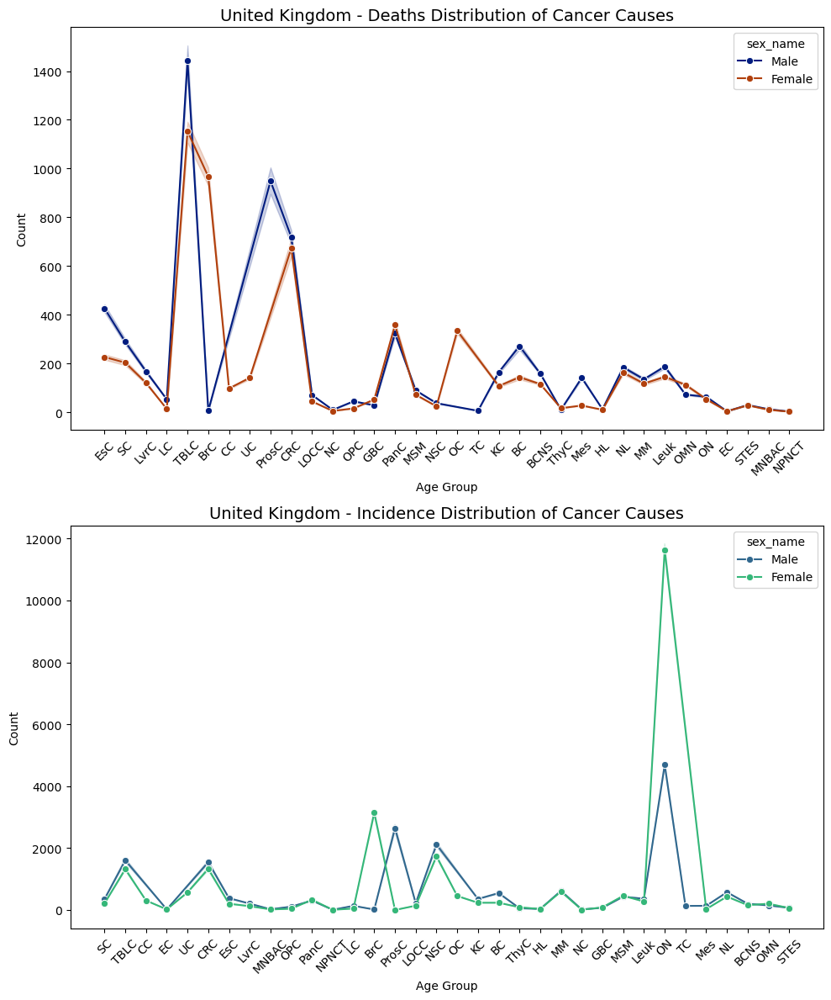

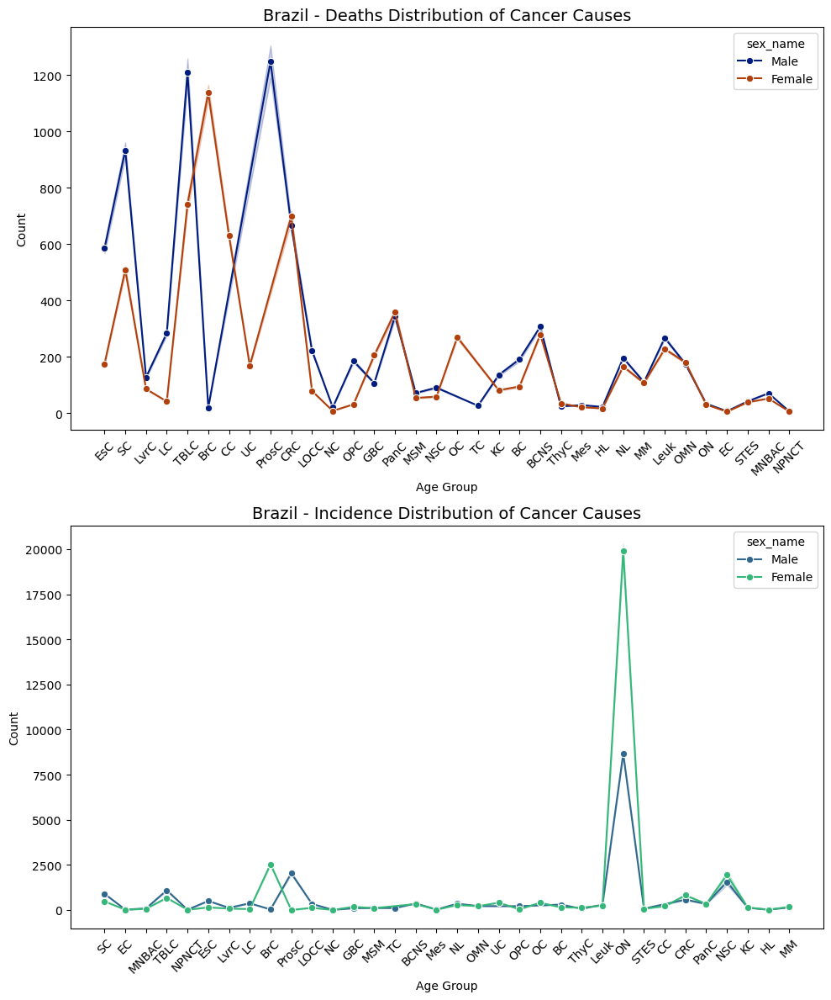

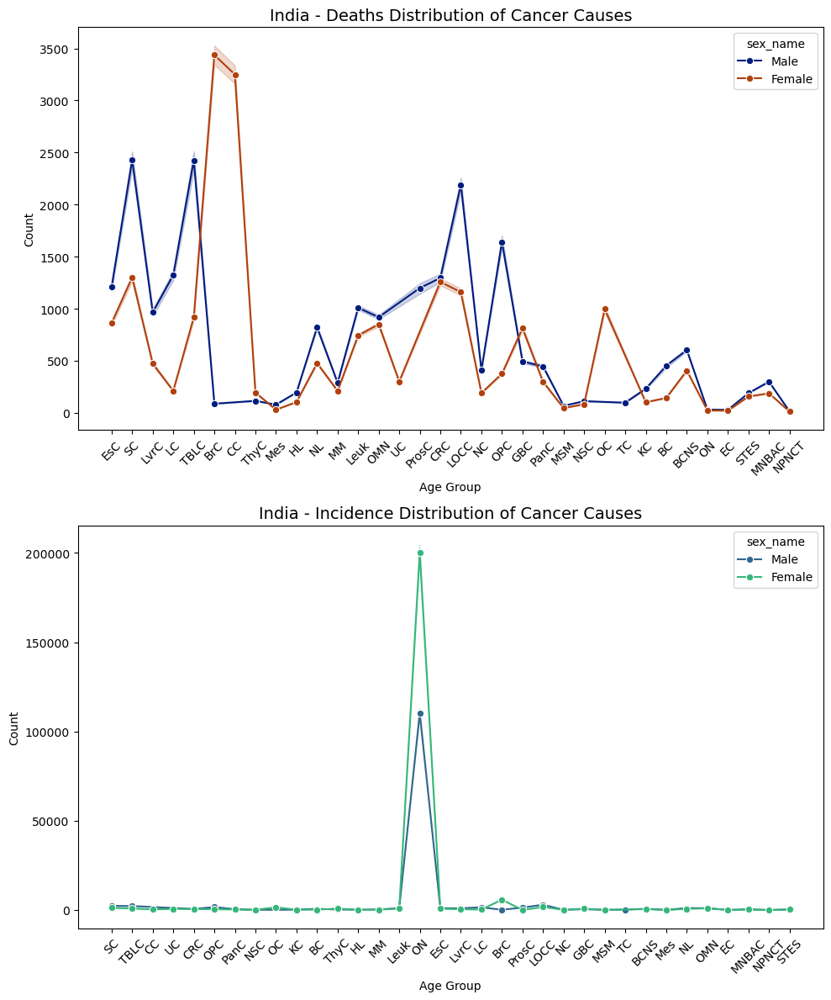

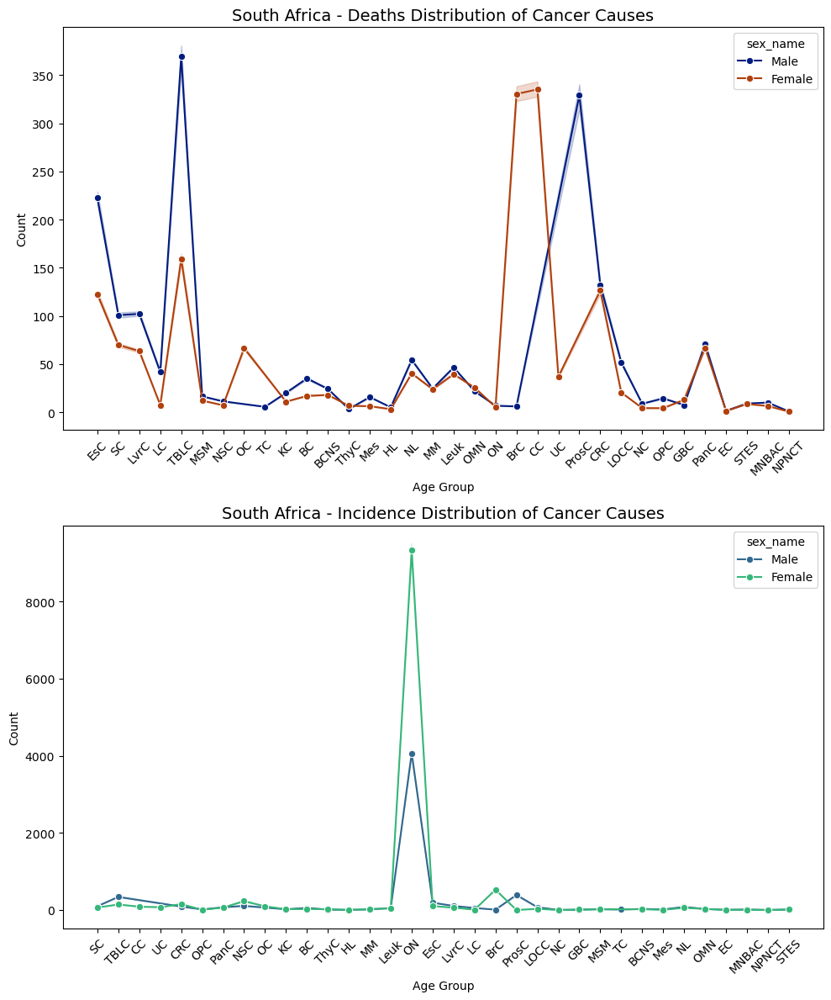

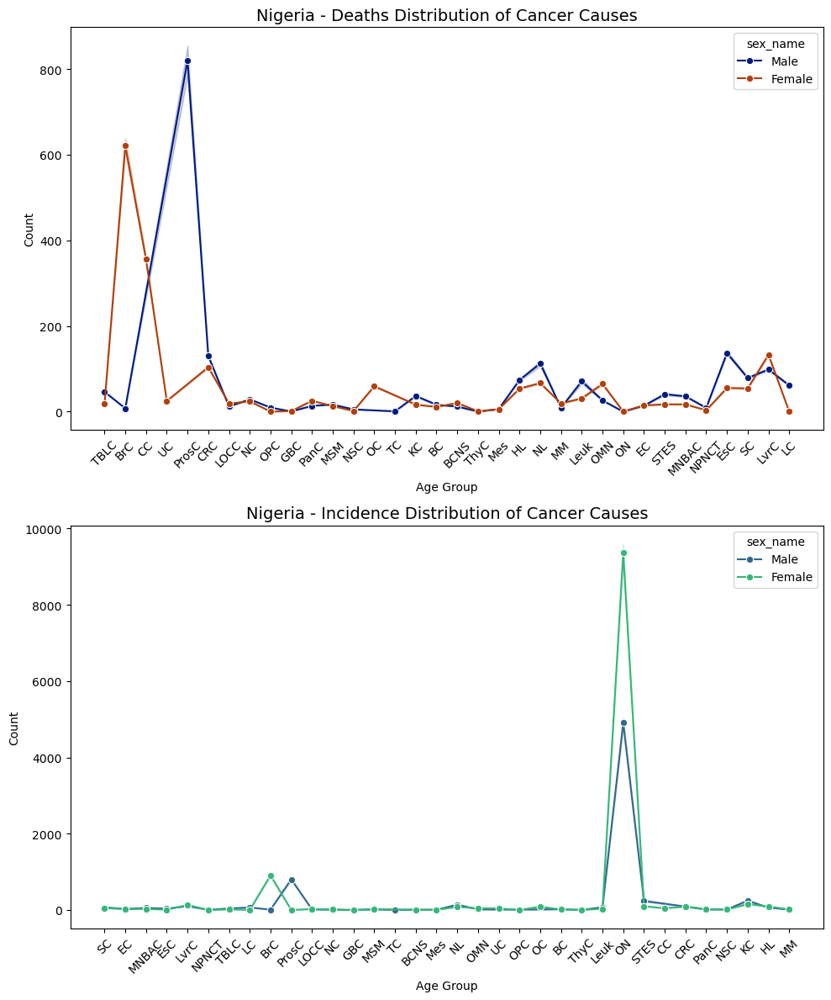

In [15]:
#CAUSE OF CANSER BY COUNTRY AND GENDER
    
#Convert 'age_name' to categorical and sort to order
data['age_name'] = pd.Categorical(data['age_name'], categories = sorted(data['age_name'].unique()), ordered = True)

#Retrieve the top 12 countries
countries = data['location_name'].value_counts().index[:12]

#Define color palettes for 'Deaths' and 'Incidence'
palette_deaths = sns.color_palette("dark", n_colors=2)  
palette_incidence = sns.color_palette("viridis", n_colors=2) 

#Separate graphs for each country and measure
for country in countries:
    #Create a new graph for each country
    plt.figure(figsize = (10, 12))  

    #Initialize a counter for subplots
    subplot_index = 1

    #Filter data for the current country
    country_data = data[data['location_name'] == country]

    #Separate 'Deaths' and 'Incidence'
    for measure in ['Deaths', 'Incidence']:
        measure_data = country_data[country_data['measure_name'] == measure]

        # Choose the palette based on the measure
        if measure == 'Deaths':
            palette = palette_deaths
        else:
            palette = palette_incidence

        # Create a subplot 
        plt.subplot(2, 1, subplot_index)

        # Create line plot for each measure with the chosen palette
        sns.lineplot(x = 'cause_abbreviation', y = 'val', hue = 'sex_name', data=measure_data, palette = palette, marker = 'o', errorbar=('ci', 50))

        # Add labels, titles, and font sizes
        plt.title(f'{country} - {measure.capitalize()} Distribution of Cancer Causes', fontsize = 14)
        plt.xlabel('Age Group', fontsize = 10)
        plt.ylabel('Count', fontsize = 10)
        plt.xticks(rotation = 45, fontsize = 10)

        subplot_index += 1  

    #Print the plot
    plt.tight_layout()
    plt.show()

In [16]:
#AGE GROUP BY GENDER

#Create a cross-tabulation of age by sex
age_sex_crosstab = pd.crosstab(data['age_name'], data['sex_name'])

#Print the table
print(age_sex_crosstab)

sex_name     Female   Male
age_name                  
0-14 years    11726  11198
15-19 years   14281  13599
20-24 years   16462  15780
25-29 years   16478  15796
30-34 years   16390  15708
35-39 years   16410  15728
40-44 years   16400  15718
45-49 years   16346  15664
50-54 years   16324  15642
55-59 years   16324  15642
60-64 years   16324  15642
65-69 years   16324  15642
70-74 years   16434  15752
75-79 years   16426  15744
80-84 years   16346  15664
85+ years     16439  15647


In [17]:
#AGE GROUP BY CANCER CAUSE

#Create a cross-tabulation of age by sex
age_sex_crosstab = pd.crosstab(data['age_name'], data['cause_abbreviation'])

#Print the table
print(age_sex_crosstab)

cause_abbreviation    BC  BCNS   BrC   CC   CRC    EC   EsC   GBC    HL    KC  \
age_name                                                                        
0-14 years           528   880   528  264   528  1056   484   352  1056  1056   
15-19 years         1056  1056  1056  418   836  1056   528   528   842   880   
20-24 years         1056  1056  1056  418   836  1056  1056  1056   836   880   
25-29 years         1056  1056  1056  418   836  1056  1056  1056   836   880   
30-34 years         1056  1056  1056  418   836  1056  1056  1056   836   880   
35-39 years         1056  1056  1056  418   876  1056  1056  1056   836   880   
40-44 years         1056  1056  1056  418   880  1056  1056  1056   836   880   
45-49 years         1056  1056  1056  418   880  1056  1056  1056   836   880   
50-54 years         1056  1056  1056  418   880  1056  1012  1056   836   880   
55-59 years         1056  1056  1056  418   880  1056  1012  1056   836   880   
60-64 years         1056  10

In [18]:
#AGE GROUP BY MEASURE NAME

#Create a cross-tabulation of age by sex
age_sex_crosstab = pd.crosstab(data['age_name'], data['measure_name'])

#Print the table
print(age_sex_crosstab)

measure_name  Deaths  Incidence
age_name                       
0-14 years      7392      15532
15-19 years    12408      15472
20-24 years    16632      15610
25-29 years    16632      15642
30-34 years    16632      15466
35-39 years    16632      15506
40-44 years    16632      15486
45-49 years    16632      15378
50-54 years    16632      15334
55-59 years    16632      15334
60-64 years    16632      15334
65-69 years    16632      15334
70-74 years    16632      15554
75-79 years    16632      15538
80-84 years    16632      15378
85+ years      16632      15454


In [19]:
#AGE GROUP BY COUNTRY

#Create a cross-tabulation of age by sex
age_sex_crosstab = pd.crosstab(data['age_name'], data['location_name'])

#Print the table
print(age_sex_crosstab)

location_name  Australia  Brazil  China  France  India  Japan  Mexico  \
age_name                                                                
0-14 years          2024    1760   2024    2024   1716   2024    1980   
15-19 years         2442    2156   2442    2442   2112   2442    2376   
20-24 years         2794    2544   2794    2794   2500   2794    2728   
25-29 years         2794    2552   2794    2794   2508   2794    2728   
30-34 years         2794    2508   2794    2794   2464   2794    2728   
35-39 years         2794    2508   2794    2794   2464   2794    2768   
40-44 years         2794    2508   2794    2794   2456   2794    2772   
45-49 years         2794    2508   2794    2794   2420   2794    2772   
50-54 years         2794    2508   2794    2794   2420   2794    2772   
55-59 years         2794    2508   2794    2794   2420   2794    2772   
60-64 years         2794    2508   2794    2794   2420   2794    2772   
65-69 years         2794    2508   2794    2794   2

In [20]:
#AGE GROUP BY CAUSES OF DEATH

#Create a cross-tabulation of age by sex
age_sex_crosstab = pd.crosstab(data['cause_abbreviation'], data['age_name'])

#Print the table
print(age_sex_crosstab)

age_name            0-14 years  15-19 years  20-24 years  25-29 years  \
cause_abbreviation                                                      
BC                         528         1056         1056         1056   
BCNS                       880         1056         1056         1056   
BrC                        528         1056         1056         1056   
CC                         264          418          418          418   
CRC                        528          836          836          836   
EC                        1056         1056         1056         1056   
EsC                        484          528         1056         1056   
GBC                        352          528         1056         1056   
HL                        1056          842          836          836   
KC                        1056          880          880          880   
LC                         308          528         1056         1056   
LOCC                       528         1056        

In [21]:
#GENDER BY CAUSES OF DEATH

#Create a cross-tabulation of age by sex
age_sex_crosstab = pd.crosstab(data['cause_abbreviation'], data['sex_name'])

#Print the table
print(age_sex_crosstab)

sex_name            Female  Male
cause_abbreviation              
BC                    8184  8184
BCNS                  8176  8176
BrC                   8184  8184
CC                    6644     0
CRC                   6950  6950
EC                    8448  8448
EsC                   7722  7722
GBC                   7744  7744
HL                    7241  7241
KC                    7216  7216
LC                    7656  7656
LOCC                  8184  8184
Leuk                  8448  8448
LvrC                  8404  8404
MM                    6165  6165
MNBAC                 8448  8448
MSM                   8184  8184
Mes                   7920  7920
NC                    7304  7304
NL                    8448  8448
NPNCT                 7776  7776
NSC                   6688  6688
OC                    8184     0
OMN                   8118  8118
ON                    8448  8448
OPC                   7920  7920
PanC                  8080  8080
ProsC                 4224  7920
SC        

In [22]:
#GENDER BY COUNTRY

#Create a cross-tabulation of age by sex
age_sex_crosstab = pd.crosstab(data['location_name'], data['sex_name'])

#Print the table
print(age_sex_crosstab)

sex_name                  Female   Male
location_name                          
Australia                  22308  21274
Brazil                     19971  19245
China                      22308  21274
France                     22308  21274
India                      19461  18735
Japan                      22308  21274
Mexico                     21866  21140
Nigeria                    19219  18493
Poland                     22308  21274
South Africa               19417  18691
United Kingdom             21652  20618
United States of America   22308  21274


In [23]:
#COUNTRY BY CAUSES OF DEATH

#Create a cross-tabulation of age by sex
age_sex_crosstab = pd.crosstab(data['cause_abbreviation'], data['location_name'])

#Print the table
print(age_sex_crosstab)

location_name       Australia  Brazil  China  France  India  Japan  Mexico  \
cause_abbreviation                                                           
BC                       1364    1364   1364    1364   1364   1364    1364   
BCNS                     1408    1272   1408    1408   1272   1408    1408   
BrC                      1364    1364   1364    1364   1364   1364    1364   
CC                        682     374    682     682    374    682     374   
CRC                      1364     792   1364    1364    792   1364    1184   
EC                       1408    1408   1408    1408   1408   1408    1408   
EsC                      1320    1320   1320    1320   1320   1320    1320   
GBC                      1320    1232   1320    1320   1232   1320    1320   
HL                       1408     924   1408    1408    924   1408    1408   
KC                       1408     792   1408    1408    792   1408    1408   
LC                       1320    1232   1320    1320   1232   13

In [24]:
#GENDER BY CAUSES OF DEATH

#Create a cross-tabulation of age by sex
age_sex_crosstab = pd.crosstab(data['cause_abbreviation'], data['sex_name'])

#Print the table
print(age_sex_crosstab)

sex_name            Female  Male
cause_abbreviation              
BC                    8184  8184
BCNS                  8176  8176
BrC                   8184  8184
CC                    6644     0
CRC                   6950  6950
EC                    8448  8448
EsC                   7722  7722
GBC                   7744  7744
HL                    7241  7241
KC                    7216  7216
LC                    7656  7656
LOCC                  8184  8184
Leuk                  8448  8448
LvrC                  8404  8404
MM                    6165  6165
MNBAC                 8448  8448
MSM                   8184  8184
Mes                   7920  7920
NC                    7304  7304
NL                    8448  8448
NPNCT                 7776  7776
NSC                   6688  6688
OC                    8184     0
OMN                   8118  8118
ON                    8448  8448
OPC                   7920  7920
PanC                  8080  8080
ProsC                 4224  7920
SC        

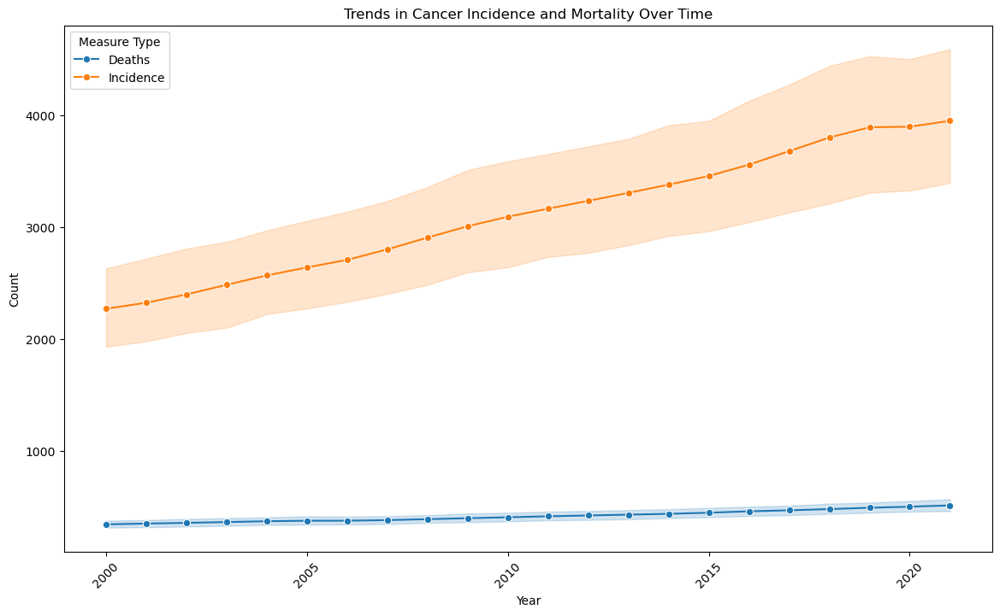

In [25]:
#TREND BY YEAR AND MEASURE TYPE - GLOBALLY

plt.figure(figsize = (14, 8))
sns.lineplot(x = 'year', y = 'val', hue = 'measure_name', data = data, errorbar=('ci', 95), marker='o')
plt.title('Trends in Cancer Incidence and Mortality Over Time')
plt.xlabel('Year')
plt.ylabel('Count')
plt.xticks(rotation = 45)
plt.legend(title='Measure Type')
plt.show()

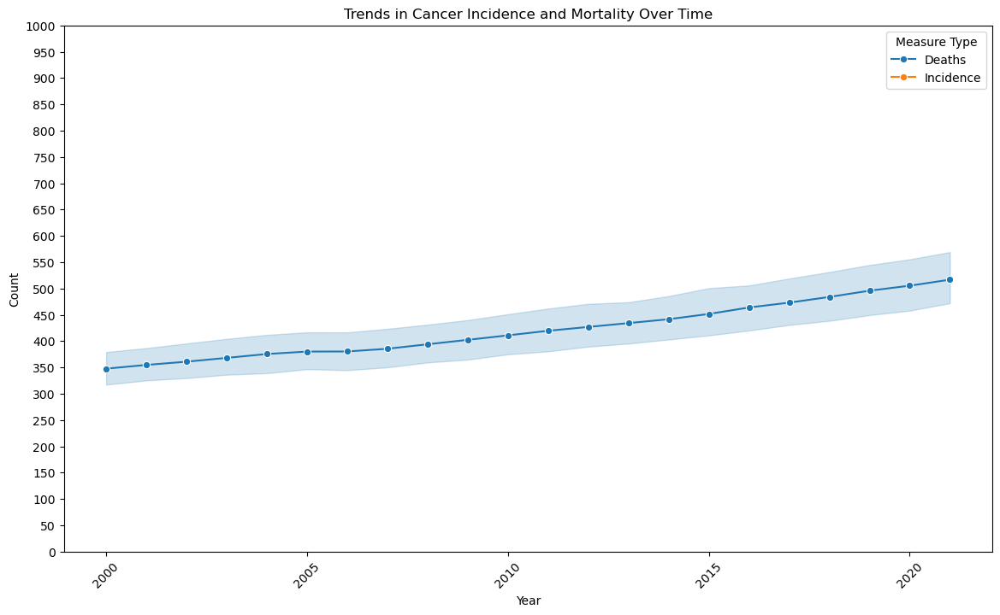

In [26]:
#TREND BY YEAR AND MEASURE TYPE - GLOBALLY_check clear view

plt.figure(figsize = (14, 8))
sns.lineplot(x = 'year', y = 'val', hue = 'measure_name', data = data, errorbar=('ci', 95), marker='o')
plt.title('Trends in Cancer Incidence and Mortality Over Time')
plt.xlabel('Year')
plt.ylabel('Count')
plt.ylim(0,1000)
plt.yticks(np.arange(0, 1001, 50))
plt.xticks(rotation = 45)
plt.legend(title='Measure Type')
plt.show()

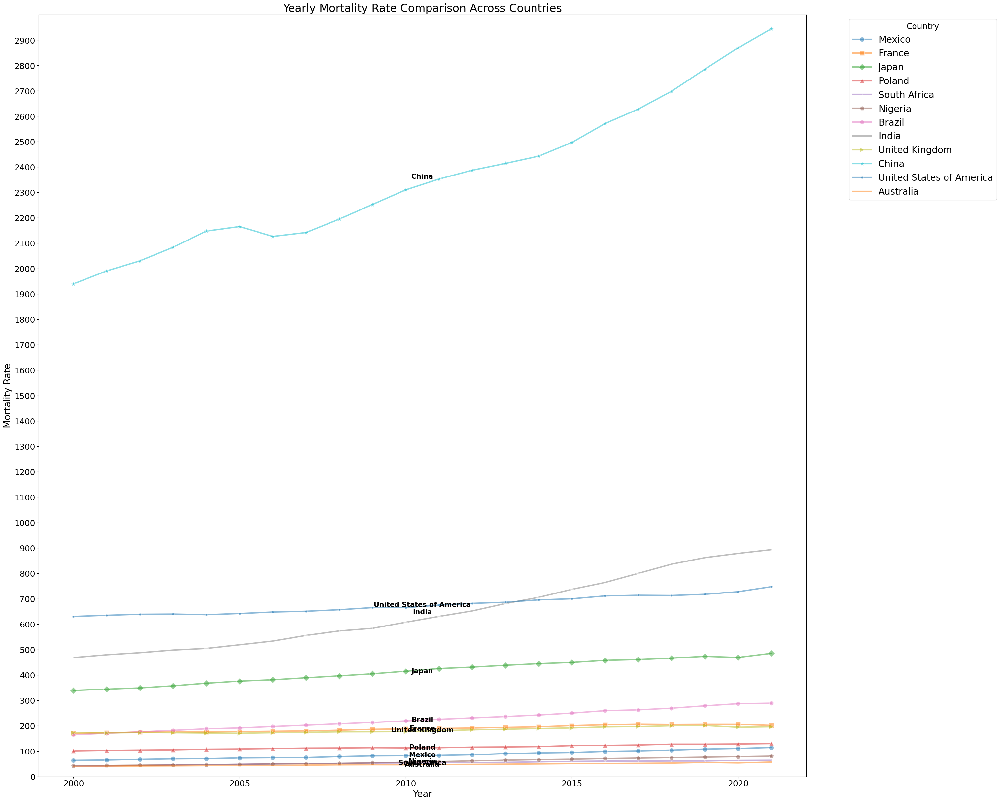

In [27]:
#MOTALITY RATE COMPARISON OVER TIME

#Dictionary to map each country to a specific marker
markers = {
    'Mexico': 'o',            
    'France': 's',            
    'Japan': 'D',              
    'Poland': '^',             
    'South Africa': 'x',       
    'Nigeria': 'p',            
    'Brazil': 'h',             
    'India': '+',              
    'United Kingdom': '>',      
    'China': '*',              
    'United States of America': '.',  
    'Australia': ',',         
}

plt.figure(figsize=(30, 30))

#Line plot with specific marker
for country, marker in markers.items():
    #Filter data for the country
    country_data = data[(data['location_name'] == country) & (data['measure_name'] == 'Deaths')]
    
    #Plot the line with confidence interval shading
    sns.lineplot(
        x='year', 
        y='val', 
        data=country_data, 
        marker=marker, 
        label=country, 
        dashes=False,
        alpha=0.5,
        markersize=10,  
        linewidth=3,
        errorbar=None
    )

    #Display the country name near the line
    y_pos = country_data['val'].mean()
    x_pos = country_data['year'].mean()
    plt.text(
        x_pos, 
        y_pos, 
        country, 
        color='black', 
        fontsize=15, 
        ha='center',  # Horizontal alignment of the label
        va='center',  # Vertical alignment of the label
        fontweight='bold'
    )

plt.title('Yearly Mortality Rate Comparison Across Countries', fontsize=24)
plt.xlabel('Year', fontsize=20)
plt.ylabel('Mortality Rate', fontsize=20)
plt.ylim(0, 3001)
plt.yticks(range(0, 3000, 100))
plt.xticks(fontsize=18) 
plt.yticks(fontsize=18)


plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=20, title_fontsize=18)
plt.show()

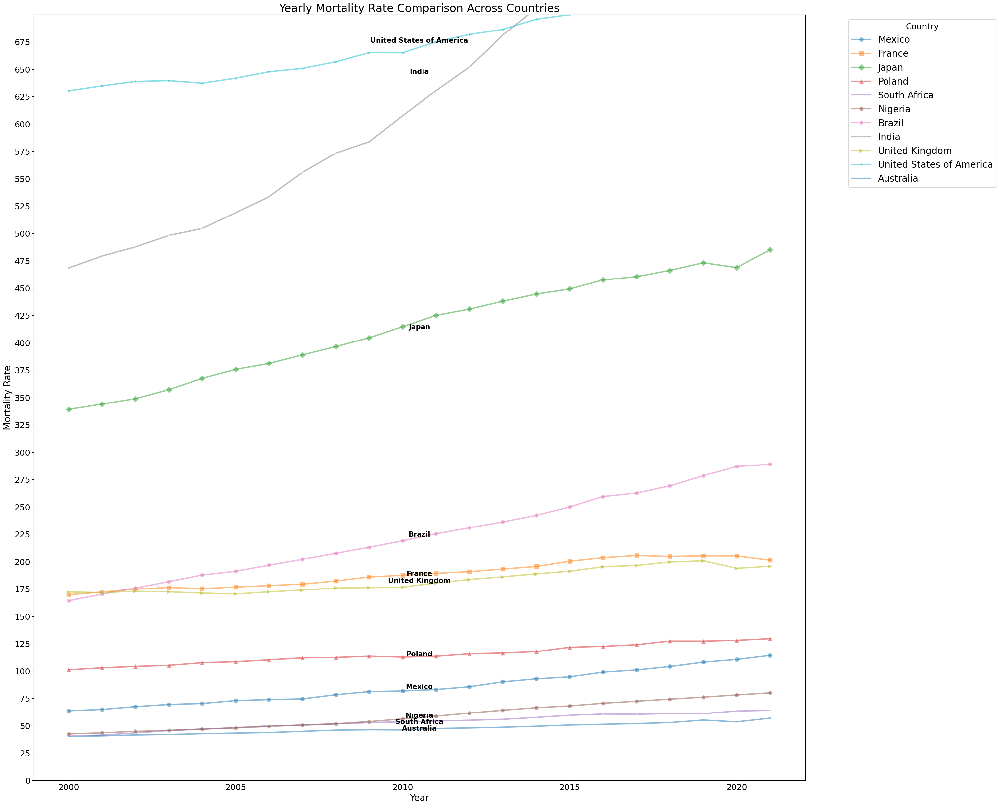

In [28]:
#MOTALITY RATE COMPARISON OVER TIME _ TO TAKE CLEAR VIEW CHINA REMOVED

#Dictionary to map each country to a specific marker
markers = {
    'Mexico': 'o',            
    'France': 's',            
    'Japan': 'D',              
    'Poland': '^',             
    'South Africa': 'x',       
    'Nigeria': 'p',            
    'Brazil': 'h',             
    'India': '+',              
    'United Kingdom': '>',      
    #'China': '*',              
    'United States of America': '.',  
    'Australia': ',',         
}

plt.figure(figsize=(30, 30))

#Line plot with specific marker
for country, marker in markers.items():
    #Filter data for the country
    country_data = data[(data['location_name'] == country) & (data['measure_name'] == 'Deaths')]
    
    #Plot the line with confidence interval shading
    sns.lineplot(
        x='year', 
        y='val', 
        data=country_data, 
        marker=marker, 
        label=country, 
        dashes=False,
        alpha=0.5,
        markersize=10,  
        linewidth=3,
        errorbar=None
    )

    #Display the country name near the line
    y_pos = country_data['val'].mean()
    x_pos = country_data['year'].mean()
    plt.text(
        x_pos, 
        y_pos, 
        country, 
        color='black', 
        fontsize=15, 
        ha='center',  
        va='center',  
        fontweight='bold'
    )

plt.title('Yearly Mortality Rate Comparison Across Countries', fontsize=24)
plt.xlabel('Year', fontsize=20)
plt.ylabel('Mortality Rate', fontsize=20)
plt.ylim(0, 700)
plt.yticks(range(0, 700, 25))
plt.xticks(fontsize=18) 
plt.yticks(fontsize=18)


plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=20, title_fontsize=18)
plt.show()

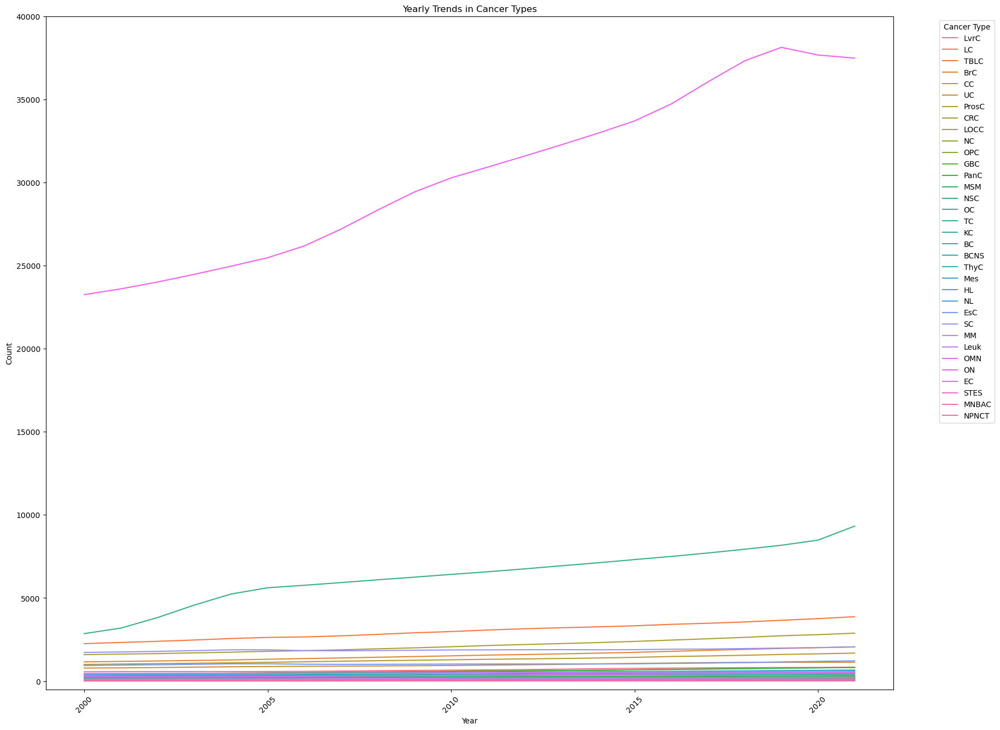

In [29]:
#YEARLY TREND FOR EACH CANCER CAUSE

plt.figure(figsize=(20, 16))
sns.lineplot(data=data, x='year', y='val', hue='cause_abbreviation', errorbar=None)
plt.title('Yearly Trends in Cancer Types')
plt.xlabel('Year')
plt.ylabel('Count')
plt.ylim(-500, 40000)
plt.legend(title='Cancer Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.show()

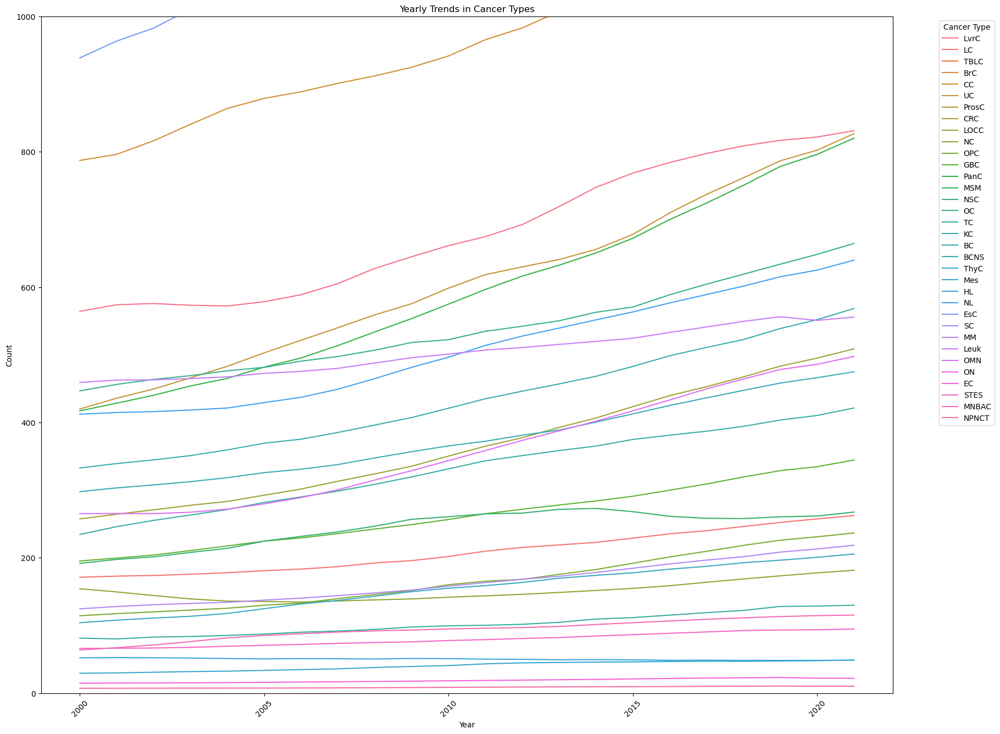

In [30]:
#YEARLY TREND FOR EACH CANCER CAUSE

plt.figure(figsize=(20, 16))
sns.lineplot(data=data, x='year', y='val', hue='cause_abbreviation', errorbar=None)
plt.title('Yearly Trends in Cancer Types')
plt.xlabel('Year')
plt.ylabel('Count')
plt.ylim(0, 1000)
plt.legend(title='Cancer Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.show()

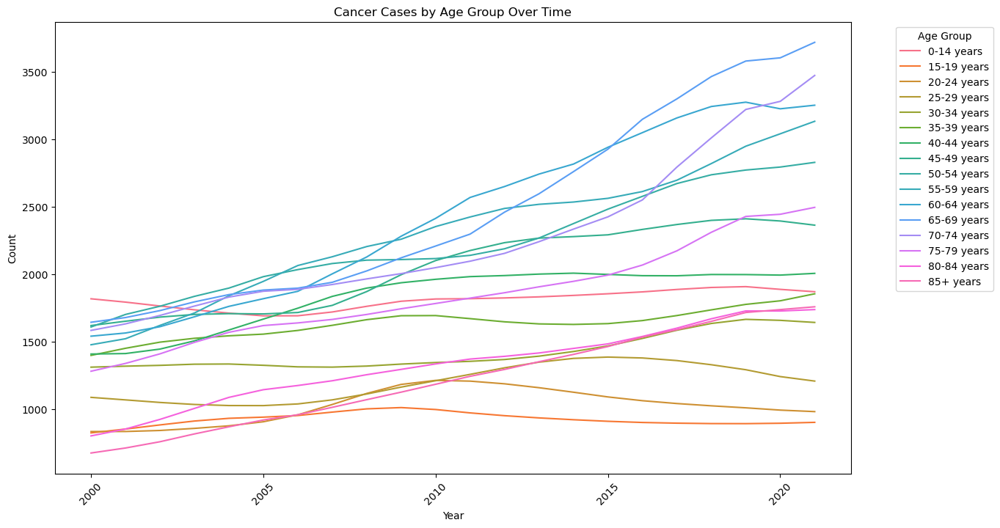

In [31]:
#EXPLORING DIFFERENCES BY AGE AND YEAR

#Plot cancer cases by age group over the years
plt.figure(figsize=(14, 8))
sns.lineplot(data=data, x='year', y='val', hue='age_name', errorbar=None)
plt.title('Cancer Cases by Age Group Over Time')
plt.xlabel('Year')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Age Group', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

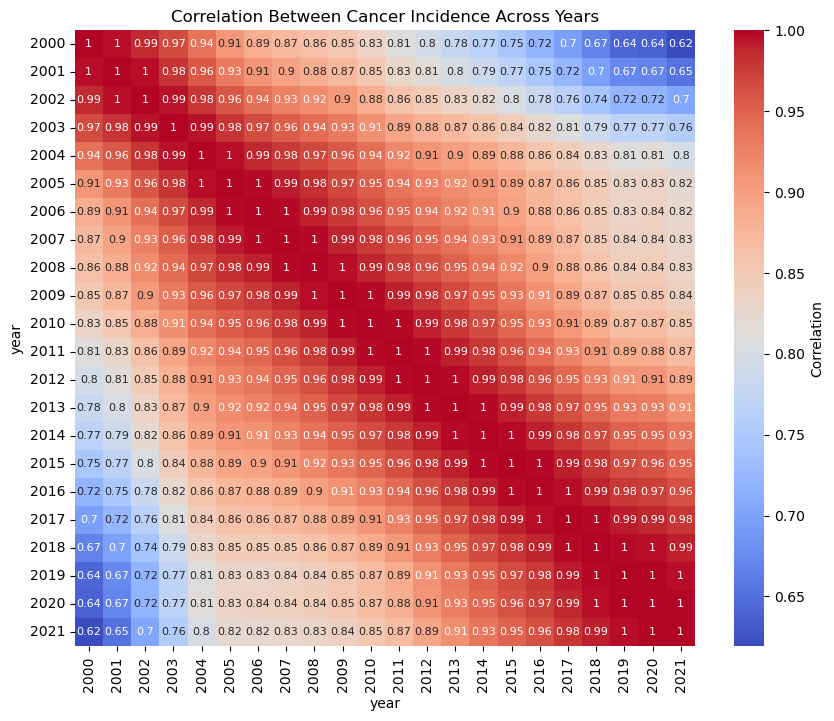

In [32]:
#CORRELATION BETWEEN AGE AND CANCER INCIDENCE #####################

#Filter data for incidence only
incidence_data = data[data['measure_name'] == 'Incidence']

#Creating pivot table for incidence data
correlation_data_incidence = incidence_data.pivot_table(values='val', index='age_name', columns='year', aggfunc='sum', observed='True')

#Calculating correlation matrix for incidence data
correlation_matrix_incidence = correlation_data_incidence.corr()

#Plot the heatmap 
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix_incidence, annot=True, cmap='coolwarm', cbar_kws={'label': 'Correlation'}, annot_kws={"fontsize": 8})
plt.title('Correlation Between Cancer Incidence Across Years')
plt.show()


In [33]:
#MAP THE INCOME LEVEL TO COUNTRY

income_levels = {
    'South Africa': 'Upper Middle-Income',
    'Nigeria': 'Lower Middle-Income',
    'China': 'Upper Middle-Income',
    'India': 'Lower Middle-Income',
    'Japan': 'High-Income',
    'France': 'High-Income',
    'Poland': 'Upper Middle-Income',
    'United Kingdom': 'High-Income',
    'United States of America': 'High-Income',
    'Mexico': 'Upper Middle-Income',
    'Brazil': 'Upper Middl-Income',
    'Australia': 'High-Income'
}

#Create a new column 
data['income_level'] = data['location_name'].map(income_levels)

#Print data
print(data)

        measure_id measure_name  location_id   location_name  sex_id sex_name  \
0                1       Deaths          130          Mexico       1     Male   
1                1       Deaths          130          Mexico       2   Female   
2                1       Deaths          130          Mexico       1     Male   
3                1       Deaths          130          Mexico       2   Female   
4                1       Deaths          130          Mexico       1     Male   
...            ...          ...          ...             ...     ...      ...   
499995           6    Incidence           95  United Kingdom       2   Female   
499996           6    Incidence           95  United Kingdom       1     Male   
499997           6    Incidence           95  United Kingdom       2   Female   
499998           6    Incidence           95  United Kingdom       1     Male   
499999           6    Incidence           95  United Kingdom       2   Female   

        age_id     age_name

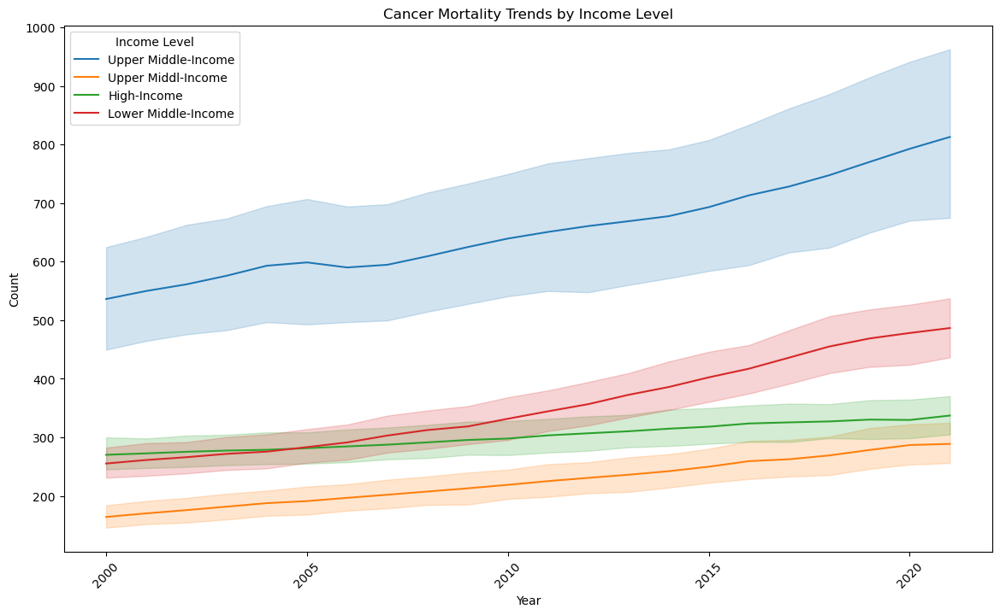

In [34]:
#CANCER MORTALITY TREND BY INCOME LEVEL AND YEAR 

filtered_data = data[data['measure_name'].isin(['Deaths'])]

# Plot the trend by income level and year for deaths and incidence
plt.figure(figsize=(14, 8))
sns.lineplot(data=filtered_data, x='year', y='val', hue='income_level')
plt.title('Cancer Mortality Trends by Income Level')
plt.xlabel('Year')
plt.ylabel('Count')
plt.legend(title='Income Level')
plt.xticks(rotation=45)
plt.show()

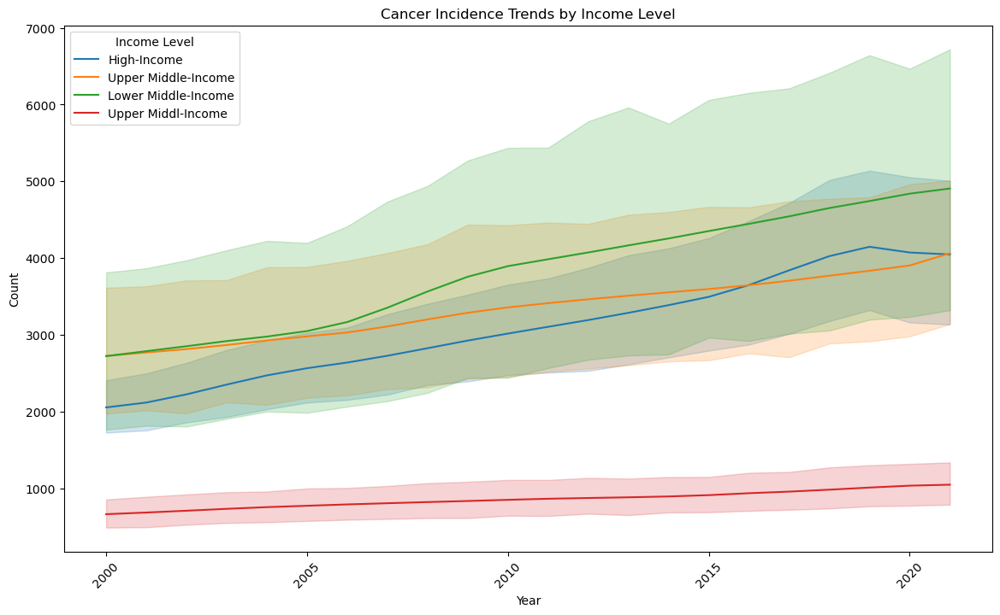

In [35]:
#CANCER INCIDENCE TREND BY INCOME LEVEL AND YEAR_Take clear view

filtered_data = data[data['measure_name'].isin(['Incidence'])]

# Plot the trend by income level and year for deaths and incidence
plt.figure(figsize=(14, 8))
sns.lineplot(data=filtered_data, x='year', y='val', hue='income_level')
plt.title('Cancer Incidence Trends by Income Level')
plt.xlabel('Year')
plt.ylabel('Count')
plt.legend(title='Income Level')
plt.xticks(rotation=45)
plt.show()

In [36]:
#IDENTIFY WHETHER THERE IS ANY RELATIONSHIP BETWEEN DEMOGRAPIC FACTORS

#FIND THE CANCER MORTALITY - RELATIONSHIP BETWEEN GENDER AND LOCATION

#Filter data for "Deaths"
deaths_data = data[data['measure_name'] == 'Deaths']

#Creating a contingency table for Deaths
contingency_table_deaths = pd.crosstab(deaths_data['sex_name'], deaths_data['location_name'])
print("\nContingency Table for Deaths:")
print(contingency_table_deaths)

#Chi-square test 
chi2_deaths, p_deaths, dof_deaths, expected_deaths = stats.chi2_contingency(contingency_table_deaths)

# Print results for Deaths
print("\nResults for Deaths - - Gender & Country")
print(f"Chi-square Statistic: {chi2_deaths}")
print(f"P-value: {p_deaths}")
print(f"Degrees of Freedom: {dof_deaths}")
print("Expected Frequencies:\n", expected_deaths)


Contingency Table for Deaths:
location_name  Australia  Brazil  China  France  India  Japan  Mexico  \
sex_name                                                                
Female             10692   10692  10692   10692  10692  10692   10692   
Male               10362   10362  10362   10362  10362  10362   10362   

location_name  Nigeria  Poland  South Africa  United Kingdom  \
sex_name                                                       
Female           10692   10692         10692           10692   
Male             10362   10362         10362           10362   

location_name  United States of America  
sex_name                                 
Female                            10692  
Male                              10362  

Results for Deaths - - Gender & Country
Chi-square Statistic: 0.0
P-value: 1.0
Degrees of Freedom: 11
Expected Frequencies:
 [[10692. 10692. 10692. 10692. 10692. 10692. 10692. 10692. 10692. 10692.
  10692. 10692.]
 [10362. 10362. 10362. 10362. 10362.

In [37]:
#FIND THE CANCER INCIDENCE - RELATIONSHIP BETWEEN GENDER AND LOCATION

#Filter data for "Incidence"
incidence_data = data[data['measure_name'] == 'Incidence']

# Create a contingency table for Incidence
contingency_table_incidence = pd.crosstab(incidence_data['sex_name'], incidence_data['location_name'])
print("\nContingency Table for Incidence:")
print(contingency_table_incidence)

#Chi-square test for Incidence
chi2_incidence, p_incidence, dof_incidence, expected_incidence = stats.chi2_contingency(contingency_table_incidence)

# Print results
print("\nResults for Incidence - Gender & Country")
print(f"Chi-square Statistic: {chi2_incidence}")
print(f"P-value: {p_incidence}")
print(f"Degrees of Freedom: {dof_incidence}")
print("Expected Frequencies:\n", expected_incidence)


Contingency Table for Incidence:
location_name  Australia  Brazil  China  France  India  Japan  Mexico  \
sex_name                                                                
Female             11616    9279  11616   11616   8769  11616   11174   
Male               10912    8883  10912   10912   8373  10912   10778   

location_name  Nigeria  Poland  South Africa  United Kingdom  \
sex_name                                                       
Female            8527   11616          8725           10960   
Male              8131   10912          8329           10256   

location_name  United States of America  
sex_name                                 
Female                            11616  
Male                              10912  

Results for Incidence - Gender & Country
Chi-square Statistic: 5.97487393266948
P-value: 0.8750354629073095
Degrees of Freedom: 11
Expected Frequencies:
 [[11578.57886736  9334.61245512 11578.57886736 11578.57886736
   8810.36927132 11578.57886736

In [38]:
#FIND THE CANCER MORTALITY - RELATIONSHIP BETWEEN GENDER AND AGE

#Filter data for "Deaths"
deaths_data = data[data['measure_name'] == 'Deaths']

#Creating a contingency table for Deaths
contingency_table_deaths = pd.crosstab(deaths_data['sex_name'], deaths_data['age_name'])
print("\nContingency Table for Deaths:")
print(contingency_table_deaths)

#Chi-square test 
chi2_deaths, p_deaths, dof_deaths, expected_deaths = stats.chi2_contingency(contingency_table_deaths)

#Print results
print("\nResults for Deaths - Gender & Age")
print(f"Chi-square Statistic: {chi2_deaths}")
print(f"P-value: {p_deaths}")
print(f"Degrees of Freedom: {dof_deaths}")
print("Expected Frequencies:\n", expected_deaths)


Contingency Table for Deaths:
age_name  0-14 years  15-19 years  20-24 years  25-29 years  30-34 years  \
sex_name                                                                   
Female          3696         6336         8448         8448         8448   
Male            3696         6072         8184         8184         8184   

age_name  35-39 years  40-44 years  45-49 years  50-54 years  55-59 years  \
sex_name                                                                    
Female           8448         8448         8448         8448         8448   
Male             8184         8184         8184         8184         8184   

age_name  60-64 years  65-69 years  70-74 years  75-79 years  80-84 years  \
sex_name                                                                    
Female           8448         8448         8448         8448         8448   
Male             8184         8184         8184         8184         8184   

age_name  85+ years  
sex_name             
Fe

In [39]:
#FIND THE CANCER INCIDENCE - RELATIONSHIP BETWEEN GENDER AND AGE

#Filter data for "Incidence"
incidence_data = data[data['measure_name'] == 'Incidence']

#Create a contingency table for Incidence
contingency_table_incidence = pd.crosstab(incidence_data['sex_name'], incidence_data['age_name'])
print("\nContingency Table for Incidence:")
print(contingency_table_incidence)

# Chi-square test for Incidence
chi2_incidence, p_incidence, dof_incidence, expected_incidence = stats.chi2_contingency(contingency_table_incidence)

#Print results
print("\nResults for Incidence - Gender & Age")
print(f"Chi-square Statistic: {chi2_incidence}")
print(f"P-value: {p_incidence}")
print(f"Degrees of Freedom: {dof_incidence}")
print("Expected Frequencies:\n", expected_incidence)


Contingency Table for Incidence:
age_name  0-14 years  15-19 years  20-24 years  25-29 years  30-34 years  \
sex_name                                                                   
Female          8030         7945         8014         8030         7942   
Male            7502         7527         7596         7612         7524   

age_name  35-39 years  40-44 years  45-49 years  50-54 years  55-59 years  \
sex_name                                                                    
Female           7962         7952         7898         7876         7876   
Male             7544         7534         7480         7458         7458   

age_name  60-64 years  65-69 years  70-74 years  75-79 years  80-84 years  \
sex_name                                                                    
Female           7876         7876         7986         7978         7898   
Male             7458         7458         7568         7560         7480   

age_name  85+ years  
sex_name             

In [40]:
#FIND THE CANCER MORTALITY - RELATIONSHIP BETWEEN GENDER AND INCOME LEVEL OF COUNTRY

#Filter data for "Deaths"
deaths_data = data[data['measure_name'] == 'Deaths']

#Creating a contingency table for Deaths
contingency_table_deaths = pd.crosstab(deaths_data['sex_name'], deaths_data['income_level'])
print("\nContingency Table for Deaths:")
print(contingency_table_deaths)

#Chi-square test 
chi2_deaths, p_deaths, dof_deaths, expected_deaths = stats.chi2_contingency(contingency_table_deaths)

#Print results
print("\nResults for Deaths - Gender & Income Level")
print(f"Chi-square Statistic: {chi2_deaths}")
print(f"P-value: {p_deaths}")
print(f"Degrees of Freedom: {dof_deaths}")
print("Expected Frequencies:\n", expected_deaths)


Contingency Table for Deaths:
income_level  High-Income  Lower Middle-Income  Upper Middl-Income  \
sex_name                                                             
Female              53460                21384               10692   
Male                51810                20724               10362   

income_level  Upper Middle-Income  
sex_name                           
Female                      42768  
Male                        41448  

Results for Deaths - Gender & Income Level
Chi-square Statistic: 0.0
P-value: 1.0
Degrees of Freedom: 3
Expected Frequencies:
 [[53460. 21384. 10692. 42768.]
 [51810. 20724. 10362. 41448.]]


In [41]:
#FIND THE CANCER INCIDENCE - RELATIONSHIP BETWEEN GENDER AND INCOME LEVEL OF COUNTRY

#Filter data for "Incidence"
incidence_data = data[data['measure_name'] == 'Incidence']

#Create a contingency table for Incidence
contingency_table_incidence = pd.crosstab(incidence_data['sex_name'], incidence_data['income_level'])
print("\nContingency Table for Incidence:")
print(contingency_table_incidence)

# Chi-square test for Incidence
chi2_incidence, p_incidence, dof_incidence, expected_incidence = stats.chi2_contingency(contingency_table_incidence)

#Print results 
print("\nResults for Incidence - Gender & Income Level")
print(f"Chi-square Statistic: {chi2_incidence}")
print(f"P-value: {p_incidence}")
print(f"Degrees of Freedom: {dof_incidence}")
print("Expected Frequencies:\n", expected_incidence)


Contingency Table for Incidence:
income_level  High-Income  Lower Middle-Income  Upper Middl-Income  \
sex_name                                                             
Female              57424                17296                9279   
Male                53904                16504                8883   

income_level  Upper Middle-Income  
sex_name                           
Female                      43131  
Male                        40931  

Results for Incidence - Gender & Income Level
Chi-square Statistic: 3.1424280298525966
P-value: 0.3701825886420784
Degrees of Freedom: 3
Expected Frequencies:
 [[57218.57369255 17371.98001229  9334.61245512 43204.83384003]
 [54109.42630745 16428.01998771  8827.38754488 40857.16615997]]


In [42]:
#FIND THE CANCER MORTALITY - RELATIONSHIP BETWEEN AGE AND INCOME LEVEL OF COUNTRY

#Filter data for "Deaths"
deaths_data = data[data['measure_name'] == 'Deaths']

#Creating a contingency table for Deaths
contingency_table_deaths = pd.crosstab(deaths_data['age_name'], deaths_data['income_level'])
print("\nContingency Table for Deaths:")
print(contingency_table_deaths)

#Chi-square test 
chi2_deaths, p_deaths, dof_deaths, expected_deaths = stats.chi2_contingency(contingency_table_deaths)

#Print results
print("\nResults for Deaths - Age & Income Level")
print(f"Chi-square Statistic: {chi2_deaths}")
print(f"P-value: {p_deaths}")
print(f"Degrees of Freedom: {dof_deaths}")
print("Expected Frequencies:\n", expected_deaths)


Contingency Table for Deaths:
income_level  High-Income  Lower Middle-Income  Upper Middl-Income  \
age_name                                                             
0-14 years           3080                 1232                 616   
15-19 years          5170                 2068                1034   
20-24 years          6930                 2772                1386   
25-29 years          6930                 2772                1386   
30-34 years          6930                 2772                1386   
35-39 years          6930                 2772                1386   
40-44 years          6930                 2772                1386   
45-49 years          6930                 2772                1386   
50-54 years          6930                 2772                1386   
55-59 years          6930                 2772                1386   
60-64 years          6930                 2772                1386   
65-69 years          6930                 2772             

In [43]:
#FIND THE CANCER INCIDENCE - RELATIONSHIP BETWEEN AGE AND INCOME LEVEL OF COUNTRY

#Filter data for "Incidence"
incidence_data = data[data['measure_name'] == 'Incidence']

# Create a contingency table for Incidence
contingency_table_incidence = pd.crosstab(incidence_data['age_name'], incidence_data['income_level'])
print("\nContingency Table for Incidence:")
print(contingency_table_incidence)

#Chi-square test
chi2_incidence, p_incidence, dof_incidence, expected_incidence = stats.chi2_contingency(contingency_table_incidence)

#Print results 
print("\nResults for Incidence - Age & Income Level")
print(f"Chi-square Statistic: {chi2_incidence}")
print(f"P-value: {p_incidence}")
print(f"Degrees of Freedom: {dof_incidence}")
print("Expected Frequencies:\n", expected_incidence)


Contingency Table for Incidence:
income_level  High-Income  Lower Middle-Income  Upper Middl-Income  \
age_name                                                             
0-14 years           6952                 2156                1144   
15-19 years          6958                 2156                1122   
20-24 years          6952                 2228                1158   
25-29 years          6952                 2244                1166   
30-34 years          6952                 2156                1122   
35-39 years          6952                 2156                1122   
40-44 years          6952                 2140                1122   
45-49 years          6952                 2068                1122   
50-54 years          6952                 2024                1122   
55-59 years          6952                 2024                1122   
60-64 years          6952                 2024                1122   
65-69 years          6952                 2024          

In [44]:
#FIND THE CANCER MORTALITY - RELATIONSHIP BETWEEN AGE AND COUNTRY

#Filter data for "Deaths"
deaths_data = data[data['measure_name'] == 'Deaths']

#Creating a contingency table for Deaths
contingency_table_deaths = pd.crosstab(deaths_data['age_name'], deaths_data['location_name'])
print("\nContingency Table for Deaths:")
print(contingency_table_deaths)

#Chi-square test 
chi2_deaths, p_deaths, dof_deaths, expected_deaths = stats.chi2_contingency(contingency_table_deaths)

#Print results
print("\nResults for Deaths - Age & Country")
print(f"Chi-square Statistic: {chi2_deaths}")
print(f"P-value: {p_deaths}")
print(f"Degrees of Freedom: {dof_deaths}")
print("Expected Frequencies:\n", expected_deaths)


Contingency Table for Deaths:
location_name  Australia  Brazil  China  France  India  Japan  Mexico  \
age_name                                                                
0-14 years           616     616    616     616    616    616     616   
15-19 years         1034    1034   1034    1034   1034   1034    1034   
20-24 years         1386    1386   1386    1386   1386   1386    1386   
25-29 years         1386    1386   1386    1386   1386   1386    1386   
30-34 years         1386    1386   1386    1386   1386   1386    1386   
35-39 years         1386    1386   1386    1386   1386   1386    1386   
40-44 years         1386    1386   1386    1386   1386   1386    1386   
45-49 years         1386    1386   1386    1386   1386   1386    1386   
50-54 years         1386    1386   1386    1386   1386   1386    1386   
55-59 years         1386    1386   1386    1386   1386   1386    1386   
60-64 years         1386    1386   1386    1386   1386   1386    1386   
65-69 years         

In [45]:
#FIND THE CANCER INCIDENCE - RELATIONSHIP BETWEEN AGE AND COUNTRY

#Filter data for "Incidence"
incidence_data = data[data['measure_name'] == 'Incidence']

#Create a contingency table 
contingency_table_incidence = pd.crosstab(incidence_data['age_name'], incidence_data['location_name'])
print("\nContingency Table for Incidence:")
print(contingency_table_incidence)

#Chi-square test
chi2_incidence, p_incidence, dof_incidence, expected_incidence = stats.chi2_contingency(contingency_table_incidence)

#Print results 
print("\nResults for Incidence - Age & Country")
print(f"Chi-square Statistic: {chi2_incidence}")
print(f"P-value: {p_incidence}")
print(f"Degrees of Freedom: {dof_incidence}")
print("Expected Frequencies:\n", expected_incidence)


Contingency Table for Incidence:
location_name  Australia  Brazil  China  France  India  Japan  Mexico  \
age_name                                                                
0-14 years          1408    1144   1408    1408   1100   1408    1364   
15-19 years         1408    1122   1408    1408   1078   1408    1342   
20-24 years         1408    1158   1408    1408   1114   1408    1342   
25-29 years         1408    1166   1408    1408   1122   1408    1342   
30-34 years         1408    1122   1408    1408   1078   1408    1342   
35-39 years         1408    1122   1408    1408   1078   1408    1382   
40-44 years         1408    1122   1408    1408   1070   1408    1386   
45-49 years         1408    1122   1408    1408   1034   1408    1386   
50-54 years         1408    1122   1408    1408   1034   1408    1386   
55-59 years         1408    1122   1408    1408   1034   1408    1386   
60-64 years         1408    1122   1408    1408   1034   1408    1386   
65-69 years      

In [46]:
#EFFECT ON INCOME LEVEL ON CANCER COUNT 

#Function to perform ANOVA 
def perform_anova(data, measure_name):
    # Filter data for the specific measure
    groups = data[data['measure_name'] == measure_name].groupby('income_level')['val'].apply(list)
    
    #F value, P value
    f_statistic, p_value = stats.f_oneway(*groups)

    #Print results
    print(f"Results for {measure_name}:")
    print(f"F-Statistic: {f_statistic:.4f}, P-value: {p_value:.4f}")
    print("Reject the null hypothesis." if p_value < 0.05 else "Accept the null hypothesis.")
    print("=" * 50)

#ANOVA for both Deaths and Incidence
for measure in ["Deaths", "Incidence"]:
    perform_anova(data, measure) 

Results for Deaths:
F-Statistic: 502.0377, P-value: 0.0000
Reject the null hypothesis.
Results for Incidence:
F-Statistic: 56.7060, P-value: 0.0000
Reject the null hypothesis.


In [47]:
#POST-HOC ANALYSIS

#Recoding dictionary
income_id = {
    'Upper Middle-Income': 1,
    'Lower Middle-Income': 2,
    'High-Income': 3
}

#Recode the income_level in new column
data['income_id'] = data['income_level'].replace(income_id)

#Display the updated DataFrame
print(data)

        measure_id measure_name  location_id   location_name  sex_id sex_name  \
0                1       Deaths          130          Mexico       1     Male   
1                1       Deaths          130          Mexico       2   Female   
2                1       Deaths          130          Mexico       1     Male   
3                1       Deaths          130          Mexico       2   Female   
4                1       Deaths          130          Mexico       1     Male   
...            ...          ...          ...             ...     ...      ...   
499995           6    Incidence           95  United Kingdom       2   Female   
499996           6    Incidence           95  United Kingdom       1     Male   
499997           6    Incidence           95  United Kingdom       2   Female   
499998           6    Incidence           95  United Kingdom       1     Male   
499999           6    Incidence           95  United Kingdom       2   Female   

        age_id     age_name

In [48]:
#Tukey's HSD post-hoc test

def perform_posthoc(data, measure_name):
    measure_data = data[data['measure_name'] == measure_name].copy()  # Create a copy to avoid modifying the original

    #Convert 'income_id' to numeric
    measure_data.loc[:, 'income_id'] = pd.to_numeric(measure_data['income_id'], errors='coerce')

    #Optionally drop rows where 'income_id' is NaN (if any)
    measure_data = measure_data.dropna(subset=['income_id'])

    #Check 'income_id' is categorical after conversion
    measure_data.loc[:, 'income_id'] = measure_data['income_id'].astype('category')

    #Fit the model
    model = ols('val ~ C(income_id)', data=measure_data).fit()

    #Perform Tukey's HSD test
    tukey_results = pairwise_tukeyhsd(endog=measure_data['val'], groups=measure_data['income_id'], alpha=0.05)

    #Print Tukey's HSD results
    print(f"\nTukey's HSD Results for {measure_name}:")
    print(tukey_results)
    print("=" * 50)

#Perform Tukey's HSD for "Deaths" and "Incidence"
for measure in ["Deaths", "Incidence"]:
    perform_posthoc(data, measure)


Tukey's HSD Results for Deaths:
   Multiple Comparison of Means - Tukey HSD, FWER=0.05   
group1 group2  meandiff p-adj    lower     upper   reject
---------------------------------------------------------
   1.0    2.0   -300.71    0.0 -332.3291 -269.0909   True
   1.0    3.0 -352.3121    0.0 -376.8041 -327.8201   True
   2.0    3.0  -51.6021 0.0002   -82.149  -21.0552   True
---------------------------------------------------------

Tukey's HSD Results for Incidence:
   Multiple Comparison of Means - Tukey HSD, FWER=0.05    
group1 group2  meandiff p-adj    lower      upper   reject
----------------------------------------------------------
   1.0    2.0  476.1294 0.0163    70.7778  881.4809   True
   1.0    3.0 -243.6881 0.1156  -531.2638   43.8877  False
   2.0    3.0 -719.8174    0.0 -1110.6747 -328.9601   True
----------------------------------------------------------


In [49]:
#EFFECT ON AGE ON CANCER COUNT 

#Function to perform ANOVA 
def perform_anova(data, measure_name):
    # Filter data for the specific measure
    groups = data[data['measure_name'] == measure_name].groupby('age_name', observed=True)['val'].apply(list)
    
    #F value, P value
    f_statistic, p_value = stats.f_oneway(*groups)

    #Print results
    print(f"Results for {measure_name}:")
    print(f"F-Statistic: {f_statistic:.4f}, P-value: {p_value:.4f}")
    print("Reject the null hypothesis." if p_value < 0.05 else "Accept the null hypothesis.")
    print("=" * 50)

#ANOVA for both Deaths and Incidence
for measure in ["Deaths", "Incidence"]:
    perform_anova(data, measure)

Results for Deaths:
F-Statistic: 368.4058, P-value: 0.0000
Reject the null hypothesis.
Results for Incidence:
F-Statistic: 20.4846, P-value: 0.0000
Reject the null hypothesis.


In [50]:
#POST-HOC ANALYSIS

#Tukey's HSD post-hoc test
def perform_posthoc(data, measure_name):
    
    measure_data = data[data['measure_name'] == measure_name]

    #Fit the model
    model = ols('val ~ C(age_name)', data=measure_data).fit()

    #Perform Tukey's HSD
    tukey_results = pairwise_tukeyhsd(endog=measure_data['val'], groups=measure_data['age_name'], alpha=0.05)

    #Print Tukey's HSD results
    print(f"\nTukey's HSD Results for {measure_name}:")
    print(tukey_results)
    print("=" * 50)

# Perform Tukey's HSD for both Deaths and Incidence
for measure in ["Deaths", "Incidence"]:
    perform_posthoc(data, measure)


Tukey's HSD Results for Deaths:
        Multiple Comparison of Means - Tukey HSD, FWER=0.05        
   group1      group2    meandiff p-adj    lower     upper   reject
-------------------------------------------------------------------
 0-14 years 15-19 years -103.3963 0.0803 -211.6695     4.877  False
 0-14 years 20-24 years -104.9826 0.0405 -207.9951   -1.9701   True
 0-14 years 25-29 years  -94.8618 0.1121 -197.8743    8.1507  False
 0-14 years 30-34 years  -67.7046 0.6598 -170.7171   35.3079  False
 0-14 years 35-39 years  -21.0597    1.0 -124.0722   81.9527  False
 0-14 years 40-44 years   54.0384 0.9179  -48.9741  157.0509  False
 0-14 years 45-49 years  155.6144    0.0   52.6019  258.6269   True
 0-14 years 50-54 years  303.3942    0.0  200.3818  406.4067   True
 0-14 years 55-59 years  443.5068    0.0  340.4943  546.5193   True
 0-14 years 60-64 years   582.953    0.0  479.9405  685.9655   True
 0-14 years 65-69 years  694.8231    0.0  591.8106  797.8356   True
 0-14 years 70-

In [51]:
#DICKEY-FULLER TEST

#Reduce dataset size for the test
#subset = data['val'].iloc[:10000] 

#Perform ADF test
#adf_result = adfuller(subset)

#Extract and interpret results
#print("ADF Statistic:", adf_result[0])
#print("p-value:", adf_result[1])
#print("Critical Values:", adf_result[4])

#if adf_result[1] < 0.05:
 #   print("The time series is non stationary (reject null hypothesis).")
#else:
  #  print("The time series is stationary (fail to reject null hypothesis).")


In [52]:
#DICKEY FULLER TEST - DEATHS

#Filter the data for 'Deaths'
deaths_data = data[data['measure_name'] == 'Deaths']

#Aggregate the data by year
aggregated_deaths = deaths_data.groupby('year')['val'].sum()

#Perform the ADF test 
adf_result = adfuller(aggregated_deaths)

#Print the results
print("ADF Statistic:", adf_result[0])
print("p-value:", adf_result[1])
print("Critical Values:", adf_result[4])

if adf_result[1] < 0.05:
    print("The time series is not stationary - data has unit root")
else:
    print("The time series is stationary - data has no unit root")


ADF Statistic: 3.5625948047600247
p-value: 1.0
Critical Values: {'1%': -4.137829282407408, '5%': -3.1549724074074077, '10%': -2.7144769444444443}
The time series is stationary - data has no unit root


In [53]:
#DICKEY FULLER TEST - INCIDENCE

#Filter the data for 'Deaths'
deaths_incidence = data[data['measure_name'] == 'Incidence']

#Aggregate the data by year
aggregated_incidence = deaths_data.groupby('year')['val'].sum()

#Perform the ADF test 
adf_result = adfuller(aggregated_incidence)

#Print the results
print("ADF Statistic:", adf_result[0])
print("p-value:", adf_result[1])
print("Critical Values:", adf_result[4])

if adf_result[1] < 0.05:
    print("The time series is not stationary - data has unit root")
else:
    print("The time series is stationary - data has no unit root")

ADF Statistic: 3.5625948047600247
p-value: 1.0
Critical Values: {'1%': -4.137829282407408, '5%': -3.1549724074074077, '10%': -2.7144769444444443}
The time series is stationary - data has no unit root


In [54]:
import warnings

# Suppress all warnings of type UserWarning
warnings.simplefilter('ignore', category=UserWarning)

Fitting ARIMA(0,2,0) on training data...



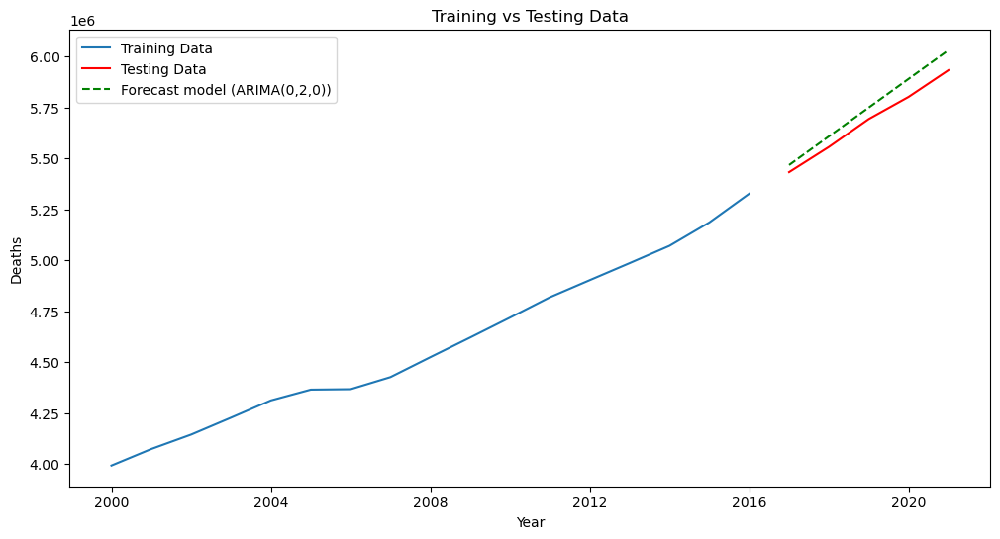

RMSE value: 70104.87


In [67]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

#TRAINING AND TESTING DATA

#Filter the death data
deaths_series_auto = data[data['measure_name'] == 'Deaths'].groupby('year')['val'].sum().reset_index()
deaths_series_auto.set_index('year', inplace=True)
deaths_series_auto.index = pd.to_datetime(deaths_series_auto.index, format='%Y')

#Split data into training and testing
train_size = int(len(deaths_series_auto) * 0.8)  
train, test = deaths_series_auto[:train_size], deaths_series_auto[train_size:]

#Fit ARIMA(0,2,0) model on training data
print("Fitting ARIMA(0,2,0) on training data...\n")
model = ARIMA(train['val'], order=(0, 2, 0))  # Set ARIMA order explicitly
model_fit = model.fit()

#Forecast on test set
n_periods = len(test)  
forecast = model_fit.forecast(steps=n_periods)

#Plot the results
plt.figure(figsize=(12, 6))
plt.plot(train.index, train['val'], label='Training Data')
plt.plot(test.index, test['val'], label='Testing Data', color='red')
plt.plot(test.index, forecast, label='Forecast model (ARIMA(0,2,0))', color='green', linestyle='--')
plt.title("Training vs Testing Data")
plt.xlabel("Year")
plt.ylabel("Deaths")
plt.legend()
plt.show()

#Calculate RMSE to evaluate forecast performance
rmse = np.sqrt(mean_squared_error(test['val'], forecast))
print(f"RMSE value: {rmse:.2f}")


ARIMA Model Results for Deaths:
                               SARIMAX Results                                
Dep. Variable:                    val   No. Observations:                   22
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -247.129
Date:                Mon, 16 Dec 2024   AIC                            500.258
Time:                        22:44:32   BIC                            503.392
Sample:                    01-01-2000   HQIC                           500.938
                         - 01-01-2021                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0000      0.006    181.627      0.000       0.989       1.011
ma.L1         -0.9990      0.131     -7.597      0.000      -1.257      -0.741
sigma2      7.702e+

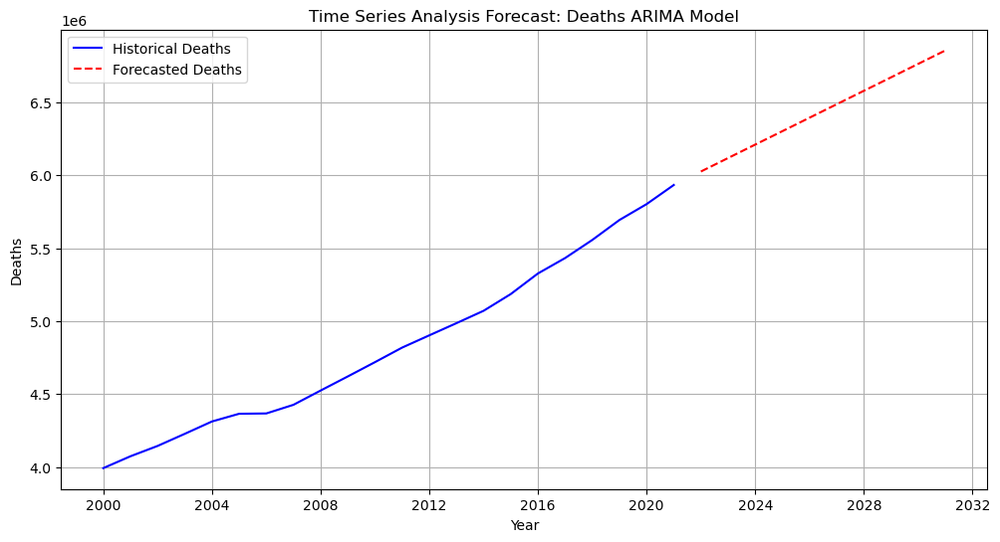

In [55]:
#TIME SERIES ANALYSIS

#ARIMA MODEL - DEATHS

#Aggregate Deaths by year
deaths_series = data[data['measure_name'] == 'Deaths'].groupby('year')['val'].sum().reset_index()

#Prepare time series for Deaths
deaths_series.set_index('year', inplace=True)
deaths_series.index = pd.to_datetime(deaths_series.index, format='%Y')

#Define function
def run_arima_and_plot(series, title, color_historical, color_forecast):
    #Fit ARIMA model
    model = ARIMA(series['val'], order=(1, 1, 1))  # Adjust the (p, d, q) order as needed
    result = model.fit()
    
    #Forecast the next 10 years
    forecast = result.forecast(steps=10)
    
    #Print results
    print(f"\nARIMA Model Results for {title}:")
    print(result.summary())
    print(f"Forecasted Values ({title}):")
    print(forecast)
    
    #Plot historical and forecasted values
    historical_years = series.index
    forecast_years = pd.date_range(start=historical_years[-1] + pd.offsets.YearEnd(1), periods=10, freq='YE')
    historical_values = series['val']
    
    plt.figure(figsize=(12, 6))
    plt.plot(historical_years, historical_values, label=f"Historical {title}", color=color_historical)
    plt.plot(forecast_years, forecast, label=f"Forecasted {title}", color=color_forecast, linestyle='--')
    plt.title(f"Time Series Analysis Forecast: Deaths ARIMA Model")
    plt.xlabel("Year")
    plt.ylabel(title)
    plt.legend()
    plt.grid()
    plt.show()

# Run for Deaths
run_arima_and_plot(deaths_series, "Deaths", color_historical='blue', color_forecast='red')


In [56]:
!pip install pmdarima

Defaulting to user installation because normal site-packages is not writeable


In [57]:
#Automatically selects the best ARIMA model

from pmdarima import auto_arima

# Filter the death data
deaths_series_auto = data[data['measure_name'] == 'Deaths'].groupby('year')['val'].sum().reset_index()
deaths_series_auto.set_index('year', inplace=True)
deaths_series_auto.index = pd.to_datetime(deaths_series_auto.index, format='%Y')

# Auto ARIMA model fitting and summary
def auto_arima_summary(series, title):
    # Fit Auto ARIMA model
    model = auto_arima(series['val'], seasonal=False, stepwise=True, trace=True)
    
    # Print model summary
    print(f"\nAuto ARIMA Model Results for {title}:")
    print(model.summary())
    
    # Forecast the next 10 years
    forecast = model.predict(n_periods=10)
    print(f"\nForecasted Values ({title}):")
    print(forecast)

    # Return model and forecast for further use
    return model, forecast

# Run the ARIMA summary
model, forecast = auto_arima_summary(deaths_series_auto, "Deaths")


Performing stepwise search to minimize aic
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=525.647, Time=0.09 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=467.092, Time=0.01 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=468.851, Time=0.02 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=468.950, Time=0.02 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=465.372, Time=0.01 sec
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=470.948, Time=0.05 sec

Best model:  ARIMA(0,2,0)(0,0,0)[0]          
Total fit time: 0.192 seconds

Auto ARIMA Model Results for Deaths:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   22
Model:               SARIMAX(0, 2, 0)   Log Likelihood                -231.686
Date:                Mon, 16 Dec 2024   AIC                            465.372
Time:                        22:44:36   BIC                            466.368
Sample:                    01-01-2000   HQIC             

In [58]:
#Manual Tunning - 1 AUTOMATIC ARIMA MODEL

#Aggregate Deaths by year
deaths_series = data[data['measure_name'] == 'Deaths'].groupby('year')['val'].sum().reset_index()

#Prepare time series for Deaths
deaths_series.set_index('year', inplace=True)
deaths_series.index = pd.to_datetime(deaths_series.index, format='%Y')

#Define function
def run_arima_and_plot(series, title):
    #Fit ARIMA model
    model1 = ARIMA(series['val'], order=(1, 2, 0)) 
    model2 = ARIMA(series['val'], order=(0, 2, 1)) 
    model3 = ARIMA(series['val'], order=(1, 2, 1)) 
    model4 = ARIMA(series['val'], order=(0, 1, 0)) 
    model5 = ARIMA(series['val'], order=(1, 1, 0)) 
    model6 = ARIMA(series['val'], order=(0, 1, 1)) 
    result1 = model1.fit()
    result2 = model2.fit()
    result3 = model3.fit()
    result4 = model4.fit()
    result5 = model5.fit()
    result6 = model6.fit()
    
    #Print results
    print(f"\nARIMA Model Results for {title}:")
    print(result1.summary())
    print(result2.summary())
    print(result3.summary())
    print(result4.summary())
    print(result5.summary())
    print(result6.summary())
    
# Run for Deaths
run_arima_and_plot(deaths_series, "Deaths")


ARIMA Model Results for Deaths:
                               SARIMAX Results                                
Dep. Variable:                    val   No. Observations:                   22
Model:                 ARIMA(1, 2, 0)   Log Likelihood                -231.570
Date:                Mon, 16 Dec 2024   AIC                            467.140
Time:                        22:44:37   BIC                            469.132
Sample:                    01-01-2000   HQIC                           467.529
                         - 01-01-2021                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0027      0.160      0.017      0.987      -0.312       0.317
sigma2      6.989e+08   2.16e-11   3.23e+19      0.000    6.99e+08    6.99e+08
Ljung-Box (L1) (Q):

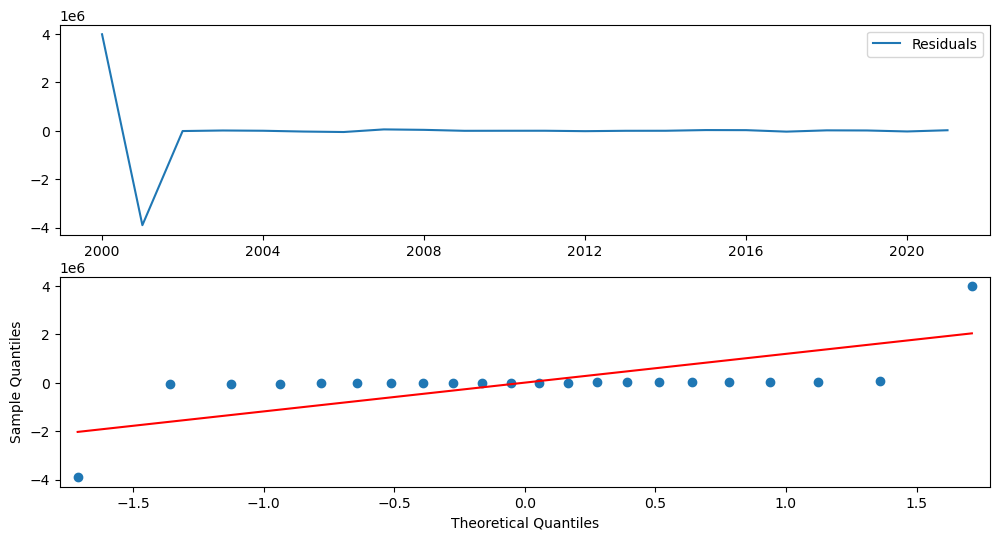

    lb_stat  lb_pvalue
10   6.2339   0.795244


In [59]:
#CHECK RESIDUAL ARIMA(0,2,0) MODEL

#Fit the model
final_model = ARIMA(deaths_series_auto['val'], order=(0, 2, 0)).fit()

#Plot residuals
residuals = final_model.resid
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.plot(residuals, label="Residuals")
plt.legend()
plt.subplot(2, 1, 2)
sm.qqplot(residuals, line='s', ax=plt.gca())
plt.show()

#Ljung-Box test
from statsmodels.stats.diagnostic import acorr_ljungbox

lb_test = acorr_ljungbox(residuals, lags=[10], return_df=True)
print(lb_test)


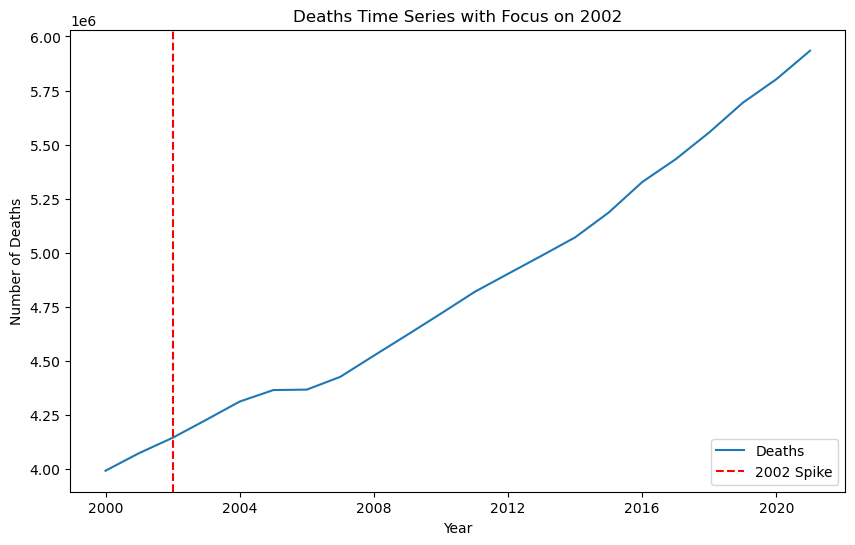

                     val
year                    
2001-01-01  4.073225e+06
2002-01-01  4.144086e+06
2003-01-01  4.227068e+06


In [60]:
#Original time series to check the spike
year_2002 = pd.Timestamp('2002')

#Plot the graph
plt.figure(figsize=(10, 6))
plt.plot(deaths_series.index, deaths_series['val'], label='Deaths')
plt.axvline(x=year_2002, color='red', linestyle='--', label='2002 Spike')
plt.title('Deaths Time Series with Focus on 2002')
plt.xlabel('Year')
plt.ylabel('Number of Deaths')
plt.legend()
plt.show()


#Check 2002 value with 2001 and 2003
deaths_2002 = deaths_series.loc['2001':'2003'] 
print(deaths_2002)

In [61]:
#Check outliers for deaths

#Calculate Z-scores for the data
deaths_series['z_score'] = (deaths_series['val'] - deaths_series['val'].mean()) / deaths_series['val'].std()

#Check Z-score for 2002
print(deaths_series.loc['2002', 'z_score'])

year
2002-01-01   -1.173607
Name: z_score, dtype: float64


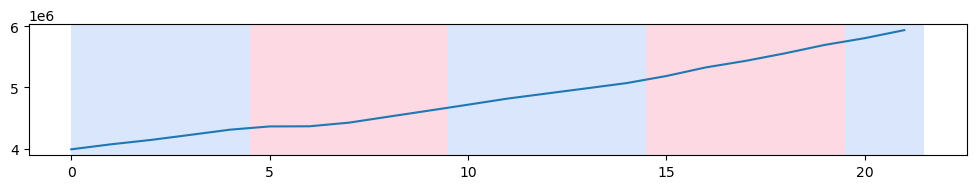

In [62]:
import ruptures as rpt

# Use Pelt search to find change points
model = "l2"  # Model for change detection
algo = rpt.Pelt(model=model).fit(deaths_series['val'].values)
result = algo.predict(pen=10)

# Plot the change points
rpt.display(deaths_series['val'].values, result)
plt.show()

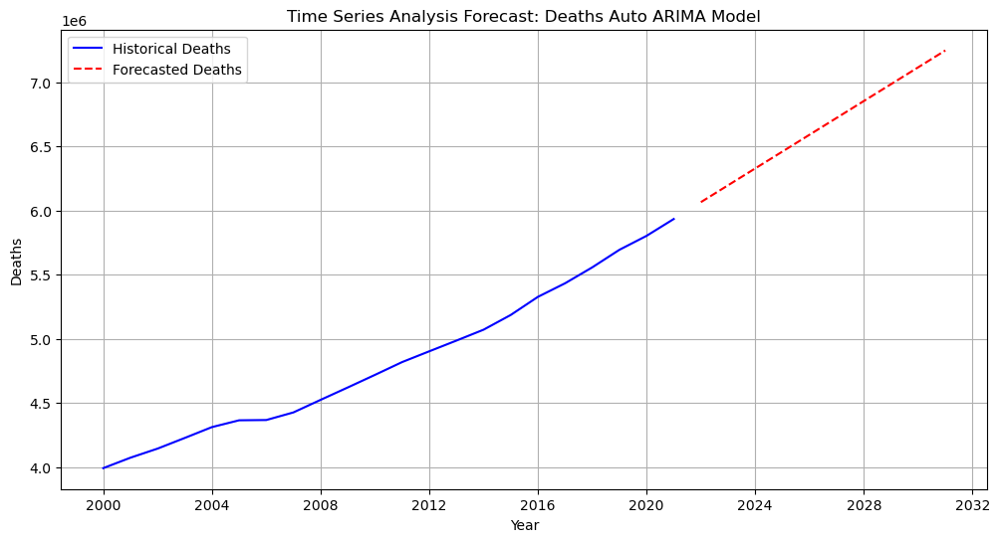

In [63]:
#Forecast deaths for next 10 years

# Function to plot historical and forecast data separately
def plot_auto_arima_forecast(series, forecast, title, color_historical, color_forecast):
    # Prepare the forecast years
    historical_years = series.index
    forecast_years = pd.date_range(start=historical_years[-1] + pd.offsets.YearEnd(1), periods=10, freq='YS')
    historical_values = series['val']
    
    #Plot historical and forecast data
    historical_years = series.index
    forecast_years = pd.date_range(start=historical_years[-1] + pd.offsets.YearEnd(1), periods=10, freq='YS')
    historical_values = series['val']
    
    plt.figure(figsize=(12, 6))
    plt.plot(historical_years, historical_values, label=f"Historical {title}", color=color_historical)
    plt.plot(forecast_years, forecast, label=f"Forecasted {title}", color=color_forecast, linestyle='--')
    plt.title(f"Time Series Analysis Forecast: Deaths Auto ARIMA Model")
    plt.xlabel("Year")
    plt.ylabel(title)
    plt.legend()
    plt.grid()
    plt.show()

# Run the plotting function
plot_auto_arima_forecast(deaths_series_auto, forecast, "Deaths", color_historical='blue', color_forecast='red')


ARIMA Model Results for Incidence:
                               SARIMAX Results                                
Dep. Variable:                    val   No. Observations:                   22
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -293.706
Date:                Mon, 16 Dec 2024   AIC                            593.412
Time:                        22:44:37   BIC                            596.546
Sample:                    01-01-2000   HQIC                           594.092
                         - 01-01-2021                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9979      0.015     68.607      0.000       0.969       1.026
ma.L1         -0.9874      0.046    -21.259      0.000      -1.078      -0.896
sigma2      9.89

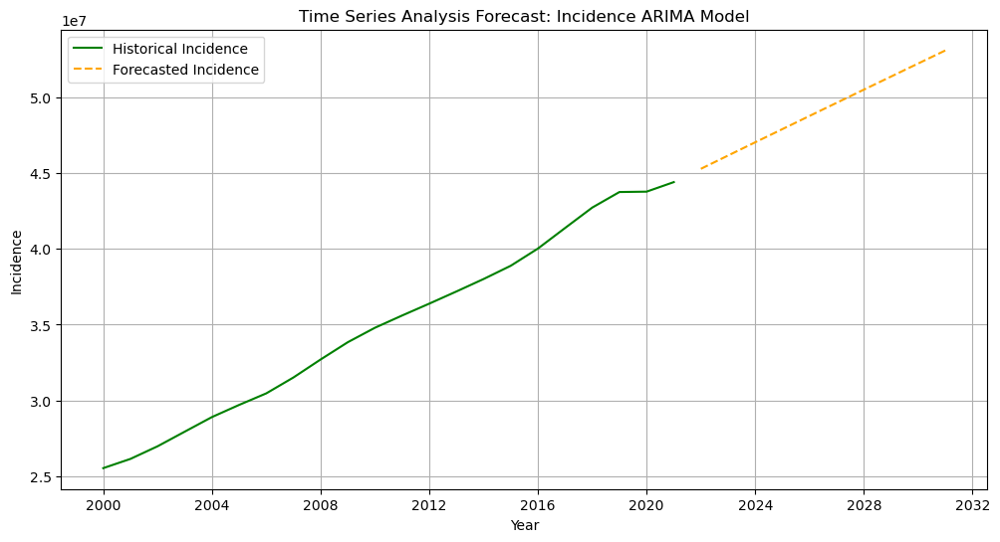

In [64]:
#Aggregate Incidence by year
incidence_series = data[data['measure_name'] == 'Incidence'].groupby('year')['val'].sum().reset_index()

#Prepare time series for Incidence
incidence_series.set_index('year', inplace=True)
incidence_series.index = pd.to_datetime(incidence_series.index, format='%Y')

#Define function
def run_arima_and_plot(series, title, color_historical, color_forecast):
    # Fit ARIMA model
    model = ARIMA(series['val'], order=(1, 1, 1))  
    result = model.fit()
    
    # Forecast the next 10 years
    forecast = result.forecast(steps=10)
    
    # Print results
    print(f"\nARIMA Model Results for {title}:")
    print(result.summary())
    print(f"Forecasted Values ({title}):")
    print(forecast)
    
    # Plot historical and forecasted values
    historical_years = series.index
    forecast_years = pd.date_range(start=historical_years[-1] + pd.offsets.YearEnd(0), periods=10, freq='YE')
    historical_values = series['val']
    
    plt.figure(figsize=(12, 6))
    plt.plot(historical_years, historical_values, label=f"Historical {title}", color=color_historical)
    plt.plot(forecast_years, forecast, label=f"Forecasted {title}", color=color_forecast, linestyle='--')
    plt.title(f"Time Series Analysis Forecast: {title} ARIMA Model")
    plt.xlabel("Year")
    #plt.xticks(range(2000, 2033, 2))
    plt.ylabel(title)
    plt.legend()
    plt.grid()
    plt.show()

# Run for Incidence
run_arima_and_plot(incidence_series, "Incidence", color_historical='green', color_forecast='orange')

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=598.618, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=590.390, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=632.555, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=592.973, Time=0.01 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=639.327, Time=0.01 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=596.370, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0] intercept
Total fit time: 0.180 seconds

Auto ARIMA Model Results for Incidence:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   22
Model:               SARIMAX(0, 1, 0)   Log Likelihood                -293.195
Date:                Mon, 16 Dec 2024   AIC                            590.390
Time:                        22:44:38   BIC                            592.479
Sample:                    01-01-2000   HQIC          

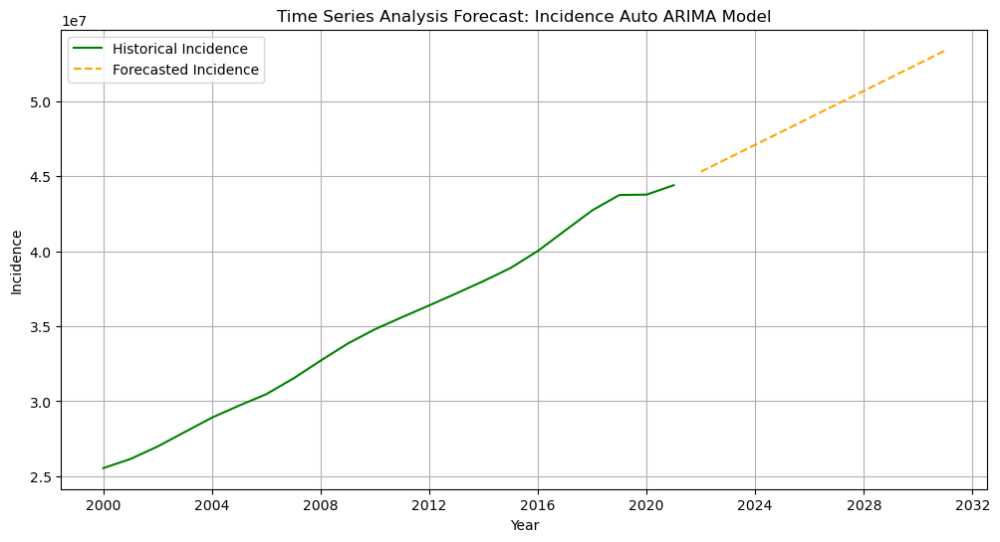

In [65]:
from pmdarima import auto_arima

# Aggregate Incidence by year
incidence_series = data[data['measure_name'] == 'Incidence'].groupby('year')['val'].sum().reset_index()

# Prepare time series for Incidence
incidence_series.set_index('year', inplace=True)
incidence_series.index = pd.to_datetime(incidence_series.index, format='%Y')

# Define function for Auto ARIMA and plotting
def run_auto_arima_and_plot(series, title, color_historical, color_forecast):
    # Fit Auto ARIMA model
    model = auto_arima(series['val'], seasonal=False, stepwise=True, trace=True)
    
    # Print model summary
    print(f"\nAuto ARIMA Model Results for {title}:")
    print(model.summary())
    
    # Forecast the next 10 years
    forecast = model.predict(n_periods=10)

    # Print forecast results
    print(f"\nARIMA Model Results for {title}:")
    print(f"Forecasted Values ({title}):")
    print(forecast)
    
    # Plot historical and forecast data
    historical_years = series.index
    forecast_years = pd.date_range(start=historical_years[-1] + pd.offsets.YearEnd(1), periods=10, freq='YS')
    historical_values = series['val']
    
    plt.figure(figsize=(12, 6))
    plt.plot(historical_years, historical_values, label=f"Historical {title}", color=color_historical)
    plt.plot(forecast_years, forecast, label=f"Forecasted {title}", color=color_forecast, linestyle='--')
    plt.title(f"Time Series Analysis Forecast: {title} Auto ARIMA Model")
    plt.xlabel("Year")
    plt.ylabel(title)
    plt.legend()
    plt.grid()
    plt.show()

# Run Auto ARIMA for Incidence
run_auto_arima_and_plot(incidence_series, "Incidence", color_historical='green', color_forecast='orange')